<h3 align="center"><b>Modelo predictivo para la mortalidad en urgencias por Trauma: Integración de variables clínicas y socioespaciales en Cali, 2012-2013.</b></h3>

<h3 align="center"><b>Nicolas Orozco Echeverri, Andrea Valencia Orozco.</b></h3>

<h3 align="center"><b>Trabajo de grado I</b></h3>


<div style="color:black;
           display:fill;
           border-radius:4px;
           font-size:100%;
           font-family:cursive;
           letter-spacing:2px;
           background-color:lightskyblue;
           color:black;
           font-family:verdana
           ">
<h2 style="text-align:center;">Explorando los datos</h2>
</div>

In [199]:
import math
import seaborn as sns
import pandas as pd
import numpy as np
import pyarrow as pa
import matplotlib.pyplot as plt
import sidetable
import plotly.express as px
from matplotlib.lines import Line2D
import calendar
import re

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression #modelamiento
from sklearn.metrics import roc_auc_score, roc_curve, auc, f1_score
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.feature_selection import SelectFromModel
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.decomposition import PCA
from IPython.display import display
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from bayes_opt import BayesianOptimization
from sklearn.metrics import roc_auc_score, f1_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.neural_network import MLPClassifier
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, f1_score

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

from sklearn.feature_selection import VarianceThreshold
from sklearn.impute import KNNImputer

from sklearn.feature_selection import SelectPercentile
from sklearn.feature_selection import chi2
from sklearn.preprocessing import LabelEncoder

from sklearn.compose import ColumnTransformer

import statsmodels.api as sm

import xgboost as xgb
from xgboost import XGBClassifier

from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)
simplefilter(action='ignore', category=UserWarning)

pd.set_option('display.float_format', '{:,.2f}'.format)
np.seterr(divide = 'ignore') 

from IPython.display import clear_output
from matplotlib import pyplot as plt
import numpy as np
import collections
from sklearn.metrics import recall_score

#from jupyterthemes import jtplot
#jtplot.style(theme = 'monokai', context = 'notebook', ticks = True, grid = False)

#pd.set_option('display.max_columns', None)  # Esto muestra todas las columnas

try:
    from tableone import TableOne, load_dataset
except (ModuleNotFoundError, ImportError):
    from tableone import TableOne, load_dataset
    
from psynlig import pca_explained_variance
from psynlig import pca_explained_variance_bar
from psynlig import pca_1d_loadings
from psynlig import pca_loadings_map
from IPython.display import Image

# Configura pandas para mostrar todas las columnas del DataFrame
pd.set_option('display.max_columns', None)

import warnings
warnings.filterwarnings('ignore')

In [200]:
def Organizar_Columnas(data):
    cols = ["ID"]
    for col in data.columns[1:]:
        col = col.replace("__","_")
        cols.append(col.lower())
    data.columns=cols
    return data.columns

### Diccionario de variables:

| Variable                          | Detalle                                                                                                     |
|-----------------------------------|-------------------------------------------------------------------------------------------------------------|
| id_unico                          | ID utilizado para identificar cada registro único de los pacientes ingresados al estudio observacional    |
| registro                          | ID utilizado por los reclutadores de cada centro                                                            |
| hospital                          | Centro hospitalario en el cual el paciente fue atendido                                                   |
| fecha_i                           | Fecha de ingreso al hospital                                                                                |
| hora_i                            | Hora de ingreso al hospital                                                                                 |
| sexo                              | Sexo del paciente 
| fechanac                          | Fecha de nacimiento
| fechatra                          | Fecha en la cual ocurrió el trauma                                                                          |
| horatra                           | Hora en la cual ocurrió el trauma                                                                           |
| edad                              | Edad del paciente en el momento de la atención.                                                             |
| mecanismo                         | Mecanismo del trauma por el cual el paciente presentó algún tipo de lesión                                  |
| penetrante                        | Determinación si el paciente tuvo un trauma penetrante o contuso                                            |
| sitiotx                           | Dirección del evento del trauma                                                                             |
| mettransp                         | Medio de transporte por el cual el paciente fue llevado a urgencias                                          |
| segsocial                         | Seguridad Social del paciente                                                                               |
| soat                              | SOAT del paciente si tuvo accidente de tránsito                                                              |
| pas                               | Presión arterial sistólica al ingreso                                                                        |
| fr                                | Frecuencia respiratoria al ingreso                                                                           |
| pcg                               | Escala de coma de Glasgow al ingreso                                                                         |
| aiscabeza                         | Clasificación de lesiones anatómicas en cabeza                                                               |
| aiscara                           | Clasificación de lesiones anatómicas en cara                                                                 |
| aistorax                          | Clasificación de lesiones anatómicas en tórax                                                                |
| aisabdpelv                        | Clasificación de lesiones anatómicas en abdomen y pelvis                                                     |
| aisextrem                         | Clasificación de lesiones anatómicas en extremidades                                                          |
| aisexterno                        | Clasificación de lesiones anatómicas externas                                                                 |
| iss                               | Score de severidad de lesiones anatómicas                                                                    |
| muerte                            | Estado vital del paciente al egreso                                                                          |
| asociado                          | Muerte asociada al trauma                                                                                    |
| fechae                            | Fecha de Egreso del hospital                                                                                 |
| horae                             | Hora de Egreso del hospital                                                                                  |
| Latitude                          | Latitud del evento                                                                                           |
| Longitude                         | Longitud del evento                                                                                          |                                                                 |
| Latitude_center                   | Latitud del centro                                                                                           |
| Longitude_center                  | Longitud del centro                                                                                          |
| comuna                            | Comuna donde ocurrió el evento                                                                               |
| estr_socio                        | Estrato socioeconómico del evento del trauma                                                                 |
| pas_triss                         | Clasificación Ordinal PAS para cálculo de la probabilidad de sobrevida                                      |
| pcg_triss                         | Clasificación Ordinal PCG para cálculo de probabilidad de sobrevida                                          |
| fr_triss                          | Clasificación Ordinal FR para cálculo de probabilidad de sobrevida                                           |
| rst_triage                        | Score de severidad del Triage de urgencias                                                                   |
| rtss                              | Score de severidad del Triage de Urgencias conjunto al anatómico                                             |
 edad_triss                         | Edad en escala ordinal para el cálculo de la variable probsob
| b_init                            | Intercepto modelo previo de la literatura (REFERENCIA)                                                        |
| probsob                           | Probabilidad de sobrevida del paciente al ingreso                                                             |
| psxqi                             | Probabilidad de muerte del paciente al ingreso                                                                |
| distance_center_ing(km)          | Distancia del sitio del evento al centro de atención calculado por la fórmula de Harversian                    |
| distance_cnuestra(km)            | Distancia del sitio del evento a la Clínica Nuestra calculado por la fórmula de Harversian                     |
| distance_fvl(km)                 | Distancia del sitio del evento a FVL calculado por la fórmula de Harversian                                   |
| distance_huv(km)                 | Distancia del sitio del evento al HUV calculado por la fórmula de Harversian                                   |
| distance_openrout_tx_center(m)   | Distancia del sitio del evento al centro de atención calculado por API de OpenRoute de la ruta más cercana      |
| distance_openrout_cnuestra_tx(m) | Distancia del sitio del evento a la Clínica Nuestra calculado por API de OpenRoute de la ruta más cercana       |
| distance_openrout_fvl_tx(m)      | Distancia del sitio del evento a FVL calculado por API de OpenRoute de la ruta más cercana                     |
| distance_openrout_huv_tx(m)      | Distancia del sitio del evento al HUV calculado por API de OpenRoute de la ruta más cercana                     |
| retarded_distanceopen            | Distancia de retardo de la atención calculada por la distancia mínima del centro más cercano y la distancia del evento al centro de atención |
| nearest_attentionopen        | Clasificación de haber sido atendido en el centro más lejano o no (1,0)                                       |
| LABEL                             | Escala de vulnerabilidad social obtenida del DANE                                                            |
| ipm                               | Índice de pobreza multidimensional obtenida del DANE                                                         |
| embarazo_a                        | Riesgo de Embarazo adolescente obtenido del DANE                                                             |
| reactivaci                        | Posibilidad de elegibilidad de jóvenes para un nuevo empleo                                                  |
| VIV_TOTAL                         | Viviendas totales en la manzana del DANE                                                                     |
| HOGARES                           | Hogares totales en la manzana del DANE                                                                       |
| habitat                           | Habitantes (o Habitaciones)                                                                                  |
| cuanti                            | Medición de déficit habitacional o de vivienda cuantitativamente                                             |
| cuali                             | Medición de déficit habitacional o de vivienda cualitativamente                                               |
| dvhabitat                         | Porcentaje de déficit de vivienda medido por el DANE                                                          |
| dvcuanti                          | Porcentaje de déficit de vivienda cuantitativo                                                               |
| dvcuali                           | Porcentaje de déficit de vivienda cualitativo                                                                |


### Análisis de estructura

Empezaremos por revisar la estructura del dataset, la consistencia entre los datos y que tengan el formato adecuado.

In [201]:
# Lectura del dataset-trauma
df = pd.read_excel('data_trauma.xlsx')

# Adicionando al dataset-trauma las variables que se extran de los mapas
df_var_maps1 = pd.read_excel('data_variables_mapas1.xlsx')
df = df.merge(df_var_maps1, how='left', on='id_unico')
df_var_maps2 = pd.read_excel('data_variables_mapas2.xlsx')
df = df.merge(df_var_maps2, how='left', on='id_unico')

# Guardar dataset final
df = df.drop(df.columns[0], axis=1)
df.to_excel('df_final.xlsx')

In [202]:
# Lista de columnas/variables
df.columns

Index(['id_unico', 'registro', 'hospital', 'fecha_i', 'hora_i', 'sexo',
       'fechanac', 'fechatra', 'horatra', 'edad', 'mecanismo', 'penetrante',
       'sitiotx', 'mettransp', 'segsocial', 'soat', 'pas', 'fr', 'pcg',
       'aiscabezac', 'aiscara', 'aistorax', 'aisabdpelv', 'aisextrem',
       'aisexterno', 'iss', 'muerte', 'asociado', 'fechae', 'horae',
       'Latitude', 'Longitude', 'Latitude_center', 'Longitude_center',
       'comuna', 'estr_socio', 'pas_triss', 'pcg_triss', 'fr_triss',
       'rts_triage', 'rtss', 'edad_triss', 'b_init', 'probsob', 'psxqi',
       'distance_center_ing(km)', 'distance_openrout_tx_center(m)',
       'distance_cnuestra(km)', 'distance_fvl(km)', 'distance_huv(km)',
       'distance_openrout_cnuestra_tx(m)', 'distance_openrout_fvl_tx(m)',
       'distance_openrout_huv_tx(m)', 'retarded_distanceopen',
       'nearest_attentionopen', 'LABEL', 'ipm', 'embarazo_a', 'reactivaci',
       'VIV_TOTAL', 'HOGARES', 'habitat', 'cuanti', 'cuali', 'dvhabitat',

In [203]:
# Se muestran las primeras filas del dataset
df.head(10)

,id_unico,registro,hospital,fecha_i,hora_i,sexo,fechanac,fechatra,horatra,edad,mecanismo,penetrante,sitiotx,mettransp,segsocial,soat,pas,fr,pcg,aiscabezac,aiscara,aistorax,aisabdpelv,aisextrem,aisexterno,iss,muerte,asociado,fechae,horae,Latitude,Longitude,Latitude_center,Longitude_center,comuna,estr_socio,pas_triss,pcg_triss,fr_triss,rts_triage,rtss,edad_triss,b_init,probsob,psxqi,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),retarded_distanceopen,nearest_attentionopen,LABEL,ipm,embarazo_a,reactivaci,VIV_TOTAL,HOGARES,habitat,cuanti,cuali,dvhabitat,dvcuanti,dvcuali
0,1,1,1,2012-05-24 00:00:00,00:11:00,0,1975-08-14 00:00:00,2011-05-23 00:00:00,23:30:00,39.00,3.00,0.00,transversal 29 calle 33,2.00,NaN,1.00,140,12,6.00,5,1,3,0,0,0,35,0.00,0.00,2012-06-09 00:00:00,08:15:00,3.43,-76.51,3.43,-76.53,Comuna 12,3,4,2.00,4,10.00,5.97,0.00,1.76,0.85,0.13,2.70,4191,2.70,6.99,3.86,4191,8351,4844,0,0,Vulnerabilidad media,6.20,Vulnerabilidad baja,elegibilidad media,4,33,33,2,31,100.00,6.06,93.94
1,2,2,3,2012-03-04 00:00:00,20:38:00,0,1959-07-08 00:00:00,2012-03-04 00:00:00,20:00:00,52.00,0.00,1.00,carrera 70 calle 13,NaN,1.00,NaN,90,18,15.00,2,1,5,0,0,0,30,0.00,1.00,2012-03-09 00:00:00,12:00:00,3.39,-76.55,3.37,-76.53,Comuna 18,1,4,4.00,4,12.00,7.84,0.00,3.81,0.98,0.02,6.28,5917,4.03,3.57,4.12,4671,5920,5894,1246,1,Vulnerabilidad media-alta,2.30,Vulnerabilidad baja,elegibilidad media,750,127,5,0,5,3.94,0.00,3.94
2,3,3,1,2012-05-26 00:00:00,11:43:00,0,1984-11-30 00:00:00,2012-05-26 00:00:00,10:00:00,30.00,3.00,0.00,calle 11 carrera 70,2.00,NaN,1.00,125,28,12.00,3,0,0,0,0,1,10,0.00,0.00,2012-05-26 00:00:00,02:13:00,3.39,-76.55,3.43,-76.53,Comuna 18,1,4,3.00,4,11.00,6.90,0.00,4.57,0.99,0.01,4.03,4671,4.03,3.57,4.12,4671,5920,5894,0,0,Vulnerabilidad media-alta,2.30,Vulnerabilidad baja,elegibilidad media,750,127,5,0,5,3.94,0.00,3.94
3,4,3,3,2012-04-19 00:00:00,13:11:00,1,1934-09-09 00:00:00,2012-04-19 00:00:00,12:15:00,77.00,4.00,0.00,avenida 6 calle 35,2.00,1.00,NaN,178,20,15.00,0,0,0,0,3,0,9,0.00,1.00,2012-04-23 00:00:00,12:00:00,3.47,-76.53,3.37,-76.53,Comuna 2,5,4,4.00,4,12.00,7.84,1.00,3.64,0.97,0.02,13.69,12434,5.37,11.09,5.20,7824,12437,5898,6536,1,Vulnerabilidad baja,20.70,Vulnerabilidad media-baja,elegibilidad media-baja,103,141,141,6,135,100.00,4.26,95.74
4,5,3,2,2013-03-30 00:00:00,23:45:00,0,1993-01-22 00:00:00,2013-03-30 00:00:00,23:15:00,20.00,0.00,1.00,avenida guadalupe calle 51,2.00,2.00,NaN,0,10,3.00,0,0,3,5,0,0,34,1.00,1.00,2013-03-30 00:00:00,23:50:00,3.41,-76.55,3.43,-76.55,Comuna 19,4,1,0.00,4,5.00,3.22,0.00,-2.08,0.11,0.10,2.37,4122,2.36,4.60,2.37,3087,6961,4122,1035,1,Vulnerabilidad media-baja,0.00,Vulnerabilidad baja,elegibilidad media,12,1,1,0,1,100.00,0.00,100.00
5,6,4,1,2012-05-17 00:00:00,21:12:00,0,1971-11-14 00:00:00,2012-05-17 00:00:00,20:00:00,43.00,3.00,0.00,calle 14 carrera 44,2.00,NaN,1.00,184,20,15.00,0,0,3,0,2,0,13,0.00,0.00,2014-05-19 00:00:00,03:18:00,3.42,-76.55,3.43,-76.53,Comuna 19,4,4,4.00,4,12.00,7.84,0.00,5.24,0.99,0.01,1.72,2411,1.72,5.73,1.17,2411,8675,2122,289,1,Vulnerabilidad baja,0.00,Vulnerabilidad baja,elegibilidad media-baja,12,1,1,0,1,100.00,0.00,100.00
6,7,5,1,2012-05-18 00:00:00,10:26:00,0,1984-09-07 00:00:00,2012-05-18 00:00:00,10:15:00,30.00,3.00,0.00,calle 10 # 42 -84,2.00,NaN,1.00,120,24,14.00,3,0,0,0,1,1,11,0.00,0.00,2012-05-19 00:00:00,11:38:00,3.44,-76.53,3.43,-76.53,Comuna 3,3,4,4.00,4,12.00,7.84,0.00,5.39,1.00,0.00,2.05,3236,2.05,7.84,2.09,3236,10729,2204,1032,1,Vulnerabilidad media-baja,19.40,Vulnerabilidad baja,elegibilidad media-baja,103,141,141,6,135,100.00,4.26,95.74
7,8,5,3,2012-04-01 00:00:00,09:32:00,0,1960-02-01 00:00:00,2012-04-01 00:00:00,09:00:00,52.00,4.00,0.00,avenida 2b norte calle 30,0.00,1.00,NaN,87,28,15.00,0,0,0,0,3,0,9,0.00,1.00,2012-04-04 00:00:00,12:00:00,3.47,-76.52,3.37,-76.53,Comuna 2,5,3,4.00,4,11.00,7.55,

In [204]:
# Organizar formato de las columas/variables, omitiendo mayusculas, dejando solo un nombre, etc.
Organizar_Columnas(df)

Index(['ID', 'registro', 'hospital', 'fecha_i', 'hora_i', 'sexo', 'fechanac',
       'fechatra', 'horatra', 'edad', 'mecanismo', 'penetrante', 'sitiotx',
       'mettransp', 'segsocial', 'soat', 'pas', 'fr', 'pcg', 'aiscabezac',
       'aiscara', 'aistorax', 'aisabdpelv', 'aisextrem', 'aisexterno', 'iss',
       'muerte', 'asociado', 'fechae', 'horae', 'latitude', 'longitude',
       'latitude_center', 'longitude_center', 'comuna', 'estr_socio',
       'pas_triss', 'pcg_triss', 'fr_triss', 'rts_triage', 'rtss',
       'edad_triss', 'b_init', 'probsob', 'psxqi', 'distance_center_ing(km)',
       'distance_openrout_tx_center(m)', 'distance_cnuestra(km)',
       'distance_fvl(km)', 'distance_huv(km)',
       'distance_openrout_cnuestra_tx(m)', 'distance_openrout_fvl_tx(m)',
       'distance_openrout_huv_tx(m)', 'retarded_distanceopen',
       'nearest_attentionopen', 'label', 'ipm', 'embarazo_a', 'reactivaci',
       'viv_total', 'hogares', 'habitat', 'cuanti', 'cuali', 'dvhabitat',
     

In [205]:
# Dimension del dataset
print(f'El conjunto de datos contiene {df.shape[0]} filas y {df.shape[1]} columnas.')

El conjunto de datos contiene 553 filas y 67 columnas.


Renombrar columnas

In [206]:
df.columns = ['id_unico', 
              'registro',
              'hospital',
              'fecha_ing_hosp',
              'hora_ing_hosp',
              'sexo',
              'fecha_nacimiento',
              'fecha_trauma', 
              'hora_trauma',
              'edad', 
              'mecanismo_lesion', 
              'trauma_penetrante',
              'sitio_evento_trauma',
              'transporte_llevado', 
              'seg_social', 
              'soat', 
              'presion_arterial_sistolica_ing',
              'frecuencia_respiratoria_ing', 
              'escala_glasgow_ing',
              'lesion_cabeza',
              'lesion_cara', 
              'lesion_torax', 
              'lesion_abdomen_pelvis', 
              'lesion_extremidades',
              'lesion_externo', 
              'score_severidad_lesiones', 
              'muerte',
              'muerte_asociada_trauma', 
              'fecha_egreso',
              'hora_egreso', 
              'latitud_evento', 
              'longitud_evento',
              'latitud_centro',
              'longitud_centro', 
              'comuna_evento_trauma', 
              'estrato_evento_trauma', 
              'pas_tris', 
              'pcg_triss', 
              'fr_triss', 
              'score_severidad_urgencias', 
              'score_severidad_urgencias_anatomico', 
              'edad_triss',
              'b_init',
              'prob_sobrevida_ing', 
              'prob_muerte_ing',
              'distance_center_ing(km)',
              'distance_openrout_tx_center(m)',
              'distance_cnuestra(km)', 
              'distance_fvl(km)',
              'distance_huv(km)',
              'distance_openrout_cnuestra_tx(m)', 
              'distance_openrout_fvl_tx(m)',
              'distance_openrout_huv_tx(m)', 
              'distancia_retardo_min',
              'atencion_centro_mas_lejano', 
              'nivel_vulnerabilidad_DANE',
              'indice_pobreza_multidimensional_DANE',
              'riesgo_embarazo_adolescente_DANE', 
              'elegibilidad_jovenes_empleo_DANE',
              'viviendas_totales_manzana_DANE', 
              'hogares_totales_manzana_DANE', 
              'habitaciones_habitantes_DANE', 
              'deficit_habitacional_cuantitativo_DANE', 
              'deficit_habitacional_cualitativo_DANE', 
              'porcentaje_deficit_vivienda_DANE',
              'porcentaje_deficit_vivienda_cuantitativo_DANE',
              'porcentaje_deficit_vivienda_cualitativo_DANE']

Datos faltantes

Se identifican las variables que contienen datos faltantes, lo que permitirá definir posteriormente el tratamiento adecuado para estos valores ausentes:

In [207]:
missing_data = df.stb.missing()
missing_columns = missing_data[missing_data['missing'] > 0] 
missing_columns

,missing,total,percent
soat,330,553,59.67
seg_social,159,553,28.75
transporte_llevado,51,553,9.22
muerte_asociada_trauma,38,553,6.87
fecha_egreso,23,553,4.16
hora_egreso,23,553,4.16
trauma_penetrante,22,553,3.98
fecha_nacimiento,11,553,1.99
hora_trauma,8,553,1.45
mecanismo_lesion,6,553,1.08


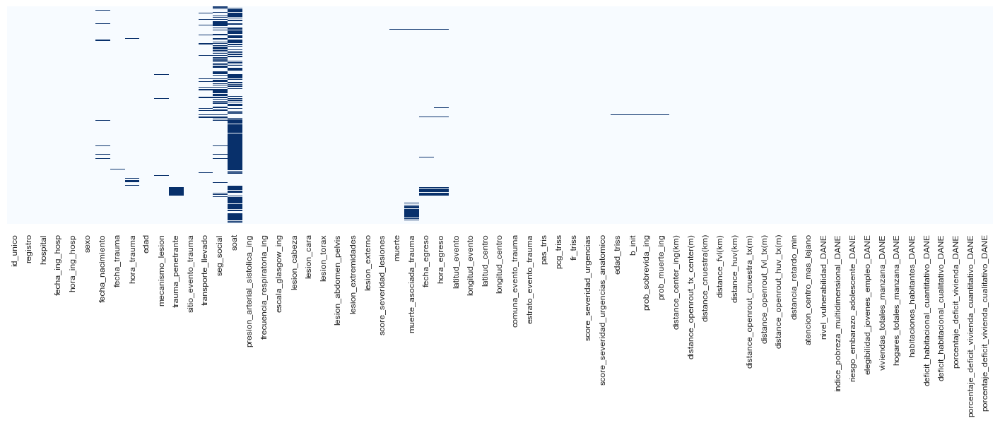

In [208]:
# Grafica que muestra el patron de datos faltantes sobre el dataset
fig, ax = plt.subplots(figsize=(18,4)) 
sns.heatmap(df.isnull(), yticklabels = False, cbar = False, cmap="Blues")
plt.show()

El conjunto de datos muestra un patrón detallado de ausencia de información en varias columnas, destacando tanto la cantidad absoluta de valores faltantes como su proporción relativa respecto al total de registros posibles, que asciende a 553 por columna. Dentro de este conjunto, la columna 'soat' registra la mayor tasa de datos no disponibles, con 330 entradas ausentes, constituyendo el 59.67% de su total. Le sigue la columna 'seg_social', con 159 registros faltantes, que representan el 28.75% de los datos. Notablemente, las variables 'hora_egreso' y 'fecha_egreso', las cuales indican los momentos específicos de salida, exhiben cada una 23 entradas no registradas, lo que corresponde al 4.16% del conjunto total. Variables clínicas y demográficas tales como 'trauma_penetrante', 'fecha_nacimiento', 'hora_trauma', y 'edad_triss' presentan menores índices de datos faltantes, reflejando una mayor completitud en estos aspectos críticos. Además, otras columnas como 'transporte_llevado' y 'muerte_asociada_trauma' muestran ausencias  del 9.22% y 6.87% respectivamente. Por otro lado, un grupo de variables registra únicamente un dato faltante cada una, lo que equivale a un insignificante 0.18%, un porcentaje tan mínimo que es poco probable que afecte de manera significativa la mayoría de los análisis futuros. Este patrón de ausencia de datos requiere una evaluación cuidadosa de las metodologías adecuadas para el tratamiento de los mismos, con el fin de preservar la integridad y la fiabilidad del análisis derivado de dicho conjunto de datos.

Ahora veremos los valores únicos por característica:

In [209]:
cols_name = list(df.columns)

for name in cols_name:
    print(f'{name}:{df[name].nunique()} | dtype:{df[name].dtype} | values:{df[name].unique()}|\n')

id_unico:553 | dtype:int64 | values:[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198
 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216
 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234
 235 236 237 23

En general, los valores únicos en el conjunto de datos no muestran inconsistencias tipográficas. Sin embargo, existen algunas anomalías en casos específicos; por ejemplo, en la variable de edad se han observado valores negativos o cero, y también se han reportado algunas fechas o horas que corresponden a periodos o años (horas) incorrectos. Además, para la variable 'soat' se ha identificado un valor que no es plausible. Estos errores necesitan ser corregidos para garantizar la precisión y la fiabilidad del análisis de datos.

Examinaremos los casos en los que la variable 'Edad' presenta valores menores e iguales a cero:

In [210]:
df[df['edad']<=0]

,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE
127,128,57,1,2012-06-05 00:00:00,16:30:00,0,2014-06-22 00:00:00,NaN,15:20:00,0.00,3.00,0.00,calle 15 carrera 12,3.00,NaN,1.00,120,18,15.00,4,0,3,0,0,0,25,0.00,0.00,2012-06-11 00:00:00,09:54:00,3.45,-76.50,3.43,-76.53,Comuna 8,3,4,4.00,4,12.00,7.84,0.00,4.32,0.99,0.01,4.25,6195,4.25,8.77,5.11,6195,13687,6848,0,0,Vulnerabilidad media,6.30,Vulnerabilidad baja,elegibilidad media-baja,45,146,146,31,115,100.00,21.23,78.77
247,248,127,1,2012-06-25 00:00:00,18:09:00,0,1929-12-31 00:00:00,2012-06-25 00:00:00,18:00:00,-15.00,3.00,0.00,calle 10 calle 44,2.00,2.00,1.00,114,20,15.00,2,0,3,0,0,0,13,0.00,0.00,2012-06-30 00:00:00,10:03:00,3.45,-76.53,3.43,-76.53,Comuna 3,3,4,4.00,4,12.00,7.84,NaN,NaN,NaN,NaN,2.43,3625,2.43,8.23,2.35,3625,11118,2593,1032,1,Vulnerabilidad media-baja,3.30,Vulnerabilidad baja,elegibilidad media-baja,103,141,141,6,135,100.00,4.26,95.74
258,259,133,1,2012-06-29 00:00:00,09:14:00,0,2028-07-07 00:00:00,2012-06-29 00:00:00,08:15:00,-13.00,3.00,0.00,calle 7 carrera 24,2.00,NaN,1.00,114,20,15.00,1,0,1,0,3,0,11,0.00,0.00,2012-07-14 00:00:00,03:57:00,3.44,-76.50,3.43,-76.53,Comuna 8,3,4,4.00,4,12.00,7.84,NaN,NaN,NaN,NaN,4.36,5711,4.36,8.17,5.46,5711,9691,6364,0,0,Vulnerabilidad baja,6.90,Vulnerabilidad baja,elegibilidad media,4,33,33,2,31,100.00,6.06,93.94
275,276,142,1,2012-07-26 00:00:00,08:11:00,0,2025-10-26 00:00:00,2012-07-26 00:00:00,07:15:00,-10.00,3.00,0.00,calle 18b carrera 25,NaN,NaN,1.00,120,24,13.00,3,3,4,0,0,0,34,1.00,1.00,2012-07-26 00:00:00,10:20:00,3.43,-76.52,3.43,-76.53,Comuna 10,3,4,4.00,4,12.00,7.84,NaN,NaN,NaN,NaN,1.32,1918,1.32,6.54,2.42,1918,7431,3343,0,0,Vulnerabilidad media-alta,13.40,Vulnerabilidad baja,elegibilidad media,103,141,141,6,135,100.00,4.26,95.74


Se propone eliminar las edades reportadas como negativas o cero, y posteriormente recuperar estos valores en la sección dedicada a la creación de nuevas variables. Esto se realizará más adelante utilizando las fecha de nacimiento y la fecha del evento de trauma para calcular la edad de manera precisa.

In [211]:
# Se eliminan las edades menores o iguales a cero asignando None
df.loc[df['edad'] <= 0, 'edad'] = np.nan
df[df['edad']<=0]

,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE


También es necesario examinar los casos de pacientes menores de 18 años, ya que esto contradice los criterios de inclusión del estudio y podría indicar un registro anómalo.

In [212]:
df[df['edad']<18]

,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE
508,509,N059,3,2012-07-29 00:00:00,03:38:00,0,1994-06-23 00:00:00,2012-07-29 00:00:00,01:00:00,16.00,0.00,1.00,puerto tejada,2.00,1.00,NaN,97,24,15.00,4,1,0,0,0,0,17,0.00,NaN,2012-08-07 00:00:00,11:18:00,3.32,-76.50,3.37,-76.53,Fuera de Cali,2,4,4.00,4,12.00,7.84,0.00,5.78,1.00,0.00,3.99,7589,12.42,6.83,13.44,14814,7592,16399,0,0,Vulnerabilidad baja,0.00,Vulnerabilidad baja,elegibilidad media-alta,19,18,18,5,13,100.00,27.78,72.22


Se propone eliminar las edades <18, y posteriormente recuperar estos valores en la sección dedicada a la creación de nuevas variables. Esto se realizará utilizando las fechas de nacimiento y los eventos de trauma para calcular las edades de manera precisa.

In [213]:
df.loc[df['edad'] < 18, 'edad'] = np.nan

Sobre el valor de la variable soat se verifica:

In [214]:
df.loc[df['soat'] ==3.0]

,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE
489,490,N014,3,2020-06-22 00:00:00,21:07:00,0,1955-01-03 00:00:00,2012-06-11 00:00:00,18:37:00,57.00,3.00,0.00,santander,3.00,NaN,3.00,110,22,3.00,0,0,4,0,3,0,25,0.00,0.00,2012-07-05 00:00:00,08:36:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,0.00,4,8.00,4.09,1.00,-1.17,0.24,0.18,38.24,44630,46.73,40.91,47.46,51855,44633,53440,0,0,Vulnerabilidad baja,0.00,Vulnerabilidad baja,elegibilidad media,18,53,16,6,10,30.19,11.32,18.87


Se decide anular el valor anterior y pasarlo a NA:

In [215]:
df.loc[df['soat'] ==3.0, 'soat'] = np.nan

Se han detectado inconsistencias en los registros de las fechas y horas de trauma, tales como reportes de horas en campos destinados a fechas, años incorrectos y formatos inapropiados. Para preservar la integridad del análisis, se ha decidido asignar el valor 'NA' a estos datos.

In [216]:
df.loc[df['hora_trauma'] == '1955-07-01 00:00:00', 'hora_trauma'] = np.nan
df.loc[df['fecha_trauma'] == '15/12712', 'fecha_trauma'] = np.nan
df.loc[df['fecha_trauma'] == '01:03:13', 'fecha_trauma'] = np.nan
df.loc[df['fecha_trauma'] == '01:01:13', 'fecha_trauma'] = np.nan
df.loc[df['fecha_trauma'] == '2011-05-23 00:00:00', 'fecha_trauma'] = np.nan
df.loc[df['fecha_trauma'] == '2016-02-16 00:00:00', 'fecha_trauma'] = np.nan
date_to_check = pd.to_datetime('2011-05-23 00:00:00')
df.loc[df['fecha_trauma'] == date_to_check, 'fecha_trauma'] = np.nan
date_to_check = pd.to_datetime('2016-02-16 00:00:00')
df.loc[df['fecha_trauma'] == date_to_check, 'fecha_trauma'] = np.nan

Otra posible inconsistencia en las fechas registradas es que algunas no deberían ser anteriores a la fecha de nacimiento. Además, se debe verificar que las fechas no excedan el período del estudio, que abarca los años 2012 a 2013.

Primero, se procederá a verificar las fechas de trauma y nacimiento:

In [217]:
df['fecha_trauma'] = pd.to_datetime(df['fecha_trauma'])
df['fecha_nacimiento'] = pd.to_datetime(df['fecha_nacimiento'])

# Calcula cuántos casos tienen una fecha de trauma anterior a la fecha de nacimiento
num_incorrect_cases = (df['fecha_trauma'] < df['fecha_nacimiento']).sum()
print(f"Número de casos donde la fecha de trauma es anterior a la fecha de nacimiento: {num_incorrect_cases}")

# Mostrar los registros donde la fecha de trauma es anterior a la fecha de nacimiento
incorrect_cases = df[df['fecha_trauma'] < df['fecha_nacimiento']]
print("Casos incorrectos:")
display(incorrect_cases)

Número de casos donde la fecha de trauma es anterior a la fecha de nacimiento: 8
Casos incorrectos:


,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE
12,13,7,3,2012-04-05 00:00:00,20:40:00,0,2025-12-31,2012-04-05,19:00:00,86.00,3.00,0.00,santander de q,3.00,4.00,1.00,119,14,8.00,3,2,0,0,0,0,13,0.00,1.00,2012-05-02 00:00:00,12:00:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10.00,5.97,1.00,1.54,0.82,0.14,38.24,44630,46.73,40.91,47.46,51855,44633,53440,0,0,Vulnerabilidad baja,0.00,Vulnerabilidad baja,elegibilidad media,18,53,16,6,10,30.19,11.32,18.87
95,96,41,3,2012-03-26 00:00:00,02:06:00,1,2028-01-02,2012-03-26,00:01:00,84.00,4.00,0.00,chorro de plata,NaN,1.00,NaN,179,20,15.00,0,0,0,0,3,0,9,0.00,1.00,2012-03-29 00:00:00,12:00:00,3.34,-76.61,3.37,-76.53,Área Rural de Cali,1,4,4.00,4,12.00,7.84,1.00,3.64,0.97,0.02,10.07,13400,12.15,9.39,11.78,18000,13400,24200,0,0,Vulnerabilidad media,0.00,Vulnerabilidad baja,elegibilidad media-baja,7,5,5,2,3,100.00,40.00,60.00
258,259,133,1,2012-06-29 00:00:00,09:14:00,0,2028-07-07,2012-06-29,08:15:00,NaN,3.00,0.00,calle 7 carrera 24,2.00,NaN,1.00,114,20,15.00,1,0,1,0,3,0,11,0.00,0.00,2012-07-14 00:00:00,03:57:00,3.44,-76.50,3.43,-76.53,Comuna 8,3,4,4.00,4,12.00,7.84,NaN,NaN,NaN,NaN,4.36,5711,4.36,8.17,5.46,5711,9691,6364,0,0,Vulnerabilidad baja,6.90,Vulnerabilidad baja,elegibilidad media,4,33,33,2,31,100.00,6.06,93.94
275,276,142,1,2012-07-26 00:00:00,08:11:00,0,2025-10-26,2012-07-26,07:15:00,NaN,3.00,0.00,calle 18b carrera 25,NaN,NaN,1.00,120,24,13.00,3,3,4,0,0,0,34,1.00,1.00,2012-07-26 00:00:00,10:20:00,3.43,-76.52,3.43,-76.53,Comuna 10,3,4,4.00,4,12.00,7.84,NaN,NaN,NaN,NaN,1.32,1918,1.32,6.54,2.42,1918,7431,3343,0,0,Vulnerabilidad media-alta,13.40,Vulnerabilidad baja,elegibilidad media,103,141,141,6,135,100.00,4.26,95.74
412,413,287,2,2013-03-16 00:00:00,20:30:00,0,2013-12-13,2013-03-16,17:30:00,39.00,5.00,0.00,florida,2.00,1.00,NaN,110,18,15.00,3,0,0,0,0,0,9,0.00,1.00,2013-03-20 00:00:00,12:00:00,3.33,-76.24,3.43,-76.55,Fuera de Cali,2,4,4.00,4,12.00,7.84,0.00,5.55,1.00,0.00,36.16,43404,34.72,32.58,36.16,42751,53748,43404,653,1,Vulnerabilidad baja,17.07,Vulnerabilidad baja,elegibilidad media-baja,26,27,7,4,3,25.93,14.81,11.11
422,423,299,3,2012-04-14 00:00:00,22:38:00,0,2070-12-19,2012-04-14,22:00:00,41.00,3.00,0.00,colegio lorencita villegas,NaN,2.00,NaN,154,30,10.00,0,0,3,4,0,0,25,0.00,1.00,2012-04-18 00:00:00,11:20:00,3.39,-76.55,3.37,-76.53,Comuna 18,1,4,3.00,3,10.00,6.17,0.00,2.72,0.94,0.06,6.02,6329,4.78,3.48,4.84,6025,6331,7248,304,1,Vulnerabilidad media,9.00,Vulnerabilidad media-baja,elegibilidad media-baja,750,127,5,0,5,3.94,0.00,3.94
518,519,N085,3,2012-08-23 00:00:00,18:21:00,0,2021-12-31,2012-08-23,15:21:00,91.00,4.00,0.00,calle 58 carrera 2gn,0.00,1.00,NaN,125,19,15.00,0,0,0

Los casos presentados anteriormente muestran que la fecha de trauma es anterior a la fecha de nacimiento. Sin embargo, el verdadero error parece residir en las fechas de nacimiento, ya que estas son posteriores al año 2013, lo cual indica un error en la captura o registro de estos datos. Por tanto, se ha decidido asignar el valor NA a estos registros (fecha de nacimiento).

In [218]:
# Asignar NA a la fecha de nacimiento en los casos incorrectos
df.loc[df['fecha_trauma'] < df['fecha_nacimiento'], 'fecha_nacimiento'] = pd.NA

# Imprimir mensaje confirmando la actualización
print("Las fechas de nacimiento de los casos incorrectos han sido actualizadas a NA.")

Las fechas de nacimiento de los casos incorrectos han sido actualizadas a NA.


En segundo lugar, dado que el estudio se realizó entre los años 2012 y 2013, y se requería que los pacientes tuvieran 18 años o más como criterio de inclusión, las fechas de nacimiento válidas deben ser anteriores al año 1994 para cumplir con este requisito de edad. Se procederá a verificar esto y, en caso de no cumplirse, se asignará el valor NA a las fechas de nacimiento correspondientes:

In [219]:
df['fecha_nacimiento'] = pd.to_datetime(df['fecha_nacimiento'])

# Crea una fecha límite basada en el año mínimo del estudio (2012) y el requisito de edad (18 años)
# Suponiendo que el estudio comienza el 1 de enero de 2012
fecha_limite = pd.Timestamp(year=2012, month=1, day=1) - pd.DateOffset(years=18)
print(f'Fecha aproximada límite {fecha_limite}')

# Identifica las fechas de nacimiento que no cumplen con el requisito y asigna NA
df.loc[df['fecha_nacimiento'] >= fecha_limite, 'fecha_nacimiento'] = pd.NA
print(df[['fecha_nacimiento']])

Fecha aproximada límite 1994-01-01 00:00:00
    fecha_nacimiento
0         1975-08-14
1         1959-07-08
2         1984-11-30
3         1934-09-09
4         1993-01-22
5         1971-11-14
6         1984-09-07
7         1960-02-01
8         1986-08-27
9                NaT
10        1968-12-08
11        1968-07-20
12               NaT
13               NaT
14        1990-12-27
15        1989-07-06
16               NaT
17        1974-04-06
18        1982-03-17
19        1965-11-19
20        1991-09-22
21        1988-12-23
22        1993-10-18
23        1976-12-22
24        1976-05-11
25        1986-07-14
26        1977-02-03
27        1985-09-21
28        1986-02-20
29        1993-02-23
30        1965-01-08
31               NaT
32        1988-05-05
33               NaT
34               NaT
35        1987-02-10
36        1989-10-03
37        1985-11-20
38        1987-10-10
39        1984-10-17
40        1988-12-11
41        1962-05-05
42        1993-01-19
43               NaT
44        1

Inspección de duplicados

Se lleva a cabo una revisión de las filas para detectar registros duplicados, examinando los datos consignados en cada columna o variable:

In [220]:
print('En el dataset hay {} registros duplicados'.format(df.duplicated().sum()))

En el dataset hay 0 registros duplicados


Conversión de tipo de tipo de variables

Se llevará a cabo un proceso de conversión de tipos de datos para ajustar las variables del conjunto de datos a las categorías más apropiadas: nominales, ordinales y numéricas. Este proceso implica identificar la naturaleza de cada variable y aplicar transformaciones adecuadas para optimizar su utilidad en análisis estadísticos y modelado predictivo.

In [221]:
# Diccionario de tipos de datos para cada columna
data_types = {
    'id_unico': 'int',
    'registro': 'object',
    'hospital': 'category',
    'fecha_ing_hosp': 'datetime',
    'hora_ing_hosp': 'object',
    'sexo': 'category',
    'fecha_nacimiento': 'datetime',
    'fecha_trauma': 'object',
    'edad': 'float',
    'mecanismo_lesion': 'category',
    'trauma_penetrante': 'category',
    'sitio_evento_trauma': 'object',
    'hora_trauma': 'object',
    'transporte_llevado': 'category',
    'seg_social': 'category',
    'soat': 'category',
    'presion_arterial_sistolica_ing': 'float',
    'frecuencia_respiratoria_ing': 'float',
    #'escala_glasgow_ing': 'int',
    'lesion_cabeza': 'category',
    'lesion_cara': 'category',
    'lesion_torax': 'category',
    'lesion_abdomen_pelvis': 'category',
    'lesion_extremidades': 'category',
    'lesion_externo': 'category',
    #'score_severidad_lesiones': 'int',
    'muerte': 'category',
    'muerte_asociada_trauma': 'category',
    'fecha_egreso': 'object',
    'hora_egreso': 'object',
    'latitud_evento': 'float',
    'longitud_evento': 'float',
    'latitud_centro': 'float',
    'longitud_centro': 'float',
    'comuna_evento_trauma': 'category',
    'estrato_evento_trauma': 'category',
    'pas_tris': 'ordered_category',
    'pcg_triss': 'ordered_category',
    'fr_triss': 'ordered_category',
    #'score_severidad_urgencias': 'int',
    'score_severidad_urgencias_anatomico': 'float',
    'edad_triss': 'ordered_category',
    'b_init': 'float',
    'prob_sobrevida_ing': 'float',
    'prob_muerte_ing': 'float',
    'distance_center_ing(km)': 'float',
    'distance_openrout_tx_center(m)': 'float',
    'distance_cnuestra(km)': 'float',
    'distance_fvl(km)': 'float',
    'distance_huv(km)': 'float',
    'distance_openrout_cnuestra_tx(m)': 'float',
    'distance_openrout_fvl_tx(m)': 'float',
    'distance_openrout_huv_tx(m)': 'float',
    'distancia_retardo_min': 'float',
    'atencion_centro_mas_lejano': 'category',
    'nivel_vulnerabilidad_DANE': 'category',
    'indice_pobreza_multidimensional_DANE': 'float',
    'riesgo_embarazo_adolescente_DANE': 'category',
    'elegibilidad_jovenes_empleo_DANE': 'category',
    'viviendas_totales_manzana_DANE': 'int',
    'hogares_totales_manzana_DANE': 'int',
    'habitaciones_habitantes_DANE': 'int',
    'deficit_habitacional_cuantitativo_DANE': 'int',
    'deficit_habitacional_cualitativo_DANE': 'int',
    'porcentaje_deficit_vivienda_DANE': 'float',
    'porcentaje_deficit_vivienda_cuantitativo_DANE': 'float',
    'porcentaje_deficit_vivienda_cualitativo_DANE': 'float'
}

# Procesamiento de las conversiones de tipo
for column, dtype in data_types.items():
    if dtype == 'datetime':
        df[column] = pd.to_datetime(df[column])
    elif dtype == 'ordered_category':
        df[column] = pd.Categorical(df[column], ordered=True)
    else:
        df[column] = df[column].astype(dtype)   

# Otras cambios de formatos
df['score_severidad_lesiones'] = df['score_severidad_lesiones'].astype('object') 
df['score_severidad_lesiones'] = df['score_severidad_lesiones'].astype('Int64') 
df['score_severidad_urgencias'] = df['score_severidad_urgencias'].astype('object') 
df['score_severidad_urgencias'] = df['score_severidad_urgencias'].astype('Int64')   
df['escala_glasgow_ing'] = df['escala_glasgow_ing'].astype('object') 
df['escala_glasgow_ing'] = df['escala_glasgow_ing'].astype('Int64') 

print("Tipos de datos actualizados correctamente.")

Tipos de datos actualizados correctamente.


Se realiza una nueva verificación de los tipos de variables resultantes:

In [222]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 553 entries, 0 to 552
Data columns (total 67 columns):
 #   Column                                         Non-Null Count  Dtype         
---  ------                                         --------------  -----         
 0   id_unico                                       553 non-null    int64         
 1   registro                                       553 non-null    object        
 2   hospital                                       553 non-null    category      
 3   fecha_ing_hosp                                 553 non-null    datetime64[ns]
 4   hora_ing_hosp                                  553 non-null    object        
 5   sexo                                           553 non-null    category      
 6   fecha_nacimiento                               494 non-null    datetime64[ns]
 7   fecha_trauma                                   546 non-null    object        
 8   hora_trauma                                    545 non-null 

De acuerdo con el diccionario de datos facilitado, se procede a la creación de etiquetas específicas que corresponden a cada variable incluida en el registro. Este proceso implica asignar descripciones claras y concisas a cada código numérico, facilitando así su interpretación y análisis posterior en el estudio.

In [223]:
# Diccionarios de codificación

hospital = {
    1: 'Clínica Nuestra',
    2: 'Universitario del Valle',
    3: 'Fundación Valle del Lili',
}
sexo = {
    0: 'Masculino',
    1: 'Femenino'
}
mecanismo_lesion = {
    0: 'Arma de fuego',
    1: 'Arma cortopunzante',
    2: 'Trauma contundente',
    3: 'Lesiones de tránsito',
    4: 'Caídas',
    5: 'Golpes'
}
trauma_penetrante = {
    0: 'No',
    1: 'Si'
}
transporte_llevado = {
    0: 'Vehículo particular',
    1: 'Fuerza pública',
    2: 'Ambulancia básica',
    3: 'Ambulancia medicalizada',
    4: 'Otro'
}
seg_social = {
    0: 'Sin aseguramiento',
    1: 'Contributivo',
    2: 'Subsidiado',
    3: 'Especial',
    4: 'Otro'
}
soat = {
    0: 'No',
    1: 'Si'
}
muerte = {
    0: 'No',
    1: 'Si'
}
muerte_asociada_trauma = {
    0: 'No',
    1: 'Si'
}
atencion_centro_mas_lejano = {
    0: 'No',
    1: 'Si'
}
nivel_vulnerabilidad_DANE = {
    "Vulnerabilidad baja": 'Baja',
    "Vulnerabilidad media-baja": 'Media-Baja',
    "Vulnerabilidad media": 'Media',
    "Vulnerabilidad media-alta": 'Media-Alta',
    "Vulnerabilidad alta": 'Alta'
}
riesgo_embarazo_adolescente_DANE = {
    "Vulnerabilidad baja": 'Baja',
    "Vulnerabilidad media-baja": 'Media-Baja',
    "Vulnerabilidad media": 'Media',
    "Vulnerabilidad media-alta": 'Media-Alta',
    "Vulnerabilidad alta": 'Alta'
}
elegibilidad_jovenes_empleo_DANE = {
    "elegibilidad baja": 'Baja',
    "elegibilidad media-baja": 'Media-Baja',
    "elegibilidad media": 'Media',
    "elegibilidad media-alta": 'Media-Alta',
    "elegibilidad alta": 'Alta'
}

# Reemplazo de las etiquetas anteriores
df['hospital'] = df['hospital'].replace(hospital)
df['sexo'] = df['sexo'].replace(sexo)
df['mecanismo_lesion'] = df['mecanismo_lesion'].replace(mecanismo_lesion)
df['trauma_penetrante'] = df['trauma_penetrante'].replace(trauma_penetrante)
df['transporte_llevado'] = df['transporte_llevado'].replace(transporte_llevado)
df['seg_social'] = df['seg_social'].replace(seg_social)
df['soat'] = df['soat'].replace(soat)
df['muerte'] = df['muerte'].replace(muerte)
df['muerte_asociada_trauma'] = df['muerte_asociada_trauma'].replace(muerte_asociada_trauma)
df['atencion_centro_mas_lejano'] = df['atencion_centro_mas_lejano'].replace(atencion_centro_mas_lejano)
df['nivel_vulnerabilidad_DANE'] = df['nivel_vulnerabilidad_DANE'].replace(nivel_vulnerabilidad_DANE)
df['riesgo_embarazo_adolescente_DANE'] = df['riesgo_embarazo_adolescente_DANE'].replace(riesgo_embarazo_adolescente_DANE)
df['elegibilidad_jovenes_empleo_DANE'] = df['elegibilidad_jovenes_empleo_DANE'].replace(elegibilidad_jovenes_empleo_DANE)

Analizaremos la prevalencia de la mortalidad del paciente, explorando cómo se distribuye esta variable objetivo en el conjunto de datos:

In [224]:
df.stb.freq(['muerte'])

,muerte,count,percent,cumulative_count,cumulative_percent
0,No,433,78.44,433,78.44
1,Si,119,21.56,552,100.00


La distribución de la variable objetivo muestra que el 78.4% de los pacientes están vivos, mientras que el 21.6% fallecieron, reflejando así la proporción de los resultados en nuestra muestra.

Para facilitar la comprensión, visualizaremos gráficamente la distribución de la variable objetivo:

In [225]:
plot_data = df.groupby('muerte')['muerte'].agg(['count']).reset_index()
fig = px.pie(plot_data, values = plot_data['count'], names = plot_data['muerte'])
fig.update_traces(textposition = 'inside', textinfo = 'percent + label', hole = 0.5, marker = dict(colors = ['#2A3132','#336B87'], line = dict(color = 'white', width = 3)))
fig.update_layout(title_text = 'Patient<br>segmentation', title_x = 0.5, title_y = 0.55, title_font_size = 22, title_font_family = 'Calibri', title_font_color = 'black', showlegend = False)              
fig.show()

El conjunto de datos muestra un claro desbalance, donde la clase minoritaria corresponde al 21.6% de los casos, representando a los pacientes que fallecieron debido al trauma presentado. Este desequilibrio entre las clases podría tener implicaciones  en el entrenamiento y evaluación de modelos de aprendizaje automático, así como en la interpretación de los resultados del análisis, y puede requerir técnicas específicas para abordar este desbalance y garantizar la robustez y la precisión del modelo predictivo. La decisión sobre cómo proceder se determinará en una etapa posterior.

### Análisis de variables tipo categóricas

En una primera fase, se revisan los tipos de variables disponibles. Posteriormente, se identifican las variables categóricas para llevar a cabo el análisis descriptivo correspondiente.

In [226]:
# Se identifican las variables tipo categórico
var_cat = df.select_dtypes(['category']).columns
var_cat

Index(['hospital', 'sexo', 'mecanismo_lesion', 'trauma_penetrante',
       'transporte_llevado', 'seg_social', 'soat', 'lesion_cabeza',
       'lesion_cara', 'lesion_torax', 'lesion_abdomen_pelvis',
       'lesion_extremidades', 'lesion_externo', 'muerte',
       'muerte_asociada_trauma', 'comuna_evento_trauma',
       'estrato_evento_trauma', 'pas_tris', 'pcg_triss', 'fr_triss',
       'edad_triss', 'atencion_centro_mas_lejano', 'nivel_vulnerabilidad_DANE',
       'riesgo_embarazo_adolescente_DANE', 'elegibilidad_jovenes_empleo_DANE'],
      dtype='object')

Ahora que hemos identificado estas variables como categóricas, vamos a examinar su distribución:

In [227]:
lista_var_cat = list(var_cat)

for column in var_cat:
    freq_table = df[column].value_counts()
    total_count = len(df[column])
    percentage_table = (freq_table / total_count) * 100
    combined_table = pd.concat([freq_table, percentage_table], axis=1)
    combined_table.columns = ['Frecuencia Absoluta', 'Porcentaje']
    print(f"Tabla de frecuencia para la variable '{column}':\n{combined_table}\n")

Tabla de frecuencia para la variable 'hospital':
                          Frecuencia Absoluta  Porcentaje
Universitario del Valle                   255       46.11
Clínica Nuestra                           152       27.49
Fundación Valle del Lili                  146       26.40

Tabla de frecuencia para la variable 'sexo':
           Frecuencia Absoluta  Porcentaje
Masculino                  475       85.90
Femenino                    78       14.10

Tabla de frecuencia para la variable 'mecanismo_lesion':
                      Frecuencia Absoluta  Porcentaje
Arma de fuego                         248       44.85
Lesiones de tránsito                  204       36.89
Arma cortopunzante                     45        8.14
Caídas                                 36        6.51
Trauma contundente                      9        1.63
Golpes                                  5        0.90

Tabla de frecuencia para la variable 'trauma_penetrante':
    Frecuencia Absoluta  Porcentaje
Si           

Las tablas proporcionadas resumen las frecuencias y características de las variables categóricas de los pacientes. De un total de 553 registros, la mayoría fueron atendidos en el hospital 'Universitario del Valle' (255 casos), representando el 46.11% de los casos. El 'sexo' predominante fue 'Masculino' (475 casos, 85.90%) entre todos los traumas. La 'Arma de fuego' se identifica como el 'mecanismo de lesión' más frecuente (248 casos, 44.85%), seguido por las 'Lesiones de tránsito' (204 casos, 36.89%). La presencia de 'trauma penetrante' fue reportada en 288 casos (52.08%). En cuanto al 'transporte llevado', la 'Ambulancia básica' fue el medio más utilizado (362 casos, 65.46%). A nivel de seguridad social, el 'Subsidiado' aparece como el más común entre los pacientes (157 casos, 28.39%). Se observa que 186 pacientes contaban con 'soat' al momento del trauma.

Los datos muestran que el mecanismo más común de lesión es el uso de arma de fuego, que representa el 44.85% de los casos, seguido por lesiones de tránsito, que abarcan el 36.89%. Estos dos mecanismos juntos constituyen una mayoría significativa de los eventos de trauma, subrayando su prevalencia en el conjunto de datos analizado.

En términos de lesiones específicas, los grados de lesión más frecuentes fueron: para la cabeza, el grado 4 (14.10% de los casos) y el grado 5 (13.38%); para la cara, el grado 2 (8.50%) y el grado 3 (4.70%); para el tórax, el grado 3 (20.25%) y el grado 4 (14.65%); para el abdomen y pelvis, los grados 4 y 5 (ambos con 9.04%); y para las extremidades, el grado 3 (18.08%). Las lesiones externas mostraron un predominio del grado 1 (15.91%). 

Además, la distribución geográfica de los eventos de trauma se extiende por diversas comunas de la ciudad, con la Comuna 8 (43 casos, 7.78%), Comuna 11 (38 casos, 6.87%) y Comuna 13 (33 casos, 5.97%) destacándose por tener una mayor incidencia de casos reportados. Fuera de Cali también se registraron eventos significativos (115 casos, 20.80%). La distribución de los eventos de trauma por estratos socioeconómicos muestra una mayor frecuencia en los estratos bajos y medios (estratos 1, 2 y 3), con una disminución progresiva en los estratos más altos. Este patrón puede reflejar diferencias en el acceso a recursos, la densidad poblacional y la exposición a riesgos en diversas zonas de la ciudad.

En el 56.96% de los casos, la muerte estuvo asociada con trauma. La mayoría de los pacientes no fueron atendidos en el centro más lejano (52.26%). En cuanto a vulnerabilidad según el DANE, la categoría 'baja' fue la más reportada (257 casos, 46.47%), similar a la situación con el riesgo de embarazo en adolescentes (345 casos, 62.39%) y la elegibilidad para empleo en jóvenes (262 casos, 47.38% con elegibilidad media-baja)

### Análisis de variables númericas discretas

In [228]:
# Se identifican las variables tipo categórico
var_disc = df.select_dtypes(['int']).columns
var_disc

Index(['id_unico', 'escala_glasgow_ing', 'score_severidad_lesiones',
       'score_severidad_urgencias', 'viviendas_totales_manzana_DANE',
       'hogares_totales_manzana_DANE', 'habitaciones_habitantes_DANE',
       'deficit_habitacional_cuantitativo_DANE',
       'deficit_habitacional_cualitativo_DANE'],
      dtype='object')

Además de las variables categóricas, el conjunto de datos también incluye variables numéricas discretas, tipificadas como enteros positivos. Estas variables corresponden a diversas categorías relacionadas con eventos y condiciones socioeconómicas, el total de viviendas por manzana, el total de hogares por manzana, la relación entre habitaciones y habitantes, y tanto el déficit habitacional cuantitativo como cualitativo según el DANE. Procederemos a examinar sus valores detalladamente.

In [229]:
var_disc = ['escala_glasgow_ing','score_severidad_lesiones', 'score_severidad_urgencias',
            'viviendas_totales_manzana_DANE','hogares_totales_manzana_DANE', 
            'habitaciones_habitantes_DANE','deficit_habitacional_cuantitativo_DANE','deficit_habitacional_cualitativo_DANE']
df[var_disc].describe().T.style.format("{:.0f}")

,count,mean,std,min,25%,50%,75%,max
escala_glasgow_ing,552,12,4,3,10,15,15,15
score_severidad_lesiones,553,21,12,9,10,17,26,75
score_severidad_urgencias,552,11,2,2,10,12,12,12
viviendas_totales_manzana_DANE,553,87,212,0,4,12,19,750
hogares_totales_manzana_DANE,553,47,70,1,2,33,53,434
habitaciones_habitantes_DANE,553,26,37,0,1,16,33,146
deficit_habitacional_cuantitativo_DANE,553,2,3,0,0,0,2,31
deficit_habitacional_cualitativo_DANE,553,24,35,0,1,10,31,135


La tabla anterior proporciona estadísticas descriptivas de diversas variables asociadas a 553 eventos de trauma, revelando una considerable variabilidad en la severidad de las lesiones y en las condiciones habitacionales de las manzanas donde estos eventos ocurrieron. El score de severidad de lesiones varía ampliamente (9-75) con una media de 21, mientras que el score de severidad en urgencias muestra una concentración de valores entre 10 y 12, reflejando una moderada a alta gravedad en urgencias. Respecto a las viviendas y hogares por manzana, existe una notable disparidad (0-750 viviendas y 1-434 hogares), indicando desde manzanas densamente pobladas hasta otras con pocos hogares. La proporción de habitaciones por habitante también varía significativamente (0-146), sugiriendo diferencias en la densidad habitacional. La Escala de Glasgow, utilizada para evaluar el estado de conciencia y gravedad de lesiones cerebrales, muestra valores entre 3 y 15, con una media de 12, indicando que muchos pacientes se encontraban en una condición de moderada a severa alteración de la conciencia. Finalmente, los déficits habitacionales cuantitativo (0-31) y cualitativo (0-135) muestran que, aunque no generalizados, algunos sectores enfrentan serias deficiencias en la cantidad y calidad de la vivienda. Estos datos subrayan las desigualdades en las condiciones de vida y la severidad de las lesiones en distintas áreas.


Por otro lado, se examina la distribución de los valores cero en cada variable:

In [230]:
(df[var_disc]==0).sum(axis=0)

escala_glasgow_ing                          0
score_severidad_lesiones                    0
score_severidad_urgencias                   0
viviendas_totales_manzana_DANE             66
hogares_totales_manzana_DANE                0
habitaciones_habitantes_DANE               62
deficit_habitacional_cuantitativo_DANE    288
deficit_habitacional_cualitativo_DANE      63
dtype: int64

Con respecto a las variables  tabuladas arriba, el valor de cero es válido y tiene sentido. Podemos continuar con el análisis.

En este informe, presentamos una serie de gráficos que ilustran la distribución de las variables discretas anteriores. Para cada variable, ofrecemos dos perspectivas: un boxplot que proporciona una vista de la distribución, resaltando aspectos como la mediana, los cuartiles y los valores atípicos; y una representación gráfica de la frecuencia de los valores. Para variables con un número limitado de valores únicos (diez o menos), utilizamos diagramas de barras que muestran la frecuencia exacta de cada valor. En casos donde la variable asume más de diez valores únicos, optamos por histogramas, que agrupan los valores en intervalos, facilitando así la comprensión de la distribución general.

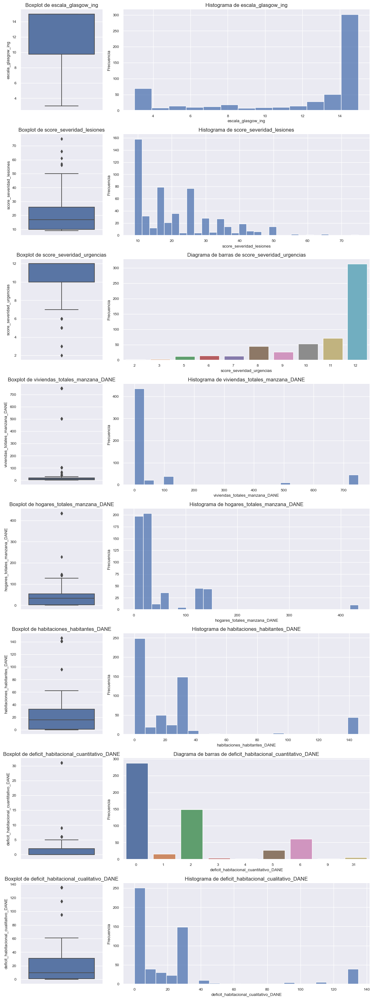

In [231]:
columnas = df[var_disc].columns.tolist()
num_cols = len(columnas)

fig, axes = plt.subplots(num_cols, 2, figsize=(12, 4 * num_cols), gridspec_kw={'width_ratios': [1, 3]})

for idx, col in enumerate(columnas):
    # Elimina o maneja los valores NA antes de graficar
    data_col = df[col].dropna()

    # Creación del boxplot
    sns.boxplot(y=data_col, ax=axes[idx, 0])
    axes[idx, 0].set_title(f'Boxplot de {col}', fontsize=12)

    # Determinación de si usar un diagrama de barras o un histograma
    value_counts = data_col.value_counts().sort_index()
    if len(value_counts) <= 10:
        barplot = sns.barplot(x=value_counts.index, y=value_counts.values, ax=axes[idx, 1])
        axes[idx, 1].set_title(f'Diagrama de barras de {col}', fontsize=12)
        axes[idx, 1].set_xlabel(col)
        axes[idx, 1].set_ylabel('Frecuencia')
        barplot.set_xticklabels(barplot.get_xticklabels(), horizontalalignment='right')
    else:
        sns.histplot(data_col, kde=False, ax=axes[idx, 1], bins=min(30, len(value_counts)))
        axes[idx, 1].set_title(f'Histograma de {col}', fontsize=12)
        axes[idx, 1].set_xlabel(col)
        axes[idx, 1].set_ylabel('Frecuencia')

plt.tight_layout()
sns.despine()
plt.show()


Las visualizaciones proporcionadas ofrecen un análisis  de varias variables, destacando la distribución y tendencias en un conjunto de datos de eventos de trauma y características residenciales. Para el "score de severidad de lesiones", observamos una amplia distribución con valores que van desde 9 hasta 75, indicando una variedad significativa en la gravedad de las lesiones. En contraste, el "score de severidad en urgencias" está muy concentrado alrededor de valores altos (10-12), sugiriendo una severidad generalmente alta en los casos de urgencia. Las "viviendas totales por manzana" y "hogares totales por manzana" muestran una concentración en valores bajos pero con algunos extremos que alcanzan hasta 750 y 434 respectivamente, reflejando una alta variabilidad en la densidad residencial. Las "habitaciones por habitantes" también presentan una amplia gama, desde 0 hasta 146, con una concentración notable de valores bajos. Los "déficits habitacionales cuantitativo y cualitativo" exhiben una distribución más sesgada hacia valores bajos, aunque algunos valores extremos sugieren casos puntuales de insuficiencias significativas. En conjunto, estos gráficos demuestran la diversidad y complejidad de las condiciones asociadas con los eventos de trauma y características residenciales en las manzanas estudiadas.

### Análisis de variables continuas

In [232]:
# Se identifican las variables tipo categórico
var_num = df.select_dtypes(['float']).columns
var_num

Index(['edad', 'presion_arterial_sistolica_ing', 'frecuencia_respiratoria_ing',
       'latitud_evento', 'longitud_evento', 'latitud_centro',
       'longitud_centro', 'score_severidad_urgencias_anatomico', 'b_init',
       'prob_sobrevida_ing', 'prob_muerte_ing', 'distance_center_ing(km)',
       'distance_openrout_tx_center(m)', 'distance_cnuestra(km)',
       'distance_fvl(km)', 'distance_huv(km)',
       'distance_openrout_cnuestra_tx(m)', 'distance_openrout_fvl_tx(m)',
       'distance_openrout_huv_tx(m)', 'distancia_retardo_min',
       'indice_pobreza_multidimensional_DANE',
       'porcentaje_deficit_vivienda_DANE',
       'porcentaje_deficit_vivienda_cuantitativo_DANE',
       'porcentaje_deficit_vivienda_cualitativo_DANE'],
      dtype='object')

A continuación, se presentan las variables numéricas continuas incluidas en el dataset: 'edad', 'presión arterial sistólica al ingreso', 'frecuencia respiratoria al ingreso', 'escala de Glasgow al ingreso', y 'score de severidad de las lesiones'. Además, se consideran datos geográficos como 'latitud del evento', 'longitud del evento', 'latitud del centro de atención', y 'longitud del centro de atención'. Otros indicadores relevantes incluyen 'score_severidad_urgencias_anatomico'; así como variables relacionadas con la probabilidad de sobrevida y muerte al ingreso. También se evalúan distancias específicas entre el lugar del evento y diversos centros de atención, y distancias calculadas mediante rutas abiertas. Finalmente, se incluyen índices de condiciones socioeconómicas como el 'índice de pobreza multidimensional del DANE' y varios porcentajes que describen el déficit de vivienda, tanto en términos cuantitativos como cualitativos. Estas variables son fundamentales para evaluar la severidad de las lesiones y la eficacia de la respuesta de los servicios de emergencia, además de proporcionar una comprensión más profunda del contexto socioeconómico de los pacientes.

In [233]:
df[var_num].describe().T.style.format("{:.1f}")

,count,mean,std,min,25%,50%,75%,max
edad,548.0,34.2,15.4,18.0,23.0,29.0,41.0,91.0
presion_arterial_sistolica_ing,553.0,111.0,31.3,0.0,99.0,118.0,126.0,233.0
frecuencia_respiratoria_ing,553.0,21.2,6.9,0.0,18.0,20.0,24.0,50.0
latitud_evento,553.0,3.4,0.1,2.5,3.4,3.4,3.4,3.6
longitud_evento,553.0,-76.5,0.0,-76.8,-76.5,-76.5,-76.5,-76.2
latitud_centro,553.0,3.4,0.0,3.4,3.4,3.4,3.4,3.4
longitud_centro,553.0,-76.5,0.0,-76.5,-76.5,-76.5,-76.5,-76.5
score_severidad_urgencias_anatomico,552.0,6.9,1.5,1.0,6.2,7.8,7.8,7.8
b_init,549.0,3.5,2.7,-7.8,2.3,4.4,5.5,7.0
prob_sobrevida_ing,549.0,0.9,0.3,0.0,0.9,1.0,1.0,1.0


La tabla resume las estadísticas descriptivas de diversas variables numéricas continuas de una muestra de 553 sujetos, detallando aspectos médicos y geográficos relevantes. Los datos incluyen variables como la edad, con un rango reportado desde 18 hasta 91 años. Además, el 50% o menos de los pacientes tienen una edad aproximada de 29 años. La presión arterial sistólica muestra valores que van de 0 a 233 mmHg, con el mínimo apuntando a posibles errores de registro o casos de datos faltantes mal gestionados. Las coordenadas de latitud y longitud para eventos y centros médicos son coherentes, lo que sugiere una localización geográfica específica y consistente para todos los registros. Las variables de distancia, como la distancia al centro médico, varían enormemente, algunas alcanzando hasta 452 km, lo cual podría implicar errores o casos extremos que requieren revisión. Las probabilidades de sobrevida y muerte se mantienen dentro de los límites teóricos de 0 a 1, lo que es adecuado para estos indicadores. Los índices socioeconómicos, como el índice de pobreza multidimensional y los porcentajes de déficit de vivienda, reflejan una amplia variabilidad, desde 0% hasta 100%, mostrando la diversidad en las condiciones de vida de la población estudiada. Este análisis exploratorio destaca la importancia de una revisión meticulosa de los datos para asegurar su precisión y fiabilidad antes de proceder a análisis más detallados y complejos.

Entre las variables mencionadas, algunas no son relevantes para el análisis estadístico descriptivo, dado que se emplean con otros propósitos durante el estudio, como es el cálculo de variables adicionales o para la elaboración de mapas (distribución geógrafica).  Por lo tanto, usando las variables más "relevantes", se exponen gráficos de caja (box-plot) e histogramas para ofrecer una representación detallada de la distribución de los datos:

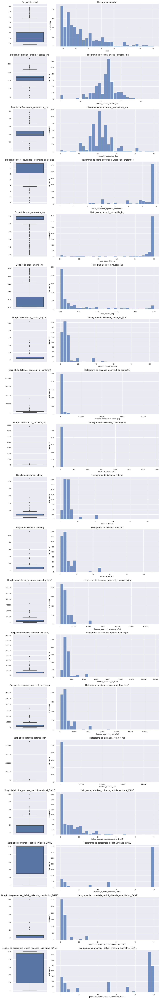

In [234]:
cols_num = ['edad', 'presion_arterial_sistolica_ing', 
            'frecuencia_respiratoria_ing', 'score_severidad_urgencias_anatomico', 
            'prob_sobrevida_ing', 'prob_muerte_ing','distance_center_ing(km)',
            'distance_openrout_tx_center(m)',
            'distance_cnuestra(km)', 'distance_fvl(km)', 'distance_huv(km)',
            'distance_openrout_cnuestra_tx(m)', 'distance_openrout_fvl_tx(m)',
            'distance_openrout_huv_tx(m)', 'distancia_retardo_min',
            'indice_pobreza_multidimensional_DANE','porcentaje_deficit_vivienda_DANE',
            'porcentaje_deficit_vivienda_cuantitativo_DANE',
            'porcentaje_deficit_vivienda_cualitativo_DANE']

cols_num2 = df[cols_num]
columnas = list(cols_num2.columns)

num_cols = len(columnas)
fig, axes = plt.subplots(num_cols, 2, figsize=(12, 4 * num_cols), gridspec_kw={'width_ratios': [1, 3]})

for idx, col in enumerate(columnas):

    sns.boxplot(y=cols_num2[col], ax=axes[idx, 0])
    axes[idx, 0].set_title(f'Boxplot de {col}', fontsize=12)
    axes[idx, 0].set_xlabel('')
    axes[idx, 0].set_ylabel('')

    sns.histplot(cols_num2[col], kde=False, ax=axes[idx, 1], bins=30)
    axes[idx, 1].set_title(f'Histograma de {col}', fontsize=12)
    axes[idx, 1].set_xlabel(col)
    axes[idx, 1].set_ylabel('Frecuencia')

sns.despine()
plt.tight_layout()
plt.show()

Los gráficos anteriores muestran un análisis gráfico que incluye tanto características fisiológicas de pacientes en situaciones de trauma como indicadores socioeconómicos y de vivienda en sus áreas de residencia, además de las distancias de traslado a centros de atención médica. Observamos una variedad de edades afectadas por el trauma, con una mayor incidencia en la población más joven y una presión arterial sistólica y frecuencia respiratoria que sugieren condiciones críticas durante emergencias. Las probabilidades de sobrevivir se inclinan hacia valores altos.

Además, se destaca que las distancias desde el lugar del evento hasta los centros de atención médica varían significativamente, con algunos traslados excepcionalmente largos que podrían influir en los resultados del tratamiento. Los datos adicionales sobre el índice de pobreza multidimensional y los déficits en vivienda, tanto cuantitativos como cualitativos, revelan que una considerable proporción de la población vive en condiciones de pobreza marcada y enfrenta serias deficiencias en su entorno habitacional. Estos factores no solo pueden complicar la logística del acceso a la atención médica sino que también pueden influir en la salud general de las comunidades afectadas por traumas. En conjunto, estos gráficos proporcionan una visión integral de las condiciones clínicas y socioeconómicas que rodean los eventos de trauma, resaltando la importancia de considerar tanto los aspectos médicos como los sociales en la gestión de emergencias.

Se incluyen descripciones adicionales de las demás variables, como sigue:

In [235]:
df.select_dtypes(['object']).drop(columns=['sitio_evento_trauma','registro']).head()

,hora_ing_hosp,fecha_trauma,hora_trauma,fecha_egreso,hora_egreso
0,00:11:00,NaT,23:30:00,2012-06-09 00:00:00,08:15:00
1,20:38:00,2012-03-04 00:00:00,20:00:00,2012-03-09 00:00:00,12:00:00
2,11:43:00,2012-05-26 00:00:00,10:00:00,2012-05-26 00:00:00,02:13:00
3,13:11:00,2012-04-19 00:00:00,12:15:00,2012-04-23 00:00:00,12:00:00
4,23:45:00,2013-03-30 00:00:00,23:15:00,2013-03-30 00:00:00,23:50:00


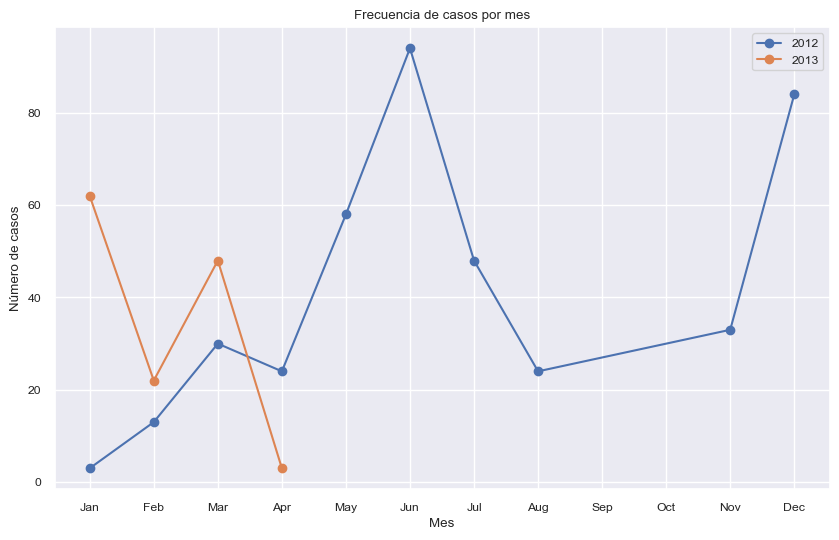

In [236]:
df['fecha_trauma'] = pd.to_datetime(df['fecha_trauma'])

df_2012 = df[df['fecha_trauma'].dt.year == 2012]
df_2013 = df[df['fecha_trauma'].dt.year == 2013]

monthly_counts_2012 = df_2012['fecha_trauma'].dt.month.value_counts().sort_index()
monthly_counts_2013 = df_2013['fecha_trauma'].dt.month.value_counts().sort_index()

month_names = [calendar.month_abbr[i] for i in range(1, 13)]

plt.figure(figsize=(10, 6))
plt.plot(monthly_counts_2012.index, monthly_counts_2012.values, label='2012', marker='o')
plt.plot(monthly_counts_2013.index, monthly_counts_2013.values, label='2013', marker='o')
plt.title('Frecuencia de casos por mes')
plt.xlabel('Mes')
plt.ylabel('Número de casos')
plt.xticks(range(1, 13), month_names)  
plt.legend()
plt.grid(True)
plt.show()

La gráfica anterior representa la distribución mensual de casos de trauma durante los años 2012 y 2013 en Cali-Colombia y sus alrededores, indicandp patrones estacionales claros con diferencias notables entre los dos años, lo que sugiere la influencia de múltiples factores dinámicos en la frecuencia de traumas. Se observan picos pronunciados durante los meses de junio en ambos años, mientras que septiembre presenta las menores incidencias.

Ahora se analiza la distribución de las horas más frecuentes en las que ocurren los eventos de trauma, así como las horas en las que los pacientes llegan al centro hospitalario:

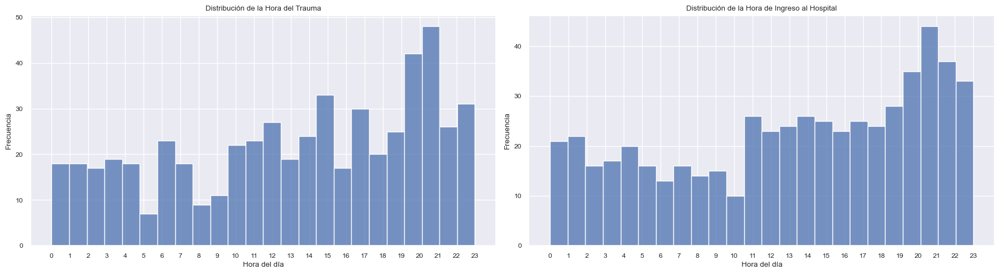

In [237]:
df['hora_ing_hosp'] = pd.to_datetime(df['hora_ing_hosp']).dt.hour
df['hora_trauma'] = pd.to_datetime(df['hora_trauma']).dt.hour
df['fecha_trauma'] = pd.to_datetime(df['fecha_trauma'], errors='coerce') 
df['mes_trauma'] = df['fecha_trauma'].dt.month

fig, axes = plt.subplots(1, 2, figsize=(18, 5))  

# Histograma de la hora del trauma
sns.histplot(df['hora_trauma'], bins=24, kde=False, ax=axes[0])
axes[0].set_title('Distribución de la Hora del Trauma')
axes[0].set_xlabel('Hora del día')
axes[0].set_ylabel('Frecuencia')
axes[0].set_xticks(range(0, 24)) 

# Histograma de la hora de ingreso al hospital
sns.histplot(df['hora_ing_hosp'], bins=24, kde=False, ax=axes[1])
axes[1].set_title('Distribución de la Hora de Ingreso al Hospital')
axes[1].set_xlabel('Hora del día')
axes[1].set_ylabel('Frecuencia')
axes[1].set_xticks(range(0, 24)) 

plt.tight_layout()
plt.show()

Los gráficos proporcionan un análisis detallado de los tiempos y frecuencias de los eventos de trauma y sus ingresos correspondientes al hospital a lo largo del día y del año. La distribución de la hora del trauma muestra un incremento notable en las tardes y noches, especialmente entre las 18:00 y 22:00 horas, lo que sugiere una mayor actividad y riesgo durante estas horas. Este patrón se refleja en las horas de ingreso al hospital, con un pico más marcado alrededor de las 20:00 a 21:00 horas, indicando un intervalo entre el momento del trauma y el ingreso hospitalario debido al transporte y respuesta de emergencia. A nivel anual, se observan variaciones significativas en la frecuencia de traumas, con picos en mayo, agosto y diciembre, posiblemente influenciados por factores estacionales o actividades específicas de esos períodos.

Además del análisis previamente descrito, avanzaremos con el cálculo de la matriz de correlaciones, utilizando el coeficiente de Spearman. Hemos incluido tanto las variables numéricas enteras como las continuas en este proceso.

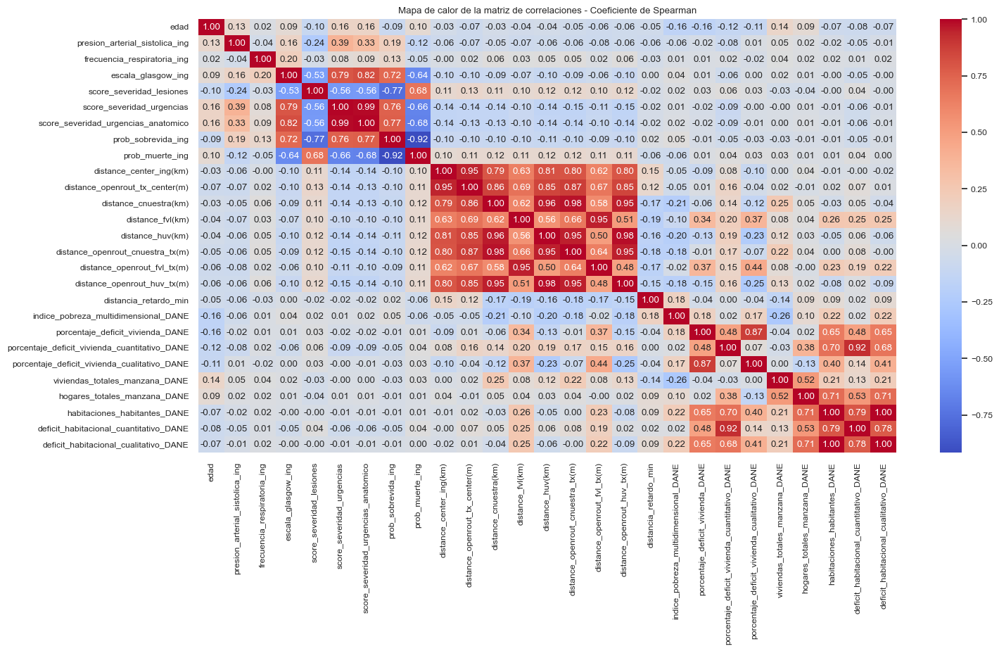

In [238]:
ev = df[['edad', 'presion_arterial_sistolica_ing', 
            'frecuencia_respiratoria_ing', 
            'escala_glasgow_ing', 
            'score_severidad_lesiones', 'score_severidad_urgencias', 
            'score_severidad_urgencias_anatomico',
            'prob_sobrevida_ing','prob_muerte_ing','distance_center_ing(km)', 
            'distance_openrout_tx_center(m)',
            'distance_cnuestra(km)', 'distance_fvl(km)', 'distance_huv(km)',
            'distance_openrout_cnuestra_tx(m)', 'distance_openrout_fvl_tx(m)',
            'distance_openrout_huv_tx(m)', 'distancia_retardo_min',
            'indice_pobreza_multidimensional_DANE','porcentaje_deficit_vivienda_DANE',
            'porcentaje_deficit_vivienda_cuantitativo_DANE',
            'porcentaje_deficit_vivienda_cualitativo_DANE','estrato_evento_trauma', 
            'viviendas_totales_manzana_DANE',
            'hogares_totales_manzana_DANE', 'habitaciones_habitantes_DANE',
            'deficit_habitacional_cuantitativo_DANE','deficit_habitacional_cualitativo_DANE']]
correlation_matrix = ev.corr(method='spearman')
plt.figure(figsize=(16, 8))  
sns.set_theme(font_scale=0.8) 
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Mapa de calor de la matriz de correlaciones - Coeficiente de Spearman')
plt.show()

Al examinar la matriz de correlaciones presentada, se observa una variedad de relaciones entre las variables asociadas con eventos de trauma. En el análisis, variables clínicas como la presión arterial sistólica y la frecuencia respiratoria muestran correlaciones moderadas entre sí (0.33), lo cual es esperable dada su naturaleza fisiológica relacionada con la respuesta del cuerpo en situaciones de estrés o trauma. La escala de Glasgow, que es un indicador crucial del estado neurológico, presenta correlaciones significativas con el score de severidad de lesiones (0.79) y urgencias (0.82), lo que subraya la consistencia en la evaluación de la gravedad del trauma. Sin embargo, muchas de las variables en el estudio, incluyendo varias relacionadas con datos geográficos y socioeconómicos como el índice de pobreza multidimensional y las características de la vivienda (deficit habitacional cualitativo y cuantitativo), exhiben valores de correlación por debajo de 0.3, señalando una relación débil. Esto indica que, aunque estos factores son relevantes para el contexto general del estudio, no poseen una relación lineal fuerte con otras variables clínicas o de distancia en este conjunto de datos específico. Además, algunas correlaciones altas como las observadas en diferentes mediciones de distancia (por ejemplo, entre distancia al centro operacional y al centro médico más cercano, con valores cercanos a 1.0) validan la coherencia y precisión en la medición de estos factores geográficos. 

### Análisis de outliers

En el análisis de los datos clínicos de pacientes que llegaron a urgencias tras sufrir eventos de trauma civil por múltiples causas, se ha decidido no emplear el método del rango intercuartílico para la detección de outliers. Esta decisión se basa en la comprensión de que, en el contexto de trauma civil, los casos extremos o valores atípicos pueden ser manifestaciones legítimas y clínicamente significativas de variaciones en la gravedad o naturaleza del trauma. Es crucial reconocer que, debido a la diversidad y la complejidad de los eventos de trauma, los valores que se desvían significativamente de lo común pueden proporcionar insights importantes sobre circunstancias clínicas particulares o presentaciones inusuales del trauma.

Por tanto, en lugar de aplicar un método que podría eliminar datos valiosos, se adoptará un enfoque alternativo. Se presentarán 20 instancias para cada variable, identificando aquellos valores que se sitúen por debajo o por encima de los umbrales establecidos. El objetivo es examinar las variables asociadas a estos casos para determinar la conveniencia de excluir o, alternativamente, mantenerlos en el análisis.

En este análisis se consideran ciertas variables seleccionadas. Algunas de ellas provienen directamente de fuentes externas como el DANE, mientras que otras corresponden a información geográfica y otras más se derivan de cálculos basados en resultados de estudios previos, como modelos predictivos para la supervivencia.

In [239]:
df.select_dtypes(['float','int']).columns

Index(['id_unico', 'hora_ing_hosp', 'hora_trauma', 'edad',
       'presion_arterial_sistolica_ing', 'frecuencia_respiratoria_ing',
       'escala_glasgow_ing', 'score_severidad_lesiones', 'latitud_evento',
       'longitud_evento', 'latitud_centro', 'longitud_centro',
       'score_severidad_urgencias', 'score_severidad_urgencias_anatomico',
       'b_init', 'prob_sobrevida_ing', 'prob_muerte_ing',
       'distance_center_ing(km)', 'distance_openrout_tx_center(m)',
       'distance_cnuestra(km)', 'distance_fvl(km)', 'distance_huv(km)',
       'distance_openrout_cnuestra_tx(m)', 'distance_openrout_fvl_tx(m)',
       'distance_openrout_huv_tx(m)', 'distancia_retardo_min',
       'indice_pobreza_multidimensional_DANE',
       'viviendas_totales_manzana_DANE', 'hogares_totales_manzana_DANE',
       'habitaciones_habitantes_DANE',
       'deficit_habitacional_cuantitativo_DANE',
       'deficit_habitacional_cualitativo_DANE',
       'porcentaje_deficit_vivienda_DANE',
       'porcentaje_def

In [240]:
columnas = ['edad', 'presion_arterial_sistolica_ing', 'frecuencia_respiratoria_ing', 
            'escala_glasgow_ing', 'score_severidad_lesiones', 'score_severidad_urgencias',
            'score_severidad_urgencias_anatomico', 
             'distance_center_ing(km)',
            'distance_openrout_tx_center(m)', 'distance_cnuestra(km)',
            'distance_fvl(km)', 'distance_huv(km)',
            'distance_openrout_cnuestra_tx(m)', 'distance_openrout_fvl_tx(m)',
            'distance_openrout_huv_tx(m)', 'distancia_retardo_min']

outliers = dict()
for col in columnas:
  outliers[col+"_outliers"] = set(df[col].nlargest(20).index)
  columnas_clinicas = ['edad', 'presion_arterial_sistolica_ing', 'frecuencia_respiratoria_ing', 
            'escala_glasgow_ing', 'score_severidad_lesiones', 'score_severidad_urgencias',
            'score_severidad_urgencias_anatomico' ]
  columnas_distancias = ['distance_center_ing(km)',
            'distance_openrout_tx_center(m)', 'distance_cnuestra(km)',
            'distance_fvl(km)', 'distance_huv(km)',
            'distance_openrout_cnuestra_tx(m)', 'distance_openrout_fvl_tx(m)',
            'distance_openrout_huv_tx(m)', 'distancia_retardo_min']

In [241]:
for col in columnas_clinicas:
  print(f"{col} - posibles outliers: {len(df.loc[list(outliers[col+'_outliers']),:])}")
  display(df.loc[list(outliers[col+"_outliers"]),:])

edad - posibles outliers: 20


,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE,mes_trauma
129,130,58,Clínica Nuestra,2012-06-06,18,Masculino,1932-08-30,2012-06-06,17.00,82.00,Lesiones de tránsito,No,calle 73 carrera 14,Ambulancia básica,NaN,Si,150.00,28.00,13,3,0,4,2,0,0,29,Si,Si,2012-06-07 00:00:00,07:30:00,3.48,-76.49,3.43,-76.53,Comuna 6,2,4,4.00,4,12,7.84,1.00,2.10,0.89,0.10,8.38,"11,937.00",8.38,13.10,8.88,"11,937.00","15,419.00","12,590.00",0.00,No,Baja,8.10,Baja,Media-Baja,3,3,3,0,3,100.00,0.00,100.00,6.00
3,4,3,Fundación Valle del Lili,2012-04-19,13,Femenino,1934-09-09,2012-04-19,12.00,77.00,Caídas,No,avenida 6 calle 35,Ambulancia básica,Contributivo,NaN,178.00,20.00,15,0,0,0,0,3,0,9,No,Si,2012-04-23 00:00:00,12:00:00,3.47,-76.53,3.37,-76.53,Comuna 2,5,4,4.00,4,12,7.84,1.00,3.64,0.97,0.02,13.69,"12,434.00",5.37,11.09,5.20,"7,824.00","12,437.00","5,898.00","6,536.00",Si,Baja,20.70,Media-Baja,Media-Baja,103,141,141,6,135,100.00,4.26,95.74,4.00
518,519,N085,Fundación Valle del Lili,2012-08-23,18,Masculino,NaT,2012-08-23,15.00,91.00,Caídas,No,calle 58 carrera 2gn,Vehículo particular,Contributivo,NaN,125.00,19.00,15,0,0,0,0,3,0,9,No,NaN,2012-08-26 00:00:00,09:49:00,3.49,-76.51,3.37,-76.53,Comuna 2,5,4,4.00,4,12,7.84,1.00,3.64,0.97,0.02,15.17,"14,245.00",7.31,12.74,7.39,"9,635.00","14,247.00","8,038.00","6,207.00",Si,Media-Alta,0.80,Baja,Media-Baja,8,1,1,0,1,100.00,0.00,100.00,8.00
12,13,7,Fundación Valle del Lili,2012-04-05,20,Masculino,NaT,2012-04-05,19.00,86.00,Lesiones de tránsito,No,santander de q,Ambulancia medicalizada,Otro,Si,119.00,14.00,8,3,2,0,0,0,0,13,No,Si,2012-05-02 00:00:00,12:00:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,1.00,1.54,0.82,0.14,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,4.00
528,529,N104,Fundación Valle del Lili,2012-02-03,9,Femenino,1933-02-16,2012-02-03,7.00,78.00,Caídas,No,carrera 7 calle 5,Vehículo particular,Contributivo,NaN,129.00,18.00,15,0,0,0,0,3,0,9,No,NaN,2012-02-07 00:00:00,07:33:00,3.47,-76.48,3.37,-76.53,Comuna 7,3,4,4.00,4,12,7.84,1.00,3.64,0.97,0.02,13.27,"12,831.00",7.10,11.30,7.87,"9,352.00","12,834.00","10,005.00","3,479.00",Si,Baja,0.00,Baja,Media,8,21,21,0,21,100.00,0.00,100.00,2.00
529,530,N105,Fundación Valle del Lili,2012-02-03,12,Femenino,NaT,2012-02-03,11.00,82.00,Caídas,No,diagonal 65 calle 33,Ambulancia básica,Contributivo,NaN,133.00,18.00,15,0,0,0,0,3,0,9,No,NaN,2012-02-14 00:00:00,14:14:00,3.40,-76.52,3.37,-76.53,Comuna 16,2,4,4.00,4,12,7.84,1.00,3.64,0.97,0.02,5.49,"4,388.00",3.19,2.95,4.37,"4,663.00","4,391.00","6,357.00",0.00,No,Alta,6.40,Baja,Media,0,2,0,0,0,0.00,0.00,0.00,2.00
532,533,N114,Fu

presion_arterial_sistolica_ing - posibles outliers: 20


,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE,mes_trauma
3,4,3,Fundación Valle del Lili,2012-04-19,13,Femenino,1934-09-09,2012-04-19,12.00,77.00,Caídas,No,avenida 6 calle 35,Ambulancia básica,Contributivo,NaN,178.00,20.00,15,0,0,0,0,3,0,9,No,Si,2012-04-23 00:00:00,12:00:00,3.47,-76.53,3.37,-76.53,Comuna 2,5,4,4.00,4,12,7.84,1.00,3.64,0.97,0.02,13.69,"12,434.00",5.37,11.09,5.20,"7,824.00","12,437.00","5,898.00","6,536.00",Si,Baja,20.70,Media-Baja,Media-Baja,103,141,141,6,135,100.00,4.26,95.74,4.00
5,6,4,Clínica Nuestra,2012-05-17,21,Masculino,1971-11-14,2012-05-17,20.00,43.00,Lesiones de tránsito,No,calle 14 carrera 44,Ambulancia básica,NaN,Si,184.00,20.00,15,0,0,3,0,2,0,13,No,No,2014-05-19 00:00:00,03:18:00,3.42,-76.55,3.43,-76.53,Comuna 19,4,4,4.00,4,12,7.84,0.00,5.24,0.99,0.01,1.72,"2,411.00",1.72,5.73,1.17,"2,411.00","8,675.00","2,122.00",289.00,Si,Baja,0.00,Baja,Media-Baja,12,1,1,0,1,100.00,0.00,100.00,5.00
525,526,N095,Fundación Valle del Lili,2012-03-10,11,Femenino,1947-06-21,2012-03-10,10.00,64.00,Arma de fuego,Si,jamundi,Ambulancia básica,Contributivo,NaN,169.00,20.00,3,5,5,0,0,0,0,50,Si,Si,2012-03-10 00:00:00,16:24:00,3.26,-76.54,3.37,-76.53,Fuera de Cali,2,4,0.00,4,8,4.09,1.00,-6.17,0.00,0.00,10.23,"14,083.00",18.18,10.23,18.73,"21,308.00","12,491.00","22,892.00",0.00,No,Media-Alta,0.00,Baja,Media,14,2,1,0,1,50.00,0.00,50.00,3.00
269,270,139,Fundación Valle del Lili,2012-03-09,19,Masculino,1990-08-08,2012-03-09,19.00,21.00,Arma de fuego,Si,montebello,Ambulancia básica,Subsidiado,NaN,164.00,16.00,15,0,0,3,0,0,0,9,No,Si,2012-03-12 00:00:00,17:33:00,3.48,-76.55,3.37,-76.53,Área Rural de Cali,1,4,4.00,4,12,7.84,0.00,6.99,1.00,0.00,14.51,"19,007.00",5.95,11.71,5.10,"11,517.00","19,009.00","9,619.00","9,388.00",Si,Baja,38.50,Baja,Media-Baja,59,96,96,1,95,100.00,1.04,98.96,3.00
409,410,284,Universitario del Valle,2013-03-19,20,Masculino,1960-11-09,2013-03-19,18.00,52.00,Caídas,No,carrera 7d calle 73,Ambulancia básica,Subsidiado,NaN,180.00,20.00,13,4,0,0,0,0,0,16,No,Si,2013-03-22 00:00:00,12:00:00,3.46,-76.48,3.43,-76.55,Comuna 7,3,4,4.00,4,12,7.84,0.00,5.01,0.99,0.01,8.15,"10,009.00",7.30,11.28,8.15,"9,356.00","12,838.00","10,009.00",653.00,Si,Baja,14.60,Media-Baja,Media-Baja,8,21,21,0,21,100.00,0.00,100.00,3.00
33,34,15,Universitario del Valle,2012-12-27,13,Masculino,NaT,2012-12-27,11.00,18.00,Arma de fuego,Si,diagonal 26p transversal 103,Ambulancia básica,Subsidiado,NaN,170.00,10.00,3,5,0,0,0,0,0,25,Si,Si,2012-12-27 00:00:00,16:30:00,3.43,-76.48,3.43,-76.55,Comuna 14,1,4,0.00,4,8,4.09,0.00,0.29,0.57,0.24,7.57,"10,774.00",6.23,8.05,7.57,"10,121.00","10,508.00","10,774.00",653.00,Si,Baja,5.30,Baja,Media,4,33,33,2,31,100.00,6.0

frecuencia_respiratoria_ing - posibles outliers: 20


,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE,mes_trauma
142,143,66,Universitario del Valle,2012-11-18,0,Masculino,1970-04-21,2012-11-17,23.00,42.00,Arma de fuego,Si,carrera 42 calle 1a,Ambulancia básica,Subsidiado,NaN,70.00,40.00,15,0,3,4,0,3,0,34,No,Si,2012-12-16 00:00:00,12:00:00,3.38,-76.55,3.43,-76.55,Comuna 18,1,2,4.00,3,9,6.53,0.00,1.70,0.85,0.13,5.20,"7,499.00",5.11,3.36,5.20,"6,276.00","7,525.00","7,499.00","1,223.00",Si,Baja,14.40,Media-Alta,Media,750,127,5,0,5,3.94,0.00,3.94,11.00
15,16,8,Universitario del Valle,2013-03-06,2,Masculino,1989-07-06,2013-03-06,2.00,23.00,Arma de fuego,Si,calle 17 carrera 33b,Ambulancia básica,Subsidiado,NaN,60.00,40.00,15,0,2,4,0,2,0,24,Si,Si,2013-03-10 00:00:00,03:45:00,3.42,-76.52,3.43,-76.55,Comuna 11,3,2,4.00,3,9,6.53,0.00,3.22,0.96,0.04,2.98,"5,332.00",1.56,5.57,2.98,"3,259.00","6,592.00","5,332.00","2,073.00",Si,Media,8.50,Media-Baja,Media,4,33,33,2,31,100.00,6.06,93.94,3.00
149,150,70,Universitario del Valle,2012-12-15,1,Masculino,1973-04-02,NaT,0.00,39.00,Arma cortopunzante,Si,carrera 31a calle 26b,Vehículo particular,Subsidiado,NaN,110.00,40.00,13,0,0,3,3,0,0,18,No,Si,2012-12-20 00:00:00,12:00:00,3.43,-76.52,3.43,-76.55,Comuna 11,3,4,4.00,3,11,7.11,0.00,4.79,0.99,0.01,3.02,"5,059.00",1.66,5.93,3.02,"2,986.00","6,904.00","5,059.00","2,073.00",Si,Media,24.90,Baja,Media-Baja,4,33,33,2,31,100.00,6.06,93.94,NaN
31,32,14,Universitario del Valle,2012-12-23,1,Masculino,NaT,2012-12-23,0.00,18.00,Lesiones de tránsito,No,carrera 44 calle 5,Fuerza pública,Subsidiado,Si,150.00,50.00,10,2,2,0,0,0,1,9,No,Si,2012-12-27 00:00:00,12:00:00,3.42,-76.55,3.43,-76.55,Comuna 19,4,4,3.00,3,10,6.17,0.00,3.95,0.98,0.02,1.17,"2,122.00",1.72,5.73,1.17,"2,411.00","8,675.00","2,122.00",0.00,No,Baja,0.00,Baja,Media-Baja,12,1,1,0,1,100.00,0.00,100.00,12.00
550,551,N150,Fundación Valle del Lili,2012-06-23,23,Masculino,NaT,2012-06-23,23.00,18.00,Lesiones de tránsito,No,puerto tejada,Ambulancia medicalizada,Contributivo,Si,153.00,40.00,3,5,0,4,0,0,0,41,Si,Si,2012-06-25 00:00:00,23:49:00,3.32,-76.50,3.37,-76.53,Fuera de Cali,2,4,0.00,3,7,3.36,0.00,-1.19,0.23,0.18,3.99,"7,589.00",12.42,6.83,13.44,"14,814.00","7,592.00","16,399.00",0.00,No,Baja,0.00,Baja,Media-Alta,19,18,18,5,13,100.00,27.78,72.22,6.00
299,300,162,Universitario del Valle,2012-12-21,22,Masculino,1985-07-07,2012-12-21,20.00,27.00,Arma de fuego,Si,calle 10 carrera 8,Fuerza pública,Subsidiado,NaN,100.00,48.00,15,5,0,0,0,3,0,34,No,Si,2013-01-22 00:00:00,12:00:00,3.45,-76.53,3.43,-76.55,Comuna 9,3,4,4.00,3,11,7.11,0.00,2.37,0.91,0.08,3.17,"3,633.00",2.99,8.64,3.17,"4,666.00","9,896.00","3,633.00",0.00,No,Media,0.00,Baja,Media-Baja,103,141,141,6,135,100.00,4.

escala_glasgow_ing - posibles outliers: 20


,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE,mes_trauma
1,2,2,Fundación Valle del Lili,2012-03-04,20,Masculino,1959-07-08,2012-03-04,20.00,52.00,Arma de fuego,Si,carrera 70 calle 13,NaN,Contributivo,NaN,90.00,18.00,15,2,1,5,0,0,0,30,No,Si,2012-03-09 00:00:00,12:00:00,3.39,-76.55,3.37,-76.53,Comuna 18,1,4,4.00,4,12,7.84,0.00,3.81,0.98,0.02,6.28,"5,917.00",4.03,3.57,4.12,"4,671.00","5,920.00","5,894.00","1,246.00",Si,Media-Alta,2.30,Baja,Media,750,127,5,0,5,3.94,0.00,3.94,3.00
3,4,3,Fundación Valle del Lili,2012-04-19,13,Femenino,1934-09-09,2012-04-19,12.00,77.00,Caídas,No,avenida 6 calle 35,Ambulancia básica,Contributivo,NaN,178.00,20.00,15,0,0,0,0,3,0,9,No,Si,2012-04-23 00:00:00,12:00:00,3.47,-76.53,3.37,-76.53,Comuna 2,5,4,4.00,4,12,7.84,1.00,3.64,0.97,0.02,13.69,"12,434.00",5.37,11.09,5.20,"7,824.00","12,437.00","5,898.00","6,536.00",Si,Baja,20.70,Media-Baja,Media-Baja,103,141,141,6,135,100.00,4.26,95.74,4.00
5,6,4,Clínica Nuestra,2012-05-17,21,Masculino,1971-11-14,2012-05-17,20.00,43.00,Lesiones de tránsito,No,calle 14 carrera 44,Ambulancia básica,NaN,Si,184.00,20.00,15,0,0,3,0,2,0,13,No,No,2014-05-19 00:00:00,03:18:00,3.42,-76.55,3.43,-76.53,Comuna 19,4,4,4.00,4,12,7.84,0.00,5.24,0.99,0.01,1.72,"2,411.00",1.72,5.73,1.17,"2,411.00","8,675.00","2,122.00",289.00,Si,Baja,0.00,Baja,Media-Baja,12,1,1,0,1,100.00,0.00,100.00,5.00
7,8,5,Fundación Valle del Lili,2012-04-01,9,Masculino,1960-02-01,2012-04-01,9.00,52.00,Caídas,No,avenida 2b norte calle 30,Vehículo particular,Contributivo,NaN,87.00,28.00,15,0,0,0,0,3,0,9,No,Si,2012-04-04 00:00:00,12:00:00,3.47,-76.52,3.37,-76.53,Comuna 2,5,3,4.00,4,11,7.55,0.00,5.27,0.99,0.01,12.85,"12,964.00",4.70,10.29,4.77,"8,354.00","12,967.00","6,602.00","6,362.00",Si,Media-Baja,2.30,Media-Alta,Media-Baja,103,141,141,6,135,100.00,4.26,95.74,4.00
8,9,5,Universitario del Valle,2013-03-01,21,Masculino,1986-08-27,2013-03-01,21.00,26.00,Arma de fuego,Si,montebello,Vehículo particular,Subsidiado,NaN,86.00,28.00,15,0,0,4,2,2,0,24,Si,Si,2013-03-01 00:00:00,22:30:00,3.48,-76.55,3.43,-76.55,Área Rural de Cali,1,3,4.00,4,11,7.55,0.00,4.39,0.99,0.01,5.10,"9,619.00",5.95,11.71,5.10,"11,517.00","19,009.00","9,619.00",0.00,No,Baja,38.50,Baja,Media-Baja,59,96,96,1,95,100.00,1.04,98.96,3.00
9,10,6,Universitario del Valle,2013-03-09,3,Masculino,NaT,2013-03-09,2.00,42.00,Arma de fuego,Si,yumbo,Ambulancia básica,Contributivo,NaN,90.00,18.00,15,4,0,5,0,0,0,41,Si,Si,2013-03-09 00:00:00,1900-01-06 09:36:00,3.58,-76.50,3.43,-76.55,Fuera de Cali,2,4,4.00,4,12,7.84,0.00,2.14,0.90,0.09,17.93,"20,938.00",18.11,23.64,17.93,"22,535.00","27,148.00","20,938.00",0.00,No,Media,22.06,Media-Baja,Media-Baja,42,55,5,0,5,9.09,0.00,9.09,3.

score_severidad_lesiones - posibles outliers: 20


,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE,mes_trauma
13,14,7,Universitario del Valle,2013-03-08,22,Masculino,NaT,2013-03-08,21.00,18.00,Arma de fuego,Si,carrera 37 calle 20,Ambulancia básica,Sin aseguramiento,NaN,100.00,16.00,3,5,0,5,4,0,0,66,Si,Si,2013-03-09 00:00:00,01:30:00,3.42,-76.51,3.43,-76.55,Comuna 11,3,4,0.00,4,8,4.09,0.00,-5.93,0.00,0.00,4.13,"5,208.00",2.71,5.57,4.13,"3,426.00","6,739.00","5,208.00","1,782.00",Si,Media,16.90,Media-Baja,Media,4,33,33,2,31,100.00,6.06,93.94,3.00
525,526,N095,Fundación Valle del Lili,2012-03-10,11,Femenino,1947-06-21,2012-03-10,10.00,64.00,Arma de fuego,Si,jamundi,Ambulancia básica,Contributivo,NaN,169.00,20.00,3,5,5,0,0,0,0,50,Si,Si,2012-03-10 00:00:00,16:24:00,3.26,-76.54,3.37,-76.53,Fuera de Cali,2,4,0.00,4,8,4.09,1.00,-6.17,0.00,0.00,10.23,"14,083.00",18.18,10.23,18.73,"21,308.00","12,491.00","22,892.00",0.00,No,Media-Alta,0.00,Baja,Media,14,2,1,0,1,50.00,0.00,50.00,3.00
18,19,9,Universitario del Valle,2013-03-09,21,Masculino,1982-03-17,2013-03-09,20.00,30.00,Arma de fuego,Si,carrera 17 calle 18,Vehículo particular,Sin aseguramiento,NaN,0.00,6.00,3,6,0,5,0,0,0,61,Si,Si,2013-03-09 00:00:00,21:15:00,3.44,-76.52,3.43,-76.55,Comuna 8,3,1,0.00,2,3,1.76,0.00,-7.84,0.00,0.00,3.33,"4,591.00",2.58,7.77,3.33,"3,938.00","8,551.00","4,591.00",653.00,Si,Media,23.50,Baja,Media,4,33,33,2,31,100.00,6.06,93.94,3.00
537,538,N123,Fundación Valle del Lili,2012-02-20,15,Masculino,1986-06-05,2012-02-20,14.00,25.00,Arma de fuego,Si,santander de q,Ambulancia básica,Subsidiado,NaN,60.00,20.00,4,0,0,5,5,0,0,50,Si,Si,2012-02-20 00:00:00,18:05:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,2,1.00,4,7,4.45,0.00,-3.10,0.04,0.04,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,2.00
538,539,N127,Fundación Valle del Lili,2012-02-21,13,Masculino,1981-06-22,2012-02-21,13.00,30.00,Arma de fuego,Si,carlos holmes,Ambulancia básica,Contributivo,NaN,68.00,20.00,8,5,0,5,5,0,0,75,Si,Si,2012-03-01 00:00:00,16:31:00,3.42,-76.49,3.37,-76.53,Comuna 13,2,2,2.00,4,8,5.39,0.00,-5.82,0.00,0.00,8.41,"9,167.00",4.77,6.72,6.15,"7,101.00","9,170.00","7,754.00","2,066.00",Si,Media,11.10,Baja,Media-Baja,4,33,33,2,31,100.00,6.06,93.94,2.00
29,30,14,Universitario del Valle,2013-01-12,20,Masculino,1993-02-23,2013-01-12,20.00,19.00,Arma de fuego,Si,siloe,Vehículo particular,Contributivo,NaN,90.00,13.00,3,5,0,4,4,0,0,57,Si,Si,2013-01-12 00:00:00,20:55:00,3.42,-76.56,3.43,-76.55,Comuna 20,1,4,0.00,4,8,4.09,0.00,-4.57,0.01,0.01,1.57,"2,884.00",2.51,6.15,1.57,"3,831.00","8,812.00","2,884.00",0.00,No,Media,20.40,Media-Alta,Media,12,1,1,0,1,100.00,0.00,100.00,1.00
2

score_severidad_urgencias - posibles outliers: 20


,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE,mes_trauma
1,2,2,Fundación Valle del Lili,2012-03-04,20,Masculino,1959-07-08,2012-03-04,20.00,52.00,Arma de fuego,Si,carrera 70 calle 13,NaN,Contributivo,NaN,90.00,18.00,15,2,1,5,0,0,0,30,No,Si,2012-03-09 00:00:00,12:00:00,3.39,-76.55,3.37,-76.53,Comuna 18,1,4,4.00,4,12,7.84,0.00,3.81,0.98,0.02,6.28,"5,917.00",4.03,3.57,4.12,"4,671.00","5,920.00","5,894.00","1,246.00",Si,Media-Alta,2.30,Baja,Media,750,127,5,0,5,3.94,0.00,3.94,3.00
3,4,3,Fundación Valle del Lili,2012-04-19,13,Femenino,1934-09-09,2012-04-19,12.00,77.00,Caídas,No,avenida 6 calle 35,Ambulancia básica,Contributivo,NaN,178.00,20.00,15,0,0,0,0,3,0,9,No,Si,2012-04-23 00:00:00,12:00:00,3.47,-76.53,3.37,-76.53,Comuna 2,5,4,4.00,4,12,7.84,1.00,3.64,0.97,0.02,13.69,"12,434.00",5.37,11.09,5.20,"7,824.00","12,437.00","5,898.00","6,536.00",Si,Baja,20.70,Media-Baja,Media-Baja,103,141,141,6,135,100.00,4.26,95.74,4.00
5,6,4,Clínica Nuestra,2012-05-17,21,Masculino,1971-11-14,2012-05-17,20.00,43.00,Lesiones de tránsito,No,calle 14 carrera 44,Ambulancia básica,NaN,Si,184.00,20.00,15,0,0,3,0,2,0,13,No,No,2014-05-19 00:00:00,03:18:00,3.42,-76.55,3.43,-76.53,Comuna 19,4,4,4.00,4,12,7.84,0.00,5.24,0.99,0.01,1.72,"2,411.00",1.72,5.73,1.17,"2,411.00","8,675.00","2,122.00",289.00,Si,Baja,0.00,Baja,Media-Baja,12,1,1,0,1,100.00,0.00,100.00,5.00
6,7,5,Clínica Nuestra,2012-05-18,10,Masculino,1984-09-07,2012-05-18,10.00,30.00,Lesiones de tránsito,No,calle 10 # 42 -84,Ambulancia básica,NaN,Si,120.00,24.00,14,3,0,0,0,1,1,11,No,No,2012-05-19 00:00:00,11:38:00,3.44,-76.53,3.43,-76.53,Comuna 3,3,4,4.00,4,12,7.84,0.00,5.39,1.00,0.00,2.05,"3,236.00",2.05,7.84,2.09,"3,236.00","10,729.00","2,204.00","1,032.00",Si,Media-Baja,19.40,Baja,Media-Baja,103,141,141,6,135,100.00,4.26,95.74,5.00
9,10,6,Universitario del Valle,2013-03-09,3,Masculino,NaT,2013-03-09,2.00,42.00,Arma de fuego,Si,yumbo,Ambulancia básica,Contributivo,NaN,90.00,18.00,15,4,0,5,0,0,0,41,Si,Si,2013-03-09 00:00:00,1900-01-06 09:36:00,3.58,-76.50,3.43,-76.55,Fuera de Cali,2,4,4.00,4,12,7.84,0.00,2.14,0.90,0.09,17.93,"20,938.00",18.11,23.64,17.93,"22,535.00","27,148.00","20,938.00",0.00,No,Media,22.06,Media-Baja,Media-Baja,42,55,5,0,5,9.09,0.00,9.09,3.00
10,11,6,Clínica Nuestra,2012-05-18,16,Femenino,1968-12-08,2012-05-18,15.00,46.00,Lesiones de tránsito,No,calle 44 carrera 50,Ambulancia básica,NaN,Si,120.00,18.00,15,3,0,0,0,1,1,11,No,No,2012-05-27 00:00:00,13:13:00,3.41,-76.54,3.43,-76.53,Comuna 19,4,4,4.00,4,12,7.84,0.00,5.39,1.00,0.00,1.74,"2,129.00",1.74,4.81,1.92,"2,129.00","7,113.00","3,165.00",0.00,No,Media,3.90,Baja,Media-Baja,12,1,1,0,1,100.00,0.00,100.00,5.00
11,12,6,Fundación Valle del Li

score_severidad_urgencias_anatomico - posibles outliers: 20


,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE,mes_trauma
1,2,2,Fundación Valle del Lili,2012-03-04,20,Masculino,1959-07-08,2012-03-04,20.00,52.00,Arma de fuego,Si,carrera 70 calle 13,NaN,Contributivo,NaN,90.00,18.00,15,2,1,5,0,0,0,30,No,Si,2012-03-09 00:00:00,12:00:00,3.39,-76.55,3.37,-76.53,Comuna 18,1,4,4.00,4,12,7.84,0.00,3.81,0.98,0.02,6.28,"5,917.00",4.03,3.57,4.12,"4,671.00","5,920.00","5,894.00","1,246.00",Si,Media-Alta,2.30,Baja,Media,750,127,5,0,5,3.94,0.00,3.94,3.00
3,4,3,Fundación Valle del Lili,2012-04-19,13,Femenino,1934-09-09,2012-04-19,12.00,77.00,Caídas,No,avenida 6 calle 35,Ambulancia básica,Contributivo,NaN,178.00,20.00,15,0,0,0,0,3,0,9,No,Si,2012-04-23 00:00:00,12:00:00,3.47,-76.53,3.37,-76.53,Comuna 2,5,4,4.00,4,12,7.84,1.00,3.64,0.97,0.02,13.69,"12,434.00",5.37,11.09,5.20,"7,824.00","12,437.00","5,898.00","6,536.00",Si,Baja,20.70,Media-Baja,Media-Baja,103,141,141,6,135,100.00,4.26,95.74,4.00
5,6,4,Clínica Nuestra,2012-05-17,21,Masculino,1971-11-14,2012-05-17,20.00,43.00,Lesiones de tránsito,No,calle 14 carrera 44,Ambulancia básica,NaN,Si,184.00,20.00,15,0,0,3,0,2,0,13,No,No,2014-05-19 00:00:00,03:18:00,3.42,-76.55,3.43,-76.53,Comuna 19,4,4,4.00,4,12,7.84,0.00,5.24,0.99,0.01,1.72,"2,411.00",1.72,5.73,1.17,"2,411.00","8,675.00","2,122.00",289.00,Si,Baja,0.00,Baja,Media-Baja,12,1,1,0,1,100.00,0.00,100.00,5.00
6,7,5,Clínica Nuestra,2012-05-18,10,Masculino,1984-09-07,2012-05-18,10.00,30.00,Lesiones de tránsito,No,calle 10 # 42 -84,Ambulancia básica,NaN,Si,120.00,24.00,14,3,0,0,0,1,1,11,No,No,2012-05-19 00:00:00,11:38:00,3.44,-76.53,3.43,-76.53,Comuna 3,3,4,4.00,4,12,7.84,0.00,5.39,1.00,0.00,2.05,"3,236.00",2.05,7.84,2.09,"3,236.00","10,729.00","2,204.00","1,032.00",Si,Media-Baja,19.40,Baja,Media-Baja,103,141,141,6,135,100.00,4.26,95.74,5.00
9,10,6,Universitario del Valle,2013-03-09,3,Masculino,NaT,2013-03-09,2.00,42.00,Arma de fuego,Si,yumbo,Ambulancia básica,Contributivo,NaN,90.00,18.00,15,4,0,5,0,0,0,41,Si,Si,2013-03-09 00:00:00,1900-01-06 09:36:00,3.58,-76.50,3.43,-76.55,Fuera de Cali,2,4,4.00,4,12,7.84,0.00,2.14,0.90,0.09,17.93,"20,938.00",18.11,23.64,17.93,"22,535.00","27,148.00","20,938.00",0.00,No,Media,22.06,Media-Baja,Media-Baja,42,55,5,0,5,9.09,0.00,9.09,3.00
10,11,6,Clínica Nuestra,2012-05-18,16,Femenino,1968-12-08,2012-05-18,15.00,46.00,Lesiones de tránsito,No,calle 44 carrera 50,Ambulancia básica,NaN,Si,120.00,18.00,15,3,0,0,0,1,1,11,No,No,2012-05-27 00:00:00,13:13:00,3.41,-76.54,3.43,-76.53,Comuna 19,4,4,4.00,4,12,7.84,0.00,5.39,1.00,0.00,1.74,"2,129.00",1.74,4.81,1.92,"2,129.00","7,113.00","3,165.00",0.00,No,Media,3.90,Baja,Media-Baja,12,1,1,0,1,100.00,0.00,100.00,5.00
11,12,6,Fundación Valle del Li

Al revisar las variables clínicas mencionadas (edad, presion_arterial_sistolica_ing, frecuencia_respiratoria_ing, 
escala_glasgow_ing, score_severidad_lesiones, score_severidad_urgencias, score_severidad_urgencias_anatomico) y considerar la información completa del conjunto de datos, no se identifican posibles valores atípicos. Los valores observados se encuentran dentro del rango natural de la variable en cuestión, en relación con las demás características del paciente.

In [242]:
for col in columnas_distancias:
  print(f"{col} - posibles outliers: {len(df.loc[list(outliers[col+'_outliers']),:])}")
  display(df.loc[list(outliers[col+"_outliers"]),:])

distance_center_ing(km) - posibles outliers: 20


,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE,mes_trauma
12,13,7,Fundación Valle del Lili,2012-04-05,20,Masculino,NaT,2012-04-05,19.00,86.00,Lesiones de tránsito,No,santander de q,Ambulancia medicalizada,Otro,Si,119.00,14.00,8,3,2,0,0,0,0,13,No,Si,2012-05-02 00:00:00,12:00:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,1.00,1.54,0.82,0.14,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,4.00
276,277,142,Fundación Valle del Lili,2012-03-11,7,Masculino,1980-04-24,2012-03-11,6.00,32.00,Arma de fuego,Si,santander de quilichao,Ambulancia básica,Contributivo,NaN,1.00,33.00,14,0,0,0,5,0,0,25,Si,Si,2003-03-11 00:00:00,10:55:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,1,4.00,3,8,6.24,0.00,2.73,0.94,0.06,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,3.00
532,533,N114,Fundación Valle del Lili,2012-02-11,18,Masculino,1938-08-05,2012-01-11,15.00,73.00,Lesiones de tránsito,No,santander,Ambulancia básica,Subsidiado,NaN,118.00,11.00,7,5,2,0,0,3,0,38,No,NaN,2012-02-19 00:00:00,12:27:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,1.00,-0.38,0.41,0.24,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,1.00
537,538,N123,Fundación Valle del Lili,2012-02-20,15,Masculino,1986-06-05,2012-02-20,14.00,25.00,Arma de fuego,Si,santander de q,Ambulancia básica,Subsidiado,NaN,60.00,20.00,4,0,0,5,5,0,0,50,Si,Si,2012-02-20 00:00:00,18:05:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,2,1.00,4,7,4.45,0.00,-3.10,0.04,0.04,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,2.00
429,430,312,Fundación Valle del Lili,2012-04-30,18,Masculino,1977-06-06,2012-04-30,12.00,34.92,NaN,No,toribio,Ambulancia básica,Especial,No,145.00,19.00,15,0,0,0,0,4,0,16,No,No,2012-05-07 00:00:00,09:13:00,2.96,-76.27,3.37,-76.53,Fuera de Cali,2,4,4.00,4,12,7.84,0.00,5.01,0.99,0.01,51.68,"75,907.00",59.89,54.52,61.03,"83,132.00","75,910.00","84,717.00",0.00,No,Alta,0.00,Baja,Media,29,34,27,9,18,79.41,26.47,52.94,4.00
54,55,24,Universitario del Valle,2013-01-10,12,Masculino,1982-01-11,2013-01-10,11.00,29.00,Arma de fuego,Si,sd,Vehículo particular,NaN,NaN,130.00,28.00,9,5,0,3,4,0,0,50,Si,Si,2013-01-10 00:00:00,12:15:00,3.01,-76.49,3.43,-76.55,Fuera de Cali,2,4,3.00,4,11,6.90,0.00,-0.29,0.43,0.24,47.46,"53,440.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00","8,807.00",Si,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,1.00
444,445

distance_openrout_tx_center(m) - posibles outliers: 20


,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE,mes_trauma
12,13,7,Fundación Valle del Lili,2012-04-05,20,Masculino,NaT,2012-04-05,19.00,86.00,Lesiones de tránsito,No,santander de q,Ambulancia medicalizada,Otro,Si,119.00,14.00,8,3,2,0,0,0,0,13,No,Si,2012-05-02 00:00:00,12:00:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,1.00,1.54,0.82,0.14,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,4.00
276,277,142,Fundación Valle del Lili,2012-03-11,7,Masculino,1980-04-24,2012-03-11,6.00,32.00,Arma de fuego,Si,santander de quilichao,Ambulancia básica,Contributivo,NaN,1.00,33.00,14,0,0,0,5,0,0,25,Si,Si,2003-03-11 00:00:00,10:55:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,1,4.00,3,8,6.24,0.00,2.73,0.94,0.06,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,3.00
532,533,N114,Fundación Valle del Lili,2012-02-11,18,Masculino,1938-08-05,2012-01-11,15.00,73.00,Lesiones de tránsito,No,santander,Ambulancia básica,Subsidiado,NaN,118.00,11.00,7,5,2,0,0,3,0,38,No,NaN,2012-02-19 00:00:00,12:27:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,1.00,-0.38,0.41,0.24,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,1.00
429,430,312,Fundación Valle del Lili,2012-04-30,18,Masculino,1977-06-06,2012-04-30,12.00,34.92,NaN,No,toribio,Ambulancia básica,Especial,No,145.00,19.00,15,0,0,0,0,4,0,16,No,No,2012-05-07 00:00:00,09:13:00,2.96,-76.27,3.37,-76.53,Fuera de Cali,2,4,4.00,4,12,7.84,0.00,5.01,0.99,0.01,51.68,"75,907.00",59.89,54.52,61.03,"83,132.00","75,910.00","84,717.00",0.00,No,Alta,0.00,Baja,Media,29,34,27,9,18,79.41,26.47,52.94,4.00
54,55,24,Universitario del Valle,2013-01-10,12,Masculino,1982-01-11,2013-01-10,11.00,29.00,Arma de fuego,Si,sd,Vehículo particular,NaN,NaN,130.00,28.00,9,5,0,3,4,0,0,50,Si,Si,2013-01-10 00:00:00,12:15:00,3.01,-76.49,3.43,-76.55,Fuera de Cali,2,4,3.00,4,11,6.90,0.00,-0.29,0.43,0.24,47.46,"53,440.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00","8,807.00",Si,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,1.00
444,445,327,Fundación Valle del Lili,2012-05-29,21,Masculino,1984-09-05,2012-05-29,NaN,27.00,Arma de fuego,Si,santander de quilichao,Ambulancia medicalizada,Especial,No,128.00,24.00,8,5,0,0,0,0,0,25,Si,Si,2012-05-31 00:00:00,07:12:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,0.00,2.43,0.92,0.07,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,5.0

distance_cnuestra(km) - posibles outliers: 20


,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE,mes_trauma
12,13,7,Fundación Valle del Lili,2012-04-05,20,Masculino,NaT,2012-04-05,19.00,86.00,Lesiones de tránsito,No,santander de q,Ambulancia medicalizada,Otro,Si,119.00,14.00,8,3,2,0,0,0,0,13,No,Si,2012-05-02 00:00:00,12:00:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,1.00,1.54,0.82,0.14,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,4.00
276,277,142,Fundación Valle del Lili,2012-03-11,7,Masculino,1980-04-24,2012-03-11,6.00,32.00,Arma de fuego,Si,santander de quilichao,Ambulancia básica,Contributivo,NaN,1.00,33.00,14,0,0,0,5,0,0,25,Si,Si,2003-03-11 00:00:00,10:55:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,1,4.00,3,8,6.24,0.00,2.73,0.94,0.06,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,3.00
532,533,N114,Fundación Valle del Lili,2012-02-11,18,Masculino,1938-08-05,2012-01-11,15.00,73.00,Lesiones de tránsito,No,santander,Ambulancia básica,Subsidiado,NaN,118.00,11.00,7,5,2,0,0,3,0,38,No,NaN,2012-02-19 00:00:00,12:27:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,1.00,-0.38,0.41,0.24,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,1.00
429,430,312,Fundación Valle del Lili,2012-04-30,18,Masculino,1977-06-06,2012-04-30,12.00,34.92,NaN,No,toribio,Ambulancia básica,Especial,No,145.00,19.00,15,0,0,0,0,4,0,16,No,No,2012-05-07 00:00:00,09:13:00,2.96,-76.27,3.37,-76.53,Fuera de Cali,2,4,4.00,4,12,7.84,0.00,5.01,0.99,0.01,51.68,"75,907.00",59.89,54.52,61.03,"83,132.00","75,910.00","84,717.00",0.00,No,Alta,0.00,Baja,Media,29,34,27,9,18,79.41,26.47,52.94,4.00
54,55,24,Universitario del Valle,2013-01-10,12,Masculino,1982-01-11,2013-01-10,11.00,29.00,Arma de fuego,Si,sd,Vehículo particular,NaN,NaN,130.00,28.00,9,5,0,3,4,0,0,50,Si,Si,2013-01-10 00:00:00,12:15:00,3.01,-76.49,3.43,-76.55,Fuera de Cali,2,4,3.00,4,11,6.90,0.00,-0.29,0.43,0.24,47.46,"53,440.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00","8,807.00",Si,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,1.00
444,445,327,Fundación Valle del Lili,2012-05-29,21,Masculino,1984-09-05,2012-05-29,NaN,27.00,Arma de fuego,Si,santander de quilichao,Ambulancia medicalizada,Especial,No,128.00,24.00,8,5,0,0,0,0,0,25,Si,Si,2012-05-31 00:00:00,07:12:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,0.00,2.43,0.92,0.07,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,5.0

distance_fvl(km) - posibles outliers: 20


,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE,mes_trauma
12,13,7,Fundación Valle del Lili,2012-04-05,20,Masculino,NaT,2012-04-05,19.00,86.00,Lesiones de tránsito,No,santander de q,Ambulancia medicalizada,Otro,Si,119.00,14.00,8,3,2,0,0,0,0,13,No,Si,2012-05-02 00:00:00,12:00:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,1.00,1.54,0.82,0.14,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,4.00
276,277,142,Fundación Valle del Lili,2012-03-11,7,Masculino,1980-04-24,2012-03-11,6.00,32.00,Arma de fuego,Si,santander de quilichao,Ambulancia básica,Contributivo,NaN,1.00,33.00,14,0,0,0,5,0,0,25,Si,Si,2003-03-11 00:00:00,10:55:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,1,4.00,3,8,6.24,0.00,2.73,0.94,0.06,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,3.00
532,533,N114,Fundación Valle del Lili,2012-02-11,18,Masculino,1938-08-05,2012-01-11,15.00,73.00,Lesiones de tránsito,No,santander,Ambulancia básica,Subsidiado,NaN,118.00,11.00,7,5,2,0,0,3,0,38,No,NaN,2012-02-19 00:00:00,12:27:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,1.00,-0.38,0.41,0.24,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,1.00
537,538,N123,Fundación Valle del Lili,2012-02-20,15,Masculino,1986-06-05,2012-02-20,14.00,25.00,Arma de fuego,Si,santander de q,Ambulancia básica,Subsidiado,NaN,60.00,20.00,4,0,0,5,5,0,0,50,Si,Si,2012-02-20 00:00:00,18:05:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,2,1.00,4,7,4.45,0.00,-3.10,0.04,0.04,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,2.00
429,430,312,Fundación Valle del Lili,2012-04-30,18,Masculino,1977-06-06,2012-04-30,12.00,34.92,NaN,No,toribio,Ambulancia básica,Especial,No,145.00,19.00,15,0,0,0,0,4,0,16,No,No,2012-05-07 00:00:00,09:13:00,2.96,-76.27,3.37,-76.53,Fuera de Cali,2,4,4.00,4,12,7.84,0.00,5.01,0.99,0.01,51.68,"75,907.00",59.89,54.52,61.03,"83,132.00","75,910.00","84,717.00",0.00,No,Alta,0.00,Baja,Media,29,34,27,9,18,79.41,26.47,52.94,4.00
54,55,24,Universitario del Valle,2013-01-10,12,Masculino,1982-01-11,2013-01-10,11.00,29.00,Arma de fuego,Si,sd,Vehículo particular,NaN,NaN,130.00,28.00,9,5,0,3,4,0,0,50,Si,Si,2013-01-10 00:00:00,12:15:00,3.01,-76.49,3.43,-76.55,Fuera de Cali,2,4,3.00,4,11,6.90,0.00,-0.29,0.43,0.24,47.46,"53,440.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00","8,807.00",Si,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,1.00
444,445

distance_huv(km) - posibles outliers: 20


,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE,mes_trauma
12,13,7,Fundación Valle del Lili,2012-04-05,20,Masculino,NaT,2012-04-05,19.00,86.00,Lesiones de tránsito,No,santander de q,Ambulancia medicalizada,Otro,Si,119.00,14.00,8,3,2,0,0,0,0,13,No,Si,2012-05-02 00:00:00,12:00:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,1.00,1.54,0.82,0.14,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,4.00
276,277,142,Fundación Valle del Lili,2012-03-11,7,Masculino,1980-04-24,2012-03-11,6.00,32.00,Arma de fuego,Si,santander de quilichao,Ambulancia básica,Contributivo,NaN,1.00,33.00,14,0,0,0,5,0,0,25,Si,Si,2003-03-11 00:00:00,10:55:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,1,4.00,3,8,6.24,0.00,2.73,0.94,0.06,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,3.00
532,533,N114,Fundación Valle del Lili,2012-02-11,18,Masculino,1938-08-05,2012-01-11,15.00,73.00,Lesiones de tránsito,No,santander,Ambulancia básica,Subsidiado,NaN,118.00,11.00,7,5,2,0,0,3,0,38,No,NaN,2012-02-19 00:00:00,12:27:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,1.00,-0.38,0.41,0.24,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,1.00
537,538,N123,Fundación Valle del Lili,2012-02-20,15,Masculino,1986-06-05,2012-02-20,14.00,25.00,Arma de fuego,Si,santander de q,Ambulancia básica,Subsidiado,NaN,60.00,20.00,4,0,0,5,5,0,0,50,Si,Si,2012-02-20 00:00:00,18:05:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,2,1.00,4,7,4.45,0.00,-3.10,0.04,0.04,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,2.00
429,430,312,Fundación Valle del Lili,2012-04-30,18,Masculino,1977-06-06,2012-04-30,12.00,34.92,NaN,No,toribio,Ambulancia básica,Especial,No,145.00,19.00,15,0,0,0,0,4,0,16,No,No,2012-05-07 00:00:00,09:13:00,2.96,-76.27,3.37,-76.53,Fuera de Cali,2,4,4.00,4,12,7.84,0.00,5.01,0.99,0.01,51.68,"75,907.00",59.89,54.52,61.03,"83,132.00","75,910.00","84,717.00",0.00,No,Alta,0.00,Baja,Media,29,34,27,9,18,79.41,26.47,52.94,4.00
54,55,24,Universitario del Valle,2013-01-10,12,Masculino,1982-01-11,2013-01-10,11.00,29.00,Arma de fuego,Si,sd,Vehículo particular,NaN,NaN,130.00,28.00,9,5,0,3,4,0,0,50,Si,Si,2013-01-10 00:00:00,12:15:00,3.01,-76.49,3.43,-76.55,Fuera de Cali,2,4,3.00,4,11,6.90,0.00,-0.29,0.43,0.24,47.46,"53,440.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00","8,807.00",Si,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,1.00
444,445

distance_openrout_cnuestra_tx(m) - posibles outliers: 20


,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE,mes_trauma
12,13,7,Fundación Valle del Lili,2012-04-05,20,Masculino,NaT,2012-04-05,19.00,86.00,Lesiones de tránsito,No,santander de q,Ambulancia medicalizada,Otro,Si,119.00,14.00,8,3,2,0,0,0,0,13,No,Si,2012-05-02 00:00:00,12:00:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,1.00,1.54,0.82,0.14,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,4.00
276,277,142,Fundación Valle del Lili,2012-03-11,7,Masculino,1980-04-24,2012-03-11,6.00,32.00,Arma de fuego,Si,santander de quilichao,Ambulancia básica,Contributivo,NaN,1.00,33.00,14,0,0,0,5,0,0,25,Si,Si,2003-03-11 00:00:00,10:55:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,1,4.00,3,8,6.24,0.00,2.73,0.94,0.06,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,3.00
532,533,N114,Fundación Valle del Lili,2012-02-11,18,Masculino,1938-08-05,2012-01-11,15.00,73.00,Lesiones de tránsito,No,santander,Ambulancia básica,Subsidiado,NaN,118.00,11.00,7,5,2,0,0,3,0,38,No,NaN,2012-02-19 00:00:00,12:27:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,1.00,-0.38,0.41,0.24,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,1.00
537,538,N123,Fundación Valle del Lili,2012-02-20,15,Masculino,1986-06-05,2012-02-20,14.00,25.00,Arma de fuego,Si,santander de q,Ambulancia básica,Subsidiado,NaN,60.00,20.00,4,0,0,5,5,0,0,50,Si,Si,2012-02-20 00:00:00,18:05:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,2,1.00,4,7,4.45,0.00,-3.10,0.04,0.04,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,2.00
429,430,312,Fundación Valle del Lili,2012-04-30,18,Masculino,1977-06-06,2012-04-30,12.00,34.92,NaN,No,toribio,Ambulancia básica,Especial,No,145.00,19.00,15,0,0,0,0,4,0,16,No,No,2012-05-07 00:00:00,09:13:00,2.96,-76.27,3.37,-76.53,Fuera de Cali,2,4,4.00,4,12,7.84,0.00,5.01,0.99,0.01,51.68,"75,907.00",59.89,54.52,61.03,"83,132.00","75,910.00","84,717.00",0.00,No,Alta,0.00,Baja,Media,29,34,27,9,18,79.41,26.47,52.94,4.00
54,55,24,Universitario del Valle,2013-01-10,12,Masculino,1982-01-11,2013-01-10,11.00,29.00,Arma de fuego,Si,sd,Vehículo particular,NaN,NaN,130.00,28.00,9,5,0,3,4,0,0,50,Si,Si,2013-01-10 00:00:00,12:15:00,3.01,-76.49,3.43,-76.55,Fuera de Cali,2,4,3.00,4,11,6.90,0.00,-0.29,0.43,0.24,47.46,"53,440.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00","8,807.00",Si,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,1.00
444,445

distance_openrout_fvl_tx(m) - posibles outliers: 20


,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE,mes_trauma
12,13,7,Fundación Valle del Lili,2012-04-05,20,Masculino,NaT,2012-04-05,19.00,86.00,Lesiones de tránsito,No,santander de q,Ambulancia medicalizada,Otro,Si,119.00,14.00,8,3,2,0,0,0,0,13,No,Si,2012-05-02 00:00:00,12:00:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,1.00,1.54,0.82,0.14,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,4.00
276,277,142,Fundación Valle del Lili,2012-03-11,7,Masculino,1980-04-24,2012-03-11,6.00,32.00,Arma de fuego,Si,santander de quilichao,Ambulancia básica,Contributivo,NaN,1.00,33.00,14,0,0,0,5,0,0,25,Si,Si,2003-03-11 00:00:00,10:55:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,1,4.00,3,8,6.24,0.00,2.73,0.94,0.06,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,3.00
412,413,287,Universitario del Valle,2013-03-16,20,Masculino,NaT,2013-03-16,17.00,39.00,Golpes,No,florida,Ambulancia básica,Contributivo,NaN,110.00,18.00,15,3,0,0,0,0,0,9,No,Si,2013-03-20 00:00:00,12:00:00,3.33,-76.24,3.43,-76.55,Fuera de Cali,2,4,4.00,4,12,7.84,0.00,5.55,1.00,0.00,36.16,"43,404.00",34.72,32.58,36.16,"42,751.00","53,748.00","43,404.00",653.00,Si,Baja,17.07,Baja,Media-Baja,26,27,7,4,3,25.93,14.81,11.11,3.00
298,299,161,Universitario del Valle,2012-12-23,5,Masculino,1986-11-01,2012-12-25,2.00,26.00,Lesiones de tránsito,No,florida,Ambulancia medicalizada,Especial,Si,100.00,20.00,15,0,0,0,0,3,0,9,No,Si,2013-01-22 00:00:00,12:00:00,3.33,-76.24,3.43,-76.55,Fuera de Cali,2,4,4.00,4,12,7.84,0.00,5.55,1.00,0.00,36.16,"43,404.00",34.72,32.58,36.16,"42,751.00","53,748.00","43,404.00",653.00,Si,Baja,17.07,Baja,Media-Baja,26,27,7,4,3,25.93,14.81,11.11,12.00
429,430,312,Fundación Valle del Lili,2012-04-30,18,Masculino,1977-06-06,2012-04-30,12.00,34.92,NaN,No,toribio,Ambulancia básica,Especial,No,145.00,19.00,15,0,0,0,0,4,0,16,No,No,2012-05-07 00:00:00,09:13:00,2.96,-76.27,3.37,-76.53,Fuera de Cali,2,4,4.00,4,12,7.84,0.00,5.01,0.99,0.01,51.68,"75,907.00",59.89,54.52,61.03,"83,132.00","75,910.00","84,717.00",0.00,No,Alta,0.00,Baja,Media,29,34,27,9,18,79.41,26.47,52.94,4.00
54,55,24,Universitario del Valle,2013-01-10,12,Masculino,1982-01-11,2013-01-10,11.00,29.00,Arma de fuego,Si,sd,Vehículo particular,NaN,NaN,130.00,28.00,9,5,0,3,4,0,0,50,Si,Si,2013-01-10 00:00:00,12:15:00,3.01,-76.49,3.43,-76.55,Fuera de Cali,2,4,3.00,4,11,6.90,0.00,-0.29,0.43,0.24,47.46,"53,440.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00","8,807.00",Si,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,1.00
444,445,327,Fundaci

distance_openrout_huv_tx(m) - posibles outliers: 20


,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE,mes_trauma
12,13,7,Fundación Valle del Lili,2012-04-05,20,Masculino,NaT,2012-04-05,19.00,86.00,Lesiones de tránsito,No,santander de q,Ambulancia medicalizada,Otro,Si,119.00,14.00,8,3,2,0,0,0,0,13,No,Si,2012-05-02 00:00:00,12:00:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,1.00,1.54,0.82,0.14,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,4.00
276,277,142,Fundación Valle del Lili,2012-03-11,7,Masculino,1980-04-24,2012-03-11,6.00,32.00,Arma de fuego,Si,santander de quilichao,Ambulancia básica,Contributivo,NaN,1.00,33.00,14,0,0,0,5,0,0,25,Si,Si,2003-03-11 00:00:00,10:55:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,1,4.00,3,8,6.24,0.00,2.73,0.94,0.06,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,3.00
532,533,N114,Fundación Valle del Lili,2012-02-11,18,Masculino,1938-08-05,2012-01-11,15.00,73.00,Lesiones de tránsito,No,santander,Ambulancia básica,Subsidiado,NaN,118.00,11.00,7,5,2,0,0,3,0,38,No,NaN,2012-02-19 00:00:00,12:27:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,4,2.00,4,10,5.97,1.00,-0.38,0.41,0.24,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,1.00
537,538,N123,Fundación Valle del Lili,2012-02-20,15,Masculino,1986-06-05,2012-02-20,14.00,25.00,Arma de fuego,Si,santander de q,Ambulancia básica,Subsidiado,NaN,60.00,20.00,4,0,0,5,5,0,0,50,Si,Si,2012-02-20 00:00:00,18:05:00,3.01,-76.49,3.37,-76.53,Fuera de Cali,2,2,1.00,4,7,4.45,0.00,-3.10,0.04,0.04,38.24,"44,630.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00",0.00,No,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,2.00
429,430,312,Fundación Valle del Lili,2012-04-30,18,Masculino,1977-06-06,2012-04-30,12.00,34.92,NaN,No,toribio,Ambulancia básica,Especial,No,145.00,19.00,15,0,0,0,0,4,0,16,No,No,2012-05-07 00:00:00,09:13:00,2.96,-76.27,3.37,-76.53,Fuera de Cali,2,4,4.00,4,12,7.84,0.00,5.01,0.99,0.01,51.68,"75,907.00",59.89,54.52,61.03,"83,132.00","75,910.00","84,717.00",0.00,No,Alta,0.00,Baja,Media,29,34,27,9,18,79.41,26.47,52.94,4.00
54,55,24,Universitario del Valle,2013-01-10,12,Masculino,1982-01-11,2013-01-10,11.00,29.00,Arma de fuego,Si,sd,Vehículo particular,NaN,NaN,130.00,28.00,9,5,0,3,4,0,0,50,Si,Si,2013-01-10 00:00:00,12:15:00,3.01,-76.49,3.43,-76.55,Fuera de Cali,2,4,3.00,4,11,6.90,0.00,-0.29,0.43,0.24,47.46,"53,440.00",46.73,40.91,47.46,"51,855.00","44,633.00","53,440.00","8,807.00",Si,Baja,0.00,Baja,Media,18,53,16,6,10,30.19,11.32,18.87,1.00
444,445

distancia_retardo_min - posibles outliers: 20


,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE,mes_trauma
3,4,3,Fundación Valle del Lili,2012-04-19,13,Femenino,1934-09-09,2012-04-19,12.00,77.00,Caídas,No,avenida 6 calle 35,Ambulancia básica,Contributivo,NaN,178.00,20.00,15,0,0,0,0,3,0,9,No,Si,2012-04-23 00:00:00,12:00:00,3.47,-76.53,3.37,-76.53,Comuna 2,5,4,4.00,4,12,7.84,1.00,3.64,0.97,0.02,13.69,"12,434.00",5.37,11.09,5.20,"7,824.00","12,437.00","5,898.00","6,536.00",Si,Baja,20.70,Media-Baja,Media-Baja,103,141,141,6,135,100.00,4.26,95.74,4.00
521,522,N088,Fundación Valle del Lili,2012-08-25,20,Masculino,1985-04-17,2012-08-25,18.00,27.00,Lesiones de tránsito,No,km 44 via cali-dagua,Ambulancia básica,Contributivo,Si,60.00,22.00,15,2,0,0,0,3,0,13,No,NaN,2012-09-20 00:00:00,09:44:00,3.50,-76.62,3.37,-76.53,Fuera de Cali,2,2,4.00,4,10,7.26,0.00,4.68,0.99,0.01,20.75,"28,467.00",13.06,17.93,11.71,"20,977.00","28,469.00","19,079.00","9,388.00",Si,Media,61.50,Baja,Media,10,31,31,3,28,100.00,9.68,90.32,8.00
393,394,268,Universitario del Valle,2013-02-02,14,Masculino,1993-01-02,2013-02-02,13.00,20.00,Arma de fuego,Si,jamundi,Ambulancia básica,Subsidiado,NaN,117.00,20.00,15,0,0,3,4,0,0,25,No,Si,2013-02-16 00:00:00,12:00:00,3.26,-76.54,3.43,-76.55,Fuera de Cali,2,4,4.00,4,12,7.84,0.00,4.57,0.99,0.01,18.73,"22,892.00",18.18,12.48,18.73,"21,308.00","14,086.00","22,892.00","8,806.00",Si,Media-Alta,0.00,Baja,Media,14,2,1,0,1,50.00,0.00,50.00,2.00
269,270,139,Fundación Valle del Lili,2012-03-09,19,Masculino,1990-08-08,2012-03-09,19.00,21.00,Arma de fuego,Si,montebello,Ambulancia básica,Subsidiado,NaN,164.00,16.00,15,0,0,3,0,0,0,9,No,Si,2012-03-12 00:00:00,17:33:00,3.48,-76.55,3.37,-76.53,Área Rural de Cali,1,4,4.00,4,12,7.84,0.00,6.99,1.00,0.00,14.51,"19,007.00",5.95,11.71,5.10,"11,517.00","19,009.00","9,619.00","9,388.00",Si,Baja,38.50,Baja,Media-Baja,59,96,96,1,95,100.00,1.04,98.96,3.00
399,400,274,Universitario del Valle,2013-01-30,14,Masculino,1943-02-02,2013-01-30,12.00,69.00,Caídas,No,ciudad jardin,Ambulancia básica,Subsidiado,NaN,130.00,15.00,14,4,0,0,0,0,0,16,No,Si,2013-02-13 00:00:00,12:00:00,3.37,-76.54,3.43,-76.55,Comuna 22,6,4,4.00,4,12,7.84,1.00,3.10,0.96,0.04,7.18,"8,908.00",6.55,1.31,7.18,"7,162.00","2,379.00","8,908.00","6,529.00",Si,Media,0.00,Baja,Media-Baja,750,127,5,0,5,3.94,0.00,3.94,1.00
278,279,143,Clínica Nuestra,2012-07-28,10,Masculino,1989-04-01,2012-07-28,9.00,25.00,Lesiones de tránsito,No,jamundi,Ambulancia básica,Contributivo,Si,120.00,24.00,11,4,2,4,0,0,0,36,No,No,2012-08-01 00:00:00,21:51:00,3.26,-76.54,3.43,-76.53,Fuera de Cali,2,4,3.00,4,11,6.90,0.00,2.58,0.93,0.07,18.18,"21,308.00",18.18,12.48,18.73,"21,308.00","14,086.00","22,892.00","7,222.00",Si,Media-Alta,

Las distancias calculadas ('distance_center_ing(km)','distance_openrout_tx_center(m)', 'distance_cnuestra(km)','distance_fvl(km)','distance_huv(km)', 'distance_openrout_cnuestra_tx(m)', 'distance_openrout_fvl_tx(m)', 'distance_openrout_huv_tx(m)', 'distancia_retardo_min') se basaron en la información verificada del sitio, utilizando las direcciones registradas en el conjunto de datos. Dado que estas direcciones han sido confirmadas como precisas, podemos concluir que no hay motivos para considerar estas medidas de distancia con posibles valores atípicos.

### Creación de nuevas variables

- Cálculo de la edad en años utilizando las fechas de trauma y nacimiento:

In [243]:
df['edad_new'] = (df['fecha_trauma'] - df['fecha_nacimiento']).dt.days // 365
df[['edad','edad_new']].describe().T

,count,mean,std,min,25%,50%,75%,max
edad,548.00,34.18,15.40,18.00,23.00,29.00,41.00,91.00
edad_new,488.00,34.58,14.88,18.00,23.00,30.00,43.00,87.00


Con la introducción de la nueva variable 'edad_new', el objetivo es recuperar aquellas edades que no se lograron calcular con base en la columna 'edad':

In [244]:
# originalmente se tiene asi las dos columnas o variables
df[['edad','edad_new']].head()

,edad,edad_new
0,39.00,NaN
1,52.00,52.00
2,30.00,27.00
3,77.00,77.00
4,20.00,20.00


In [245]:
# Actualizar los valores NaN en 'edad_new' con los valores de 'edad'
df['edad_new'] = df['edad_new'].fillna(df['edad'])
df[['edad', 'edad_new']].head()

,edad,edad_new
0,39.00,39.00
1,52.00,52.00
2,30.00,27.00
3,77.00,77.00
4,20.00,20.00


Se procede a obtener nuevamente el resumen descriptivo de las variables 'edad' y 'edad_new':

In [246]:
df[['edad','edad_new']].describe().T

,count,mean,std,min,25%,50%,75%,max
edad,548.00,34.18,15.40,18.00,23.00,29.00,41.00,91.00
edad_new,549.00,33.67,15.38,18.00,22.00,29.00,40.00,91.00


- Categorización nominal de la variable 'edad'

Se han establecido cinco grupos de edad para una segmentación más detallada:

In [247]:
df.loc[df['edad_new'] < 30, 'edad_cat'] = '18-29'
df.loc[(df['edad_new']>=30) & (df['edad_new']<45), 'edad_cat'] = '30-44'
df.loc[(df['edad_new']>=45) & (df['edad_new']<60), 'edad_cat'] = '45-59'
df.loc[df['edad_new']>=60, 'edad_cat'] = '>=60'

df['edad_cat'] = df['edad_cat'].astype('category')

In [248]:
df.stb.freq(['edad_cat'])

,edad_cat,count,percent,cumulative_count,cumulative_percent
0,18-29,285,51.91,285,51.91
1,30-44,151,27.50,436,79.42
2,45-59,73,13.30,509,92.71
3,>=60,40,7.29,549,100.00


La distribución de edades revela una concentración significativa en el grupo más joven, de 18 a 29 años, que cuenta con 285 personas (51.91%). Por otro lado, los adultos mayores de 60 años están representados en menor medida, con un total de 40 individuos (7.29%).

- Categorizacion nominal de las variables de lesión 

In [249]:
df['lesion_cabeza_new'] = df['lesion_cabeza'].apply(lambda x: 'No' if x==0 else 'Si')
df['lesion_cara_new'] = df['lesion_cara'].apply(lambda x: 'No' if x==0 else 'Si')
df['lesion_torax_new'] = df['lesion_torax'].apply(lambda x: 'No' if x==0 else 'Si')
df['lesion_abdomen_pelvis_new'] = df['lesion_abdomen_pelvis'].apply(lambda x: 'No' if x==0 else 'Si')
df['lesion_extremidades_new'] = df['lesion_extremidades'].apply(lambda x: 'No' if x==0 else 'Si')
df['lesion_externo_new'] = df['lesion_externo'].apply(lambda x: 'No' if x==0 else 'Si')

- Unificar informacion de Soat a la variable de seguridad social

In [250]:
df['seg_social_new'] = df['seg_social']
df['seg_social_new'] = df['seg_social_new'].astype('object')
df['seg_social_new'] = df['seg_social_new'].fillna(df['soat'])
df[['seg_social_new', 'seg_social','soat']].head()

,seg_social_new,seg_social,soat
0,Si,NaN,Si
1,Contributivo,Contributivo,NaN
2,Si,NaN,Si
3,Contributivo,Contributivo,NaN
4,Subsidiado,Subsidiado,NaN


In [251]:
df['seg_social_new'].value_counts()

Subsidiado           157
Contributivo         145
Si                   138
Sin aseguramiento     68
Especial              13
Otro                  11
No                     4
Name: seg_social_new, dtype: int64

Con la siguiente tabla verificamos si hay o no consistencia entre las dos variables (con soat):

In [252]:
pd.crosstab(df['seg_social_new'], df['soat'])

soat,No,Si
seg_social_new,,
Contributivo,21,31
Especial,4,1
No,4,0
Otro,2,7
Si,0,138
Sin aseguramiento,1,1
Subsidiado,4,8


Es necesario actualizar los registros de pacientes que cuentan con 'Soat' pero aparecen como sin aseguramiento en la base de datos. En estos casos, se asignará la categoría "Soat" a la variable 'seg_social'. Adicionalmente, los registros marcados con 'No' serán actualizados a "Sin aseguramiento" en la misma variable:

In [253]:
df.loc[(df['soat']=='Si') & (df['seg_social_new']=='Sin aseguramiento'), 'seg_social_new'] = 'Si'
df.loc[df['seg_social_new']=='No', 'seg_social_new'] = 'Sin aseguramiento'
df.loc[df['seg_social_new']=='Si', 'seg_social_new'] = 'Soat'

In [254]:
df['seg_social_new'].value_counts()

Subsidiado           157
Contributivo         145
Soat                 139
Sin aseguramiento     71
Especial              13
Otro                  11
Name: seg_social_new, dtype: int64

- Se creará una nueva variable denominada 'trauma penetrante' utilizando la información contenida en la variable 'mecanismo de lesión':

In [255]:
# Se recuperan casos de trauma penetrante a partir de la variable mecanismo lesion por arma de fuego y arma cortopunzante
df['trauma_penetrante_new'] = df['trauma_penetrante']
df.loc[(df['trauma_penetrante_new'].isna()) & ((df['mecanismo_lesion']=='Arma de fuego') | (df['mecanismo_lesion']=='Arma cortopunzante')), 'trauma_penetrante_new'] = 'Si'

In [256]:
df['trauma_penetrante_new'].value_counts()

Si    300
No    243
Name: trauma_penetrante_new, dtype: int64

In [257]:
# Se recuperan casos de trauma penetrante como "No" a partir de la variable mecanismo "Lesiones de tránsito"
df.loc[(df['trauma_penetrante_new'].isna()) & (df['mecanismo_lesion']=='Lesiones de tránsito'), 'trauma_penetrante_new'] = 'No'

In [258]:
df['trauma_penetrante_new'].value_counts()

Si    300
No    253
Name: trauma_penetrante_new, dtype: int64

- Se procederá a crear una nueva variable relacionada con el mecanismo de lesión, basada en la información proporcionada por la variable de trauma penetrante.

In [259]:
df['mecanismo_lesion_new'] = df['mecanismo_lesion']
df.loc[(df['mecanismo_lesion_new'].isna()) & (df['trauma_penetrante'] == 'No'), 'mecanismo_lesion_new'] = 'Lesiones de tránsito'

- Para ajustar la variable ‘muerte’ en los registros faltantes, se decide, según la opinión del experto, utilizar el resultado de la probabilidad de supervivencia.

In [260]:
df.loc[df['muerte'].isna(), 'muerte'] = 'No'

- Se asigna la categoría más frecuente (moda) a las observaciones faltantes de la variable 'transporte_llevado', siguiendo la opinión del experto médico.

In [261]:
df['transporte_llevado'].value_counts()

Ambulancia básica          362
Ambulancia medicalizada     70
Vehículo particular         46
Fuerza pública              24
Name: transporte_llevado, dtype: int64

In [262]:
df['transporte_llevado'] = df['transporte_llevado'].fillna('Ambulancia básica')

- El experto ha decidido asignar la categoría 'Sin aseguramiento' a los datos faltantes de la variable 'seg_social'.

In [263]:
df['seg_social_new'] = df['seg_social_new'].fillna('Sin aseguramiento')

In [264]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 553 entries, 0 to 552
Data columns (total 79 columns):
 #   Column                                         Non-Null Count  Dtype         
---  ------                                         --------------  -----         
 0   id_unico                                       553 non-null    int64         
 1   registro                                       553 non-null    object        
 2   hospital                                       553 non-null    category      
 3   fecha_ing_hosp                                 553 non-null    datetime64[ns]
 4   hora_ing_hosp                                  553 non-null    int64         
 5   sexo                                           553 non-null    category      
 6   fecha_nacimiento                               494 non-null    datetime64[ns]
 7   fecha_trauma                                   546 non-null    datetime64[ns]
 8   hora_trauma                                    545 non-null 

### Análisis descriptivo bivariado

Se generan tablas cruzadas para cada variable en relación con la variable objetivo:

In [265]:
pd.set_option('display.max_rows', None)
df['escala_glasgow_ing'] = df['escala_glasgow_ing'].astype(float)
df['score_severidad_lesiones'] = df['score_severidad_lesiones'].astype(float)
df['score_severidad_urgencias'] = df['score_severidad_urgencias'].astype(float)

# Listado de todas las columnas utilizadas en el DataFrame
columns = [
    'hospital', 'sexo', 'edad_new', 'edad_cat', 'mecanismo_lesion', 'mecanismo_lesion_new','trauma_penetrante', 'trauma_penetrante_new',
    'transporte_llevado', 'seg_social', 'seg_social_new','soat', 'presion_arterial_sistolica_ing',
    'frecuencia_respiratoria_ing', 'escala_glasgow_ing', 'lesion_cabeza', 'lesion_cabeza_new', 'lesion_cara', 'lesion_cara_new',
    'lesion_torax', 'lesion_torax_new','lesion_abdomen_pelvis', 'lesion_abdomen_pelvis_new','lesion_extremidades', 
    'lesion_extremidades_new','lesion_externo','lesion_externo_new',  'score_severidad_lesiones', 'muerte',
    'muerte_asociada_trauma', 'estrato_evento_trauma', 'score_severidad_urgencias', 'score_severidad_urgencias_anatomico',
    'distance_center_ing(km)', 'distance_openrout_tx_center(m)', 'distance_cnuestra(km)', 'distance_fvl(km)',
    'distance_huv(km)', 'distance_openrout_cnuestra_tx(m)', 'distance_openrout_fvl_tx(m)', 'distance_openrout_huv_tx(m)',
    'distancia_retardo_min', 'atencion_centro_mas_lejano', 'nivel_vulnerabilidad_DANE',
    'indice_pobreza_multidimensional_DANE', 'riesgo_embarazo_adolescente_DANE', 'elegibilidad_jovenes_empleo_DANE',
    'viviendas_totales_manzana_DANE', 'hogares_totales_manzana_DANE', 'habitaciones_habitantes_DANE',
    'deficit_habitacional_cuantitativo_DANE', 'deficit_habitacional_cualitativo_DANE', 'porcentaje_deficit_vivienda_DANE',
    'porcentaje_deficit_vivienda_cuantitativo_DANE', 'porcentaje_deficit_vivienda_cualitativo_DANE'
]

# Columnas que se tratarán como categóricas
categorical = [
    'hospital', 'sexo', 'edad_cat', 'mecanismo_lesion', 'mecanismo_lesion_new','trauma_penetrante','trauma_penetrante_new', 'transporte_llevado', 'seg_social','seg_social_new', 'soat',
    'lesion_cabeza', 'lesion_cabeza_new', 'lesion_cara', 'lesion_cara_new', 'lesion_torax', 'lesion_torax_new',
    'lesion_abdomen_pelvis', 'lesion_abdomen_pelvis_new','lesion_extremidades', 'lesion_extremidades_new','lesion_externo',
    'lesion_externo_new', 'muerte_asociada_trauma', 'estrato_evento_trauma', 'atencion_centro_mas_lejano', 'nivel_vulnerabilidad_DANE',
    'riesgo_embarazo_adolescente_DANE', 'elegibilidad_jovenes_empleo_DANE'
]

# Columnas que se tratarán como no normales
nonnormal = [
    'edad_new', 'presion_arterial_sistolica_ing', 'frecuencia_respiratoria_ing', 'escala_glasgow_ing',
    'score_severidad_lesiones', 'score_severidad_urgencias', 'score_severidad_urgencias_anatomico',
    'distance_center_ing(km)', 'distance_openrout_tx_center(m)', 'distance_cnuestra(km)', 'distance_fvl(km)',
    'distance_huv(km)', 'distance_openrout_cnuestra_tx(m)', 'distance_openrout_fvl_tx(m)', 'distance_openrout_huv_tx(m)',
    'distancia_retardo_min', 'indice_pobreza_multidimensional_DANE', 'viviendas_totales_manzana_DANE',
    'hogares_totales_manzana_DANE', 'habitaciones_habitantes_DANE', 'deficit_habitacional_cuantitativo_DANE',
    'deficit_habitacional_cualitativo_DANE', 'porcentaje_deficit_vivienda_DANE', 'porcentaje_deficit_vivienda_cuantitativo_DANE',
    'porcentaje_deficit_vivienda_cualitativo_DANE'
]

# Columna por la cual se agrupará la tabla
groupby = ['muerte']

# Creación de la tabla usando TableOne
table1 = TableOne(df, columns=columns, categorical=categorical, groupby=groupby,
                  nonnormal=nonnormal, label_suffix=True, pval=True)

table1


Grouped by muerte                                                                                   
                                                                                                 Missing                  Overall                       No                       Si P-Value
n                                                                                                                             553                      434                      119        
hospital, n (%)                                               Clínica Nuestra                          0               152 (27.5)               144 (33.2)                  8 (6.7)  <0.001
                                                              Fundación Valle del Lili                                 146 (26.4)               117 (27.0)                29 (24.4)        
                                                              Universitario del Valle                                  255 (46.1)               173 (39.9)                82 (68.9)        
sexo, n (%)                                                   Femenino                                 0                78 (14.1)                69 (15.9)                  9 (7.6)   0.030
                                                              Masculino                                                475 (85.9)               365 (84.1)               110 (92.4)        
edad_new, median [Q1,Q3]                                                                               4         29.0 [22.0,40.0]         29.0 [22.0,42.0]         27.0 [23.0,35.0]   0.123
edad_cat, n (%)                                               18-29                                    4               285 (51.9)               217 (50.3)                68 (57.6)   0.413
                                                              30-44                                                    151 (27.5)               120 (27.8)                31 (26.3)        
                                                              45-59                                                     73 (13.3)                62 (14.4)                 11 (9.3)        
                                                              >=60                                                       40 (7.3)                 32 (7.4)                  8 (6.8)        
mecanismo_lesion, n (%)                                       Arma cortopunzante                       6                 45 (8.2)                 38 (8.8)                  7 (6.0)  <0.001
                                                              Arma de fuego                                            248 (45.3)               166 (38.6)                82 (70.1)        
                                                              Caídas                                                     36 (6.6)                 32 (7.4)                  4 (3.4)        
                                                              Golpes                                                      5 (0.9)                  4 (0.9)                  1 (0.9)        
                                                              Lesiones de tránsito                                     204 (37.3)               181 (42.1)                23 (19.7)        
                                                              Trauma contundente                                          9 (1.6)                  9 (2.1)                                 
mecanismo_lesion_new, n (%)                                   Arma cortopunzante                       0                 45 (8.1)                 38 (8.8)                  7 (5.9)  <0.001
                                                              Arma de fuego                                            248 (44.8)               166 (38.2)                82 (68.9)        
                                                              Caídas                                                     36 (6.5)          

La tabla anterior detalló las características clínicas y demográficas de los pacientes con trauma, segmentadas por el resultado de vivo/muerte. Se observó una prevalencia significativamente mayor de mortalidad en el Hospital Universitario del Valle (68.9\%) en comparación con otras instituciones, un dato notablemente relevante (p $<$ 0.001). Los hombres predominaron entre los afectados, representando el 85.9\% del total y el 92.4\% de los fallecidos, mostrando una significativa susceptibilidad al trauma grave (p = 0.030). Las lesiones por arma de fuego fueron especialmente letales, afectando al 70.1\% de los fallecidos contra el 38.5\% de los supervivientes, reflejando la alta mortalidad asociada a este mecanismo (p $<$ 0.001). Además, los traumas penetrantes se presentaron en el 75.4\% de los casos fatales, subrayando su gravedad (p $<$ 0.001). Los datos de presión arterial sistólica y frecuencia respiratoria también mostraron diferencias significativas, siendo más bajos en los fallecidos, indicativos de condiciones críticas a su llegada (p $<$ 0.001). Notablemente, la escala de Glasgow promedió considerablemente más baja en los fallecidos (5.0) en comparación con los no fallecidos (15.0), destacando la severidad del daño cerebral o trauma general en los resultados mortales (p $<$ 0.001). Estos hallazgos subrayaron la relación entre la severidad del trauma, especialmente aquellos causados por armas de fuego y traumas penetrantes, y las altas tasas de mortalidad. Por otro lado, la asociación entre la cobertura de seguridad social, incluyendo Soat, y la mortalidad es significativa, con un valor de p menor que 0.001. En cuanto a la variable atención en centro más lejano, se observó que el 56.3\% de los fallecidos fueron atendidos en un centro más lejano, en comparación con el 45.4\% de los no fallecidos, indicando una diferencia significativa (p = 0.045). Esto podría sugerir que el tiempo y la distancia al centro de atención pueden influir en la mortalidad de los pacientes con trauma. Para la nivel de vulnerabilidad, aunque no se encontró una diferencia significativa (p = 0.5), se puede observar que la mayoría de los fallecidos (52.9\%) pertenecen al nivel de vulnerabilidad baja, lo que indica que la vulnerabilidad social no tuvo un impacto significativo en la mortalidad en este conjunto de datos. El riesgo de embarazo adolescente tampoco mostró diferencias significativas (p = 0.14) entre los fallecidos y los no fallecidos, con la mayoría de los casos tanto en vivos como en muertos perteneciendo a la categoría de riesgo bajo. La elegibilidad jóvenes empleo no presentó una asociación significativa con la mortalidad (p = 0.7), indicando que la elegibilidad para empleo juvenil no fue un factor relevante en la mortalidad de los pacientes con trauma. A pesar de no encontrar diferencias significativas en estas variables proporcionadas por el DANE, se incluirán como candidatas en el análisis predictivo por varias razones. Primero, aunque individualmente no muestren diferencias significativas, en combinación con otras variables podrían proporcionar información valiosa sobre patrones y factores subyacentes que afectan los resultados de los pacientes. Segundo, incluir estas variables ayuda a construir modelos más robustos y comprensivos que capturen una gama más amplia de influencias potenciales.

#### Análisis gráfico de variables númericas y target (mortalidad)

In [266]:
def plot_numerical(feature, figsize=None, df=None, variable_name=None):
    fig, (ax2, ax3) = plt.subplots(1, 2, figsize=figsize)

    palette = {'No': "skyblue", 'Si': "sandybrown"}

    sns.boxplot(x='muerte', y=feature, data=df, ax=ax2, palette=palette)
    ax2.set_title(f'Boxplot según target para {variable_name}')

    sns.kdeplot(data=df, x=feature, hue='muerte', cut=0, ax=ax3, legend=True, palette=palette)
    ax3.set_title(f'Densidad según target para {variable_name}')
    
    plt.subplots_adjust(wspace=0.3)
    plt.show()

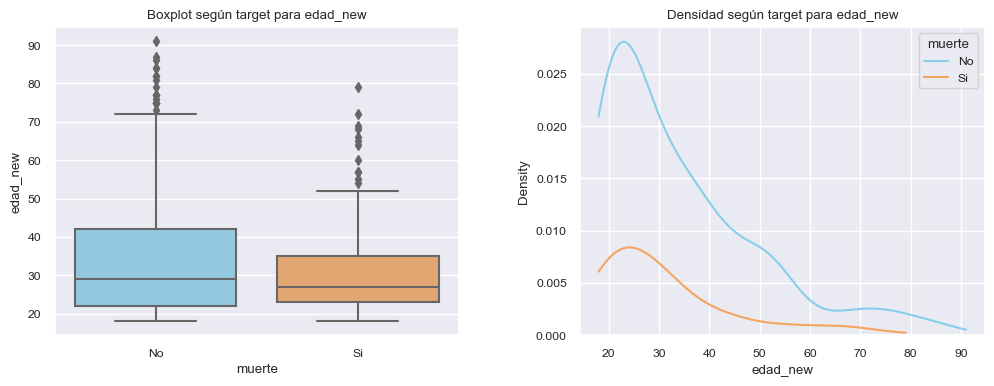

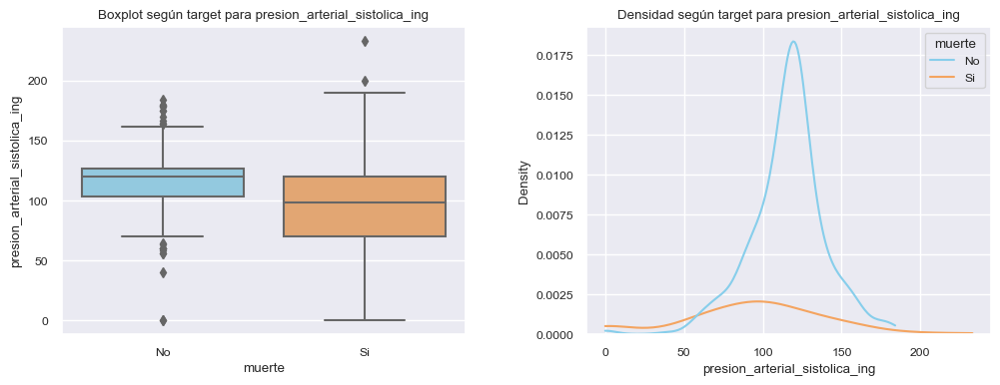

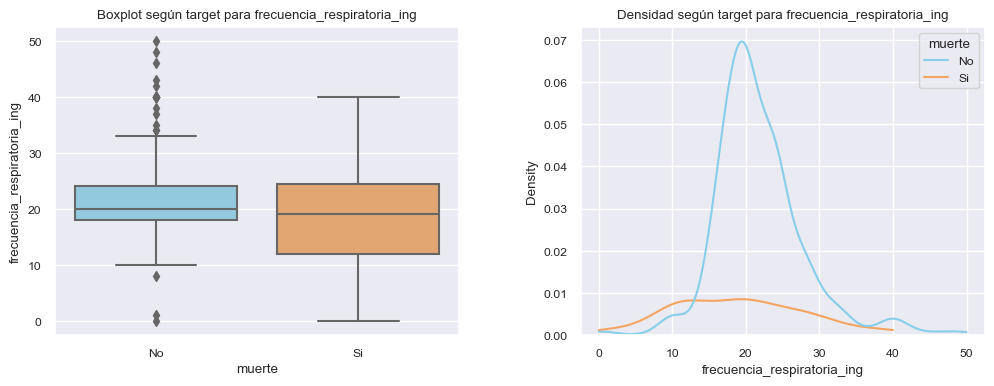

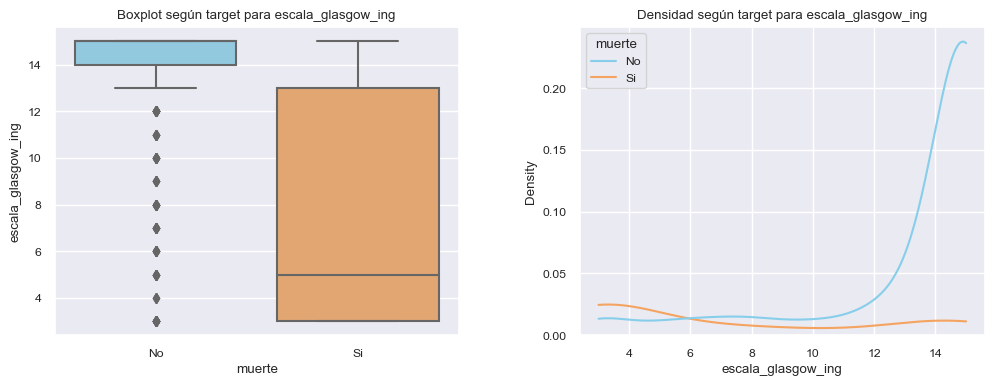

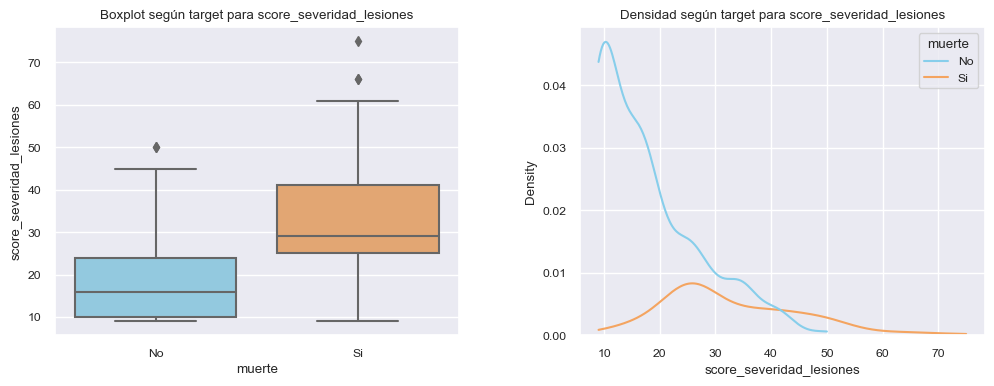

...

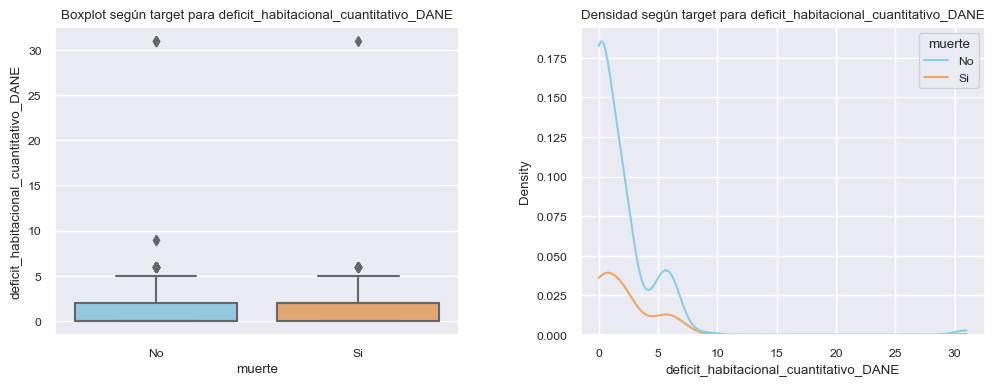

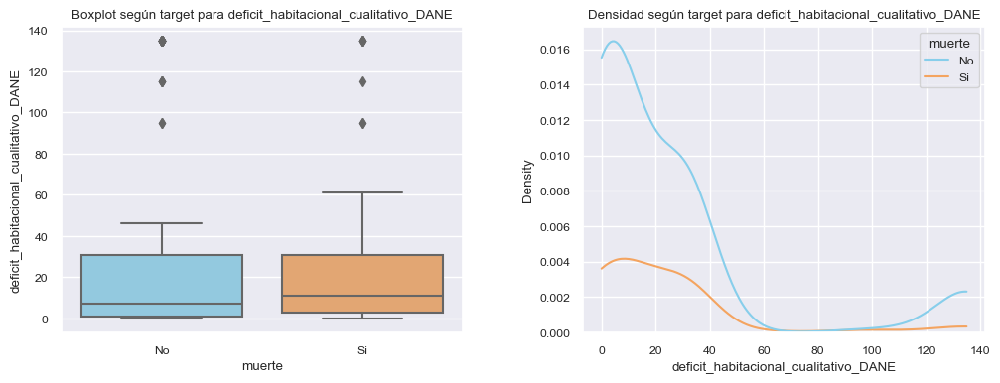

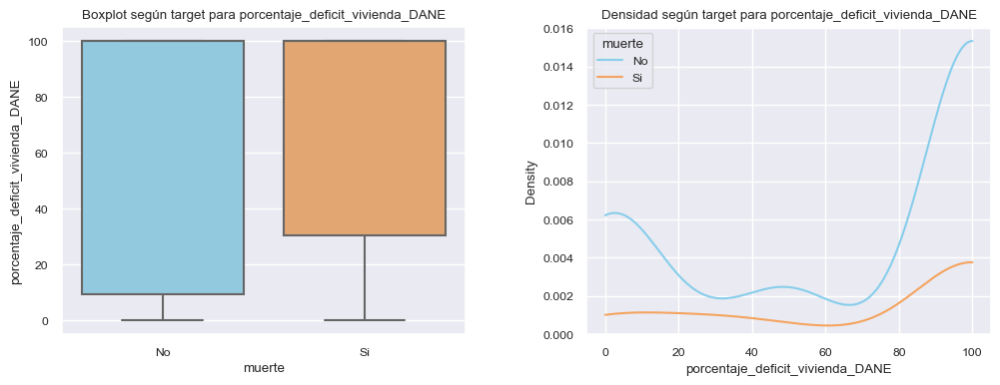

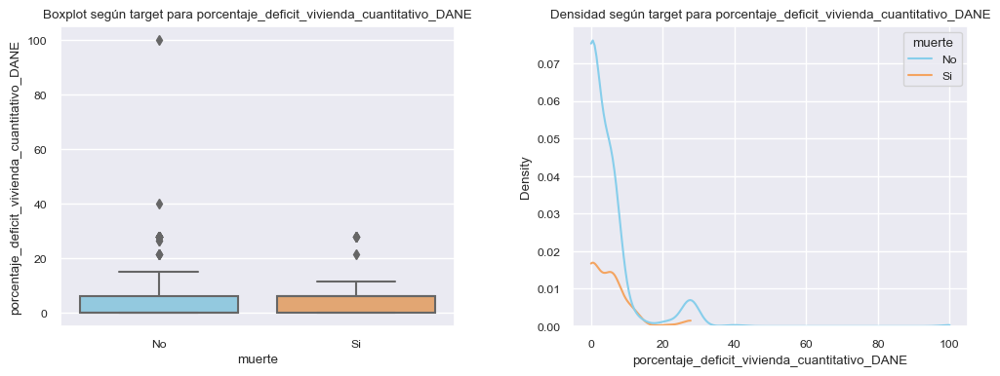

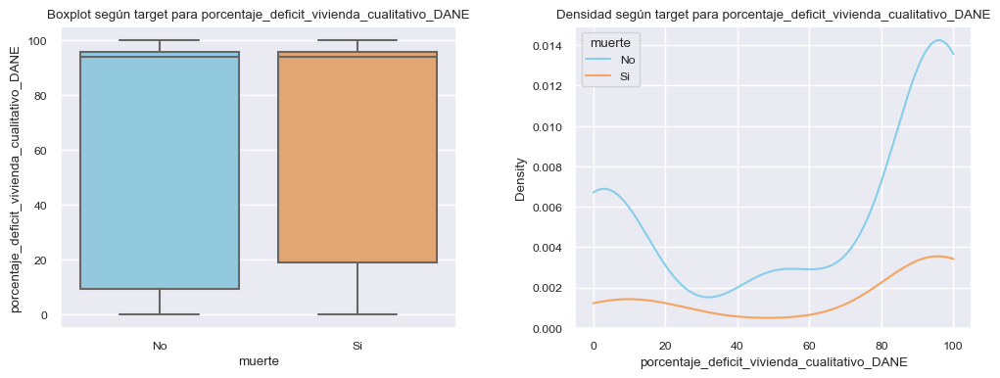

In [267]:
for feature in ['edad_new', 'presion_arterial_sistolica_ing', 'frecuencia_respiratoria_ing', 'escala_glasgow_ing',
    'score_severidad_lesiones', 'score_severidad_urgencias', 'score_severidad_urgencias_anatomico',
    'distance_center_ing(km)', 'distance_openrout_tx_center(m)', 'distance_cnuestra(km)', 'distance_fvl(km)',
    'distance_huv(km)', 'distance_openrout_cnuestra_tx(m)', 'distance_openrout_fvl_tx(m)', 'distance_openrout_huv_tx(m)',
    'distancia_retardo_min', 'indice_pobreza_multidimensional_DANE', 'viviendas_totales_manzana_DANE',
    'hogares_totales_manzana_DANE', 'habitaciones_habitantes_DANE', 'deficit_habitacional_cuantitativo_DANE',
    'deficit_habitacional_cualitativo_DANE', 'porcentaje_deficit_vivienda_DANE', 'porcentaje_deficit_vivienda_cuantitativo_DANE',
    'porcentaje_deficit_vivienda_cualitativo_DANE']:
    plot_numerical(feature, figsize=(12,4), df=df, variable_name=feature)

Basándose en los gráficos previamente analizados, se observó que los pacientes fallecidos tendían a ser más jóvenes, con una mediana de edad alrededor de los 27 años y una distribución concentrada cerca de los 30 años, contrastando con los no fallecidos cuya mediana era cerca de los 29 años y con una distribución más dispersa. Esta diferencia se apreció claramente en los gráficos de densidad, donde el pico de los fallecidos era pronunciado y centrado, mientras que el de los no fallecidos era más suave y desplazado hacia edades avanzadas. En cuanto a la presión arterial sistólica, los fallecidos presentaban una mediana más baja, alrededor de los 98 mmHg, indicando una peor condición inicial, en comparación con los no fallecidos que tenían una mediana cerca de los 120 mmHg.

Los no fallecidos tendían a tener una frecuencia más baja, alrededor de 19 respiraciones por minuto. La escala de Glasgow reveló que los fallecidos ingresaban con una conciencia gravemente alterada, con una mediana de aproximadamente 5, en marcado contraste con los no fallecidos, que mostraban una mediana cerca del máximo de la escala, 15, indicando que estaban mayormente alertas y orientados.

Respecto a la severidad de las lesiones, los fallecidos exhibían puntuaciones significativamente más altas con una mediana alrededor de 29, comparado con los no fallecidos cuya mediana era cerca de 16. Similarmente, el score de severidad en urgencias mostraba que los fallecidos tenían una mediana considerablemente más alta, reflejando que la gravedad de las lesiones era un factor crítico en la mortalidad.

En cuanto a la distancia al centro médico, los análisis no mostraron diferencias significativas en las medianas entre fallecidos y no fallecidos, aunque la distribución de los no fallecidos era ligeramente más amplia. Esto sugería que la distancia por sí sola no era un predictor fuerte de mortalidad, aunque la gestión del tiempo y la respuesta rápida eran cruciales en la atención de emergencias. Los análisis adicionales de la distancia desde diferentes puntos de traslado y el índice de pobreza multidimensional sugerían que condiciones socioeconómicas adversas, representadas por un mayor índice de pobreza, podrían estar asociadas con mayores tasas de mortalidad.

Finalmente, al evaluar variables como habitaciones por habitante y déficit habitacional, se observó que los fallecidos tendían a provenir de hogares con mayores carencias cualitativas, lo que podría reflejar condiciones de vida inferiores que influían en los resultados de salud tras un trauma. Este patrón se observó también en el déficit cuantitativo, aunque en menor medida.

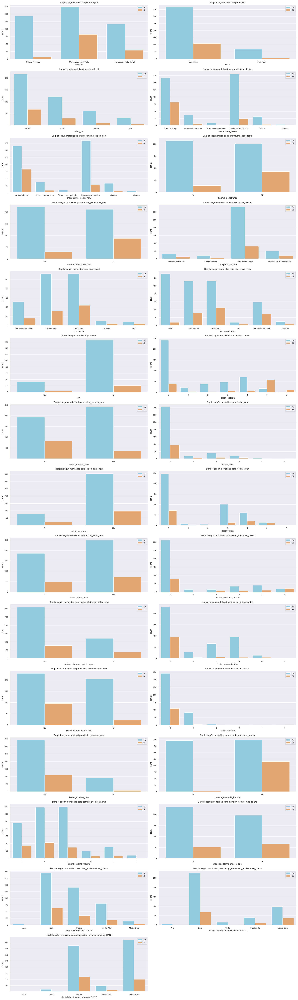

In [268]:
def plot_categorical(feature, df, variable_name, target='muerte', ax=None):

    palette = {'No': "skyblue", 'Si': "sandybrown"}
    
    sns.countplot(x=feature, data=df, ax=ax, hue=target, palette=palette)
    ax.set_title(f'Barplot según mortalidad para {variable_name}')
    ax.legend()


cols = 2 
rows = -(-len(categorical) // cols)

fig, axs = plt.subplots(rows, cols, figsize=(18, 60))

for i, feature in enumerate(categorical):
    row, col = divmod(i, cols)
    plot_categorical(feature, df, feature, ax=axs[row, col])

for j in range(i + 1, rows * cols):
    fig.delaxes(axs.flat[j])

plt.tight_layout()
plt.show()

El primer análisis mostró diferencias significativas en la frecuencia de mortalidad entre tres centros de atención: el Hospital Universitario del Valle y la Fundación Valle del Lili registraron más casos comparados con la Clínica Nuestra. Además, se observó una variabilidad notable en la mortalidad entre diferentes grupos etarios, destacándose índices elevados en jóvenes de 18 a 29 años y adultos de 30 a 44 años, en contraste con grupos de mayor edad.

Respecto a las diferencias de mortalidad por género, los hombres presentaron una mayor incidencia de mortalidad que las mujeres. Las lesiones por arma de fuego emergieron como la principal causa de mortalidad frente a otros mecanismos. Además, los pacientes con traumas penetrantes exhibieron tasas de mortalidad más altas, lo que refleja la gravedad de estas lesiones.

También se evidenció una disparidad significativa en la mortalidad según el tipo de aseguramiento médico, siendo más prevalente en los regímenes subsidiado y contributivo, y en tercer lugar los no asegurados. Los pacientes trasladados en ambulancias, tanto básicas como medicalizadas, tuvieron un menor número de casos de mortalidad en comparación con aquellos transportados por medios menos especializados, como vehículos particulares o por la fuerza pública, resaltando la importancia del traslado prehospitalario adecuado.

Finalmente, se destacó que los pacientes de niveles socioeconómicos bajos sufrieron mayor mortalidad, posiblemente debido a un acceso restringido a recursos de salud de calidad. Asimismo, aquellos que recibieron atención en centros más distantes mostraron mayor mortalidad, probablemente debido a retrasos en la administración de cuidados críticos, subrayando la necesidad de mejorar la accesibilidad y eficiencia de los servicios médicos en áreas remotas.

#### Estadística descriptiva espacial

Para el análisis de variables asociadas con información geográfica, como coordenadas, latitud y longitud, se generaron diversos mapas detallado de la ciudad de Cali y áreas adyacentes utilizando el software QGIS. Esta herramienta facilitó una representación precisa y detallada de las ubicaciones geográficas de interés. 

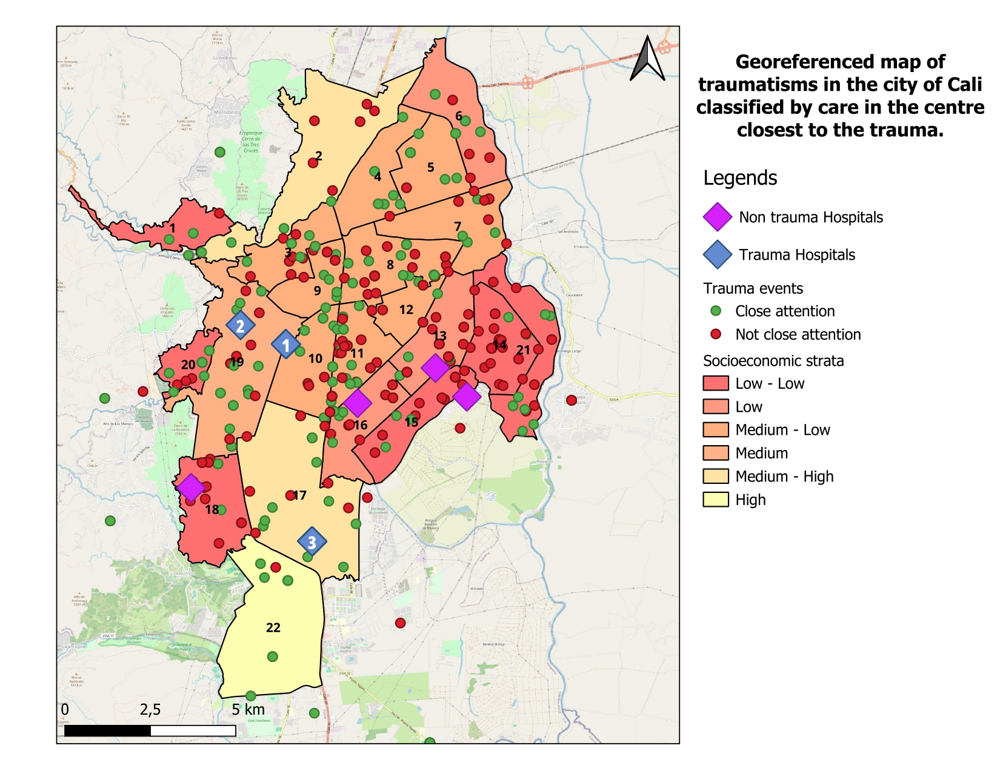

In [269]:
Image(filename='mapa1.jpg', width=1000, height=500)

In [76]:
df.to_excel('df_final.xlsx')

### Consulta con experto y selección de variables basada en el análisis exploratorio de datos

Se realizó un análisis univariado usando regresiones de Poisson con errores robustos en R para asociar cada variable independiente con el desenlace de interés, mortalidad, calculando los riesgos relativos (RR). 

La regresión de Poisson se prefirió sobre la logística por varias razones esenciales: primero, permite una interpretación directa de los Riesgos Relativos (RR), que son más intuitivos en contextos epidemiológicos, frente a los odds ratios de la logística que pueden ser ambiguos, especialmente en desenlaces frecuentes. Además, es ideal para modelar tasas de incidencia y eventos, ofreciendo estimaciones más estables y precisas. Por último, el uso de errores robustos ayuda a corregir la sobre-dispersión, asegurando estimaciones más confiables y robustas.


A continuación se presentan los resultados del análisis univariado mediante la regresión mencionada:

In [197]:
coef_modeloPoisson = pd.read_excel('modeloPoisson.xlsx')
coef_modeloPoisson

,explanatory,RR
0,edad_new,"0.99 (0.98-1.00, p=0.085)"
1,presion_arterial_sistolica_ing,"0.99 (0.98-0.99, p<0.001)"
2,frecuencia_respiratoria_ing,"0.95 (0.92-0.98, p=0.001)"
3,escala_glasgow_ing,"0.82 (0.80-0.85, p<0.001)"
4,score_severidad_lesiones_newSi,"0.88 (0.63-1.22, p=0.439)"
5,score_severidad_urgencias,"0.72 (0.68-0.75, p<0.001)"
6,score_severidad_urgencias_anatomico,"0.62 (0.58-0.66, p<0.001)"
7,distance_openrout_tx_center,"1.00 (1.00-1.00, p=0.284)"
8,distancia_retardo_min,"1.00 (1.00-1.00, p=0.206)"
9,indice_pobreza_multidimensional_DANE,"1.01 (1.00-1.02, p=0.102)"


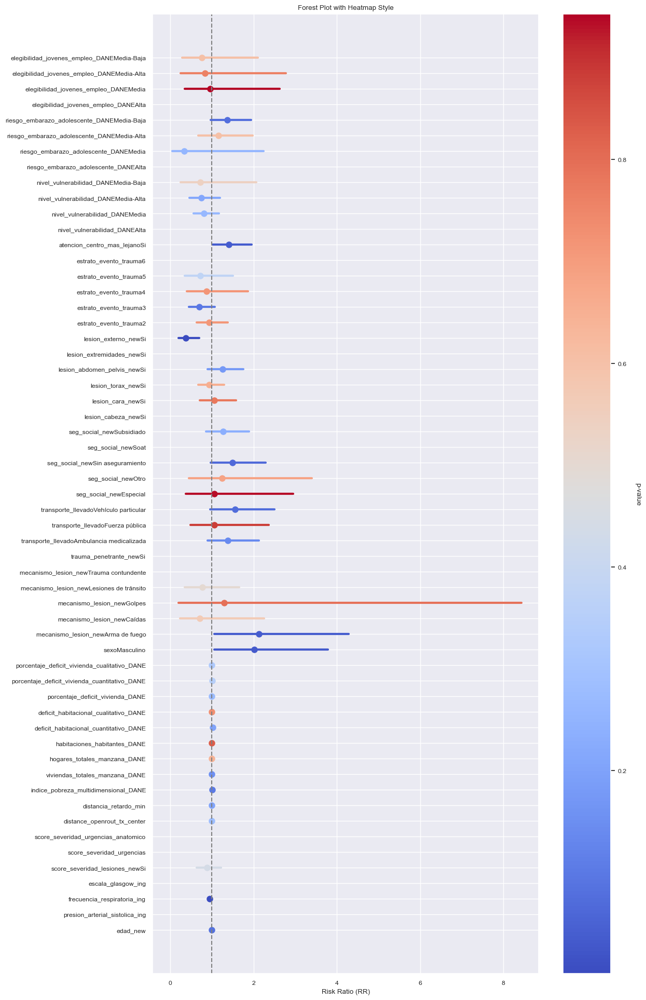

In [198]:

df_coef_modeloPoisson = coef_modeloPoisson[['explanatory', 'RR']].dropna().reset_index(drop=True)
df
def extract_values(row):
    rr_pattern = re.compile(r"(\d+\.\d+|\d+)")
    ci_pattern = re.compile(r"\((\d+\.\d+)-(\d+\.\d+)")
    p_pattern = re.compile(r"p=([<>=]*\d*\.\d+|\d+|\.\d+)")

    rr = rr_pattern.findall(row)[0]
    ci = ci_pattern.findall(row)
    p_value = p_pattern.findall(row)

    lower_ci, upper_ci = ci[0] if ci else (None, None)
    p_value = p_value[0] if p_value else None

    if p_value is not None:
        p_value = float(p_value.replace('p=', '').replace('<', '').replace('>', ''))

    return float(rr), float(lower_ci), float(upper_ci), p_value

df_coef_modeloPoisson[['RR', 'Lower_CI', 'Upper_CI', 'p_value']] = df_coef_modeloPoisson['RR'].apply(extract_values).tolist()
df_coef_modeloPoisson['original_order'] = range(len(df_coef_modeloPoisson))

plt.figure(figsize=(12, 24))

norm = plt.Normalize(df_coef_modeloPoisson['p_value'].dropna().min(), df_coef_modeloPoisson['p_value'].dropna().max())
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])

for i, row in df_coef_modeloPoisson.iterrows():
    plt.plot([row['Lower_CI'], row['Upper_CI']], [row['original_order'], row['original_order']], color=sm.to_rgba(row['p_value']) if row['p_value'] is not None else 'black', lw=3)
    plt.plot(row['RR'], row['original_order'], 'o', color=sm.to_rgba(row['p_value']) if row['p_value'] is not None else 'black', markersize=8)

plt.axvline(1, color='grey', linestyle='--')
plt.xlabel('Risk Ratio (RR)')
plt.title('Forest Plot with Heatmap Style')
plt.yticks(df_coef_modeloPoisson['original_order'], df_coef_modeloPoisson['explanatory'])
plt.grid(True)

cbar = plt.colorbar(sm, ax=plt.gca(), label='p-value')
cbar.set_label('p-value', rotation=270, labelpad=20)

# Guardar la figura en alta resolución
plt.savefig('riesgos_relativos.png', dpi=300, bbox_inches='tight')

plt.show()

El forest plot muestra los riesgos relativos (RR) de diversas variables, con líneas horizontales que indican los intervalos de confianza al 95% y puntos que representan los valores exactos de RR; el color de estos elementos refleja la significancia estadística según una barra de color adjunta. Entre los hallazgos destacados se incluyen riesgos relativos elevados para lesión en abdomen y pelvis (RR aproximadamente 10) y lesión en extremidades, ambos con una fuerte asociación con el desenlace de interés y alta significancia estadística (color rojo oscuro). Por otro lado, la Escala de Glasgow y lesiones en el tórax presentan RRs bajos, sugiriendo menor probabilidad de desenlace de interés, con el color azul indicando significancia estadística. Además, se observa una variabilidad notable en los intervalos de confianza para lesiones en la cabeza. También se analiza el impacto de factores socioeconómicos como el nivel de vulnerabilidad y la seguridad social, mostrando efectos más moderados. Finalmente, el transporte por ambulancia medicalizada está asociado con mejores resultados (RR más bajo), mientras que ciertos mecanismos de lesión como los impactos por arma de fuego demuestran ser factores significativos en la probabilidad del desenlace de interés.

En el análisis univariado, obtenemos información valiosa sobre la asociación entre cada variable independiente y el desenlace de interés, sirviendo como insumo crucial para identificar factores potencialmente relevantes para la mortalidad. Sin embargo, es importante considerar que estos análisis evalúan cada factor de manera aislada. Al incluir simultáneamente múltiples factores en un análisis multivariado, se puede captar mejor la complejidad de sus interacciones y efectos combinados, proporcionando una comprensión más completa y precisa de los determinantes de la mortalidad. Por esta razón, a continuación presentamos las variables candidatas para la predicción de mortalidad, seleccionadas basándonos en los resultados del modelo anterior y en la opinión de expertos (médico).

A continuación, se clasificaron las variables en listas según su tipo: numéricas y categóricas.

In [79]:
df_selecc = df[['lesion_cabeza_new',
              'lesion_cara_new',
              'lesion_torax_new', 
              'lesion_abdomen_pelvis_new',
              'lesion_extremidades_new',
              'lesion_externo_new']]

def determinar_si_filas(row):
    return 'Si' if (row == 'Si').sum() >= 2 else 'No'

df_selecc['score_severidad_lesiones_new'] = df_selecc.apply(determinar_si_filas, axis=1) 
nuevo_df = df_selecc[['score_severidad_lesiones_new']]            

In [80]:
df = pd.concat([df, nuevo_df.reset_index(drop=True)], axis=1)

In [81]:
df['score_severidad_lesiones_new'].value_counts()

Si    374
No    179
Name: score_severidad_lesiones_new, dtype: int64

In [196]:
df.to_excel('df_final.xlsx')

In [82]:
numeric = ['edad_new', 
            'presion_arterial_sistolica_ing',
            'frecuencia_respiratoria_ing',
            'escala_glasgow_ing',
            #'score_severidad_lesiones',
            'score_severidad_urgencias',
            'score_severidad_urgencias_anatomico',
            #'distance_center_ing(km)',
            'distance_openrout_tx_center(m)',
            #'distance_cnuestra(km)',
            #'distance_fvl(km)',
            #'distance_huv(km)',
            #'distance_openrout_cnuestra_tx(m)',
            #'distance_openrout_fvl_tx(m)',
            #'distance_openrout_huv_tx(m)',
            'distancia_retardo_min',
            'indice_pobreza_multidimensional_DANE',
            'viviendas_totales_manzana_DANE',
            'hogares_totales_manzana_DANE',
            'habitaciones_habitantes_DANE',
            'deficit_habitacional_cuantitativo_DANE',
            'deficit_habitacional_cualitativo_DANE',
            'porcentaje_deficit_vivienda_DANE',
            'porcentaje_deficit_vivienda_cuantitativo_DANE',
            'porcentaje_deficit_vivienda_cualitativo_DANE']
            #'prob_sobrevida_ing']

categorica = ['muerte',
              'sexo', 
              'mecanismo_lesion_new', 
              'trauma_penetrante_new', 
              #'transporte_llevado', 
              'seg_social_new', 
              'lesion_cabeza_new',
              'lesion_cara_new',
              'lesion_torax_new', 
              'lesion_abdomen_pelvis_new',
              'lesion_extremidades_new',
              'lesion_externo_new',
              'estrato_evento_trauma',
              'atencion_centro_mas_lejano',
              'nivel_vulnerabilidad_DANE',
              'riesgo_embarazo_adolescente_DANE',
              'elegibilidad_jovenes_empleo_DANE',
              'score_severidad_lesiones_new'] #nueva

In [83]:
a = df[['muerte','sexo', 
              'mecanismo_lesion_new', 
              'trauma_penetrante_new', 
              #'transporte_llevado', 
              'seg_social_new', 
              'lesion_cabeza_new',
              'lesion_cara_new',
              'lesion_torax_new', 
              'lesion_abdomen_pelvis_new',
              'lesion_extremidades_new',
              'lesion_externo_new',
              'estrato_evento_trauma',
              'atencion_centro_mas_lejano',
              'nivel_vulnerabilidad_DANE',
              'riesgo_embarazo_adolescente_DANE',
              'elegibilidad_jovenes_empleo_DANE',
              'score_severidad_lesiones_new']]

missing_data = a.stb.missing()
missing_columns = missing_data[missing_data['missing'] > 0] 
print(missing_columns)


b = df[['edad_new', 
            'presion_arterial_sistolica_ing',
            'frecuencia_respiratoria_ing',
            'escala_glasgow_ing',
            #'score_severidad_lesiones',
            'score_severidad_urgencias',
            'score_severidad_urgencias_anatomico',
            'distance_center_ing(km)',
            'distance_openrout_tx_center(m)',
            'distance_cnuestra(km)',
            'distance_fvl(km)',
            'distance_huv(km)',
            'distance_openrout_cnuestra_tx(m)',
            'distance_openrout_fvl_tx(m)',
            'distance_openrout_huv_tx(m)',
            'distancia_retardo_min',
            'indice_pobreza_multidimensional_DANE',
            'viviendas_totales_manzana_DANE',
            'hogares_totales_manzana_DANE',
            'habitaciones_habitantes_DANE',
            'deficit_habitacional_cuantitativo_DANE',
            'deficit_habitacional_cualitativo_DANE',
            'porcentaje_deficit_vivienda_DANE',
            'porcentaje_deficit_vivienda_cuantitativo_DANE',
            'porcentaje_deficit_vivienda_cualitativo_DANE',
            'prob_sobrevida_ing']]

missing_data = b.stb.missing()
missing_columns = missing_data[missing_data['missing'] > 0] 
print(missing_columns)

Empty DataFrame
Columns: [missing, total, percent]
Index: []
                                     missing  total  percent
edad_new                                   4    553     0.72
prob_sobrevida_ing                         4    553     0.72
score_severidad_urgencias                  1    553     0.18
score_severidad_urgencias_anatomico        1    553     0.18
escala_glasgow_ing                         1    553     0.18


<div style="
    background-color: lightskyblue; /* Cambiar el color de fondo a verde */
    color: black; /* Mantener el color del texto en negro */
    display: fill;
    border-radius: 4px;
    font-size: 100%;
    font-family: cursive;
    letter-spacing: 2px;
    font-family: verdana; /* Mantener la fuente del texto en verdana */
">
    <h2 style="text-align: center;">Feature engineering</h2>
</div>

El siguiente código define clases que realizan tareas específicas de procesamiento y transformación de los datos.

In [84]:
class ImputadorPersonalizado:
    def __init__(self, type_imputer,strategy_type,knn_imputer_k):

        self.columnas = ['edad_new', 'escala_glasgow_ing', 'score_severidad_urgencias', 'score_severidad_urgencias_anatomico']
        strategy_type = "median" if strategy_type >= 0.5 else "mean"
        if type_imputer >= 0.5:
            self.imputer = SimpleImputer(strategy=strategy_type)
        else:
            self.imputer = KNNImputer(n_neighbors=int(knn_imputer_k))

    def fit(self, data, y=None):
        
        return self
    
    def transform(self, data, y=None):
        self.imputer.fit(data[self.columnas])
        data[self.columnas] = self.imputer.transform(data[self.columnas])
        return data
    

class Variance_Treshold(BaseEstimator, TransformerMixin):
    def __init__(self, threshold):
        self.threshold = threshold
        self.variance = VarianceThreshold(threshold=self.threshold)
        self.columns = numeric

    def fit(self, data, y=None):
        return self
    
    def transform(self, data, y=None):
        fitted = self.variance.fit(data)
        deleted = fitted.get_support()
        endcols = fitted.get_feature_names_out(input_features= self.columns )
        eliminadas = []
        for i in self.columns:
            if i in endcols:
                pass
            else:
                eliminadas.append(i)
        return endcols 

class ScalerTransformer(BaseEstimator, TransformerMixin):
    def __init__(self,threshold):
        self.numeric_cols = numeric
        self.threshold = threshold
        self.variance = Variance_Treshold(self.threshold)
        self.scaler = StandardScaler()

    def fit(self, data, y=None):
        self.variance.fit(data.loc[:,self.numeric_cols])
        
        return self
    
    def transform(self, data, y=None):
        cols = list(self.variance.fit_transform(data[self.numeric_cols]))
        self.scaler.fit(data.loc[:,cols])
        X_transformed = data.copy()
        X_num_std = self.scaler.transform(X_transformed.loc[:,cols])
        X_transformed.loc[:,cols] = X_num_std
        return [X_transformed,cols]
  
class PCA_Num:
    def __init__(self,num_comp):
        self.columns = numeric
        self.num_comp = num_comp

    def fit(self, data, y=None):
        pca_init = PCA()
        self.pcafitted = pca_init.fit(data[0][data[1]])
        return self
    
    def transform(self,data,y=None):
        data_pca = self.pcafitted.transform(data[0][data[1]])
        data_pca = pd.DataFrame(data_pca, index=data[0].index)
        data_pca.columns= [f"PCA{i}" for i in range(0,len(data[1]))]
        columnspca = data_pca.columns[:self.num_comp]
        data_transform = pd.concat([data[0], data_pca], axis=1)
        return [data_transform,data[1],columnspca]

A continuación, se ilustra el proceso de creación de variables ficticias mediante la codificación one-hot encoding, transformando las variables categóricas en un conjunto de variables binarias. Este enfoque es esencial para el análisis con técnicas de aprendizaje automático. Para las variables ordinales, se utilizará la codificación ordinal (ordinal encoder), asignando un valor numérico que mantenga el orden de las categorías.

In [85]:
class Label_gen:
    def __init__(self):
        self.categoricals =  ['sexo', 
                            'mecanismo_lesion_new', 
                            'trauma_penetrante_new', 
                            'seg_social_new', 
                            'lesion_cabeza_new',
                            'lesion_cara_new',
                            'lesion_torax_new', 
                            'lesion_abdomen_pelvis_new',
                            'lesion_extremidades_new',
                            'lesion_externo_new',
                            'estrato_evento_trauma',
                            'atencion_centro_mas_lejano',
                            'nivel_vulnerabilidad_DANE',
                            'riesgo_embarazo_adolescente_DANE',
                            'elegibilidad_jovenes_empleo_DANE',
                            'score_severidad_lesiones_new']
        self.expert_select = ['sexo', 
                            'mecanismo_lesion_new', 
                            'trauma_penetrante_new', 
                            'seg_social_new', 
                            'lesion_cabeza_new',
                            'lesion_cara_new',
                            'lesion_torax_new', 
                            'lesion_abdomen_pelvis_new',
                            'lesion_extremidades_new',
                            'lesion_externo_new',
                            'estrato_evento_trauma',
                            'atencion_centro_mas_lejano',
                            'nivel_vulnerabilidad_DANE',
                            'riesgo_embarazo_adolescente_DANE',
                            'elegibilidad_jovenes_empleo_DANE',
                            'score_severidad_lesiones_new']
       
        self.ordinalencoder = ['estrato_evento_trauma',
                            'nivel_vulnerabilidad_DANE',
                            'riesgo_embarazo_adolescente_DANE',
                            'elegibilidad_jovenes_empleo_DANE']
        self.complete = ['sexo', 
                            'mecanismo_lesion_new', 
                            'trauma_penetrante_new', 
                            'seg_social_new', 
                            'lesion_cabeza_new',
                            'lesion_cara_new',
                            'lesion_torax_new', 
                            'lesion_abdomen_pelvis_new',
                            'lesion_extremidades_new',
                            'lesion_externo_new',
                            'estrato_evento_trauma',
                            'atencion_centro_mas_lejano',
                            'nivel_vulnerabilidad_DANE',
                            'riesgo_embarazo_adolescente_DANE',
                            'elegibilidad_jovenes_empleo_DANE',
                            'score_severidad_lesiones_new']

        self.mapeo = {'sexo': ['Masculino', 'Femenino'],
                      'estrato_evento_trauma' : [0, 1, 2, 3, 4, 5, 6],
                      'nivel_vulnerabilidad_DANE' : ['Baja','Media-Baja', 'Media', 'Media-Alta', 'Alta'],
                      'riesgo_embarazo_adolescente_DANE' :  ['Baja','Media-Baja', 'Media', 'Media-Alta', 'Alta'],
                      'elegibilidad_jovenes_empleo_DANE': ['Media', 'Media-Baja', 'Media-Alta', 'Baja', 'Alta']
                      }

    def fit(self, data, y=None):
        self.label = LabelEncoder()
        return self
    
    def transform(self, data, y=None):
        ## ORDINAL ENCODER
        categories = [self.mapeo[col] for col in self.ordinalencoder]
        ordinalencoder = OrdinalEncoder(categories=categories).fit(data[self.ordinalencoder])
        encoded_data = ordinalencoder.transform(data[self.ordinalencoder])
        columns = ordinalencoder.get_feature_names_out(self.ordinalencoder)
        dummies = pd.DataFrame(encoded_data, columns=columns, index=data.index).astype(int)
        data_trans = data
        columns_label = ['sexo', 
                            'lesion_cabeza_new',
                            'lesion_cara_new',
                            'lesion_torax_new', 
                            'lesion_abdomen_pelvis_new',
                            'lesion_extremidades_new',
                            'lesion_externo_new',
                            'mecanismo_lesion_new', 
                            'trauma_penetrante_new', 
                            'seg_social_new',
                            'atencion_centro_mas_lejano',
                            'score_severidad_lesiones_new']
        for i in self.ordinalencoder:
            data_trans[i] = dummies[i]

        for i in columns_label:
            self.label.fit(data_trans[i])
            data_trans[i] = self.label.transform(data_trans[i])
        return data_trans[self.complete]
    


class TreatmentCategorical:
    def __init__(self):
      self.categorical =  categorical
      self.onehot = ['sexo','mecanismo_lesion_new', 
                            'trauma_penetrante_new', 
                            'seg_social_new', 'atencion_centro_mas_lejano',
                            'lesion_cabeza_new',
                            'lesion_cara_new',
                            'lesion_torax_new', 
                            'lesion_abdomen_pelvis_new',
                            'lesion_extremidades_new',
                            'lesion_externo_new',
                            'score_severidad_lesiones_new']
      self.ordinal = ['estrato_evento_trauma',
                            'nivel_vulnerabilidad_DANE',
                            'riesgo_embarazo_adolescente_DANE',
                            'elegibilidad_jovenes_empleo_DANE']

    def fit(self, data, y=None):
        return self
    
    def transform(self, data, y=None):
        ## ONEHOTENCODER
        columns_onhot = data.columns.drop(self.ordinal)
        ordinal = data[self.ordinal]
        self.oneencoder = OneHotEncoder(drop='first')
        self.oneencoder.fit(data[self.onehot])
        enc_data = self.oneencoder.transform(data[self.onehot])
        columns = self.oneencoder.get_feature_names_out(self.onehot)
        data_realized = pd.DataFrame(enc_data.toarray(), columns=columns, index=data.index).astype(int)
        data_trans = pd.concat([data, data_realized], axis=1)
        data_trans = data_trans.drop(columns=self.onehot)
        return data_trans

Como un paso adicional en nuestro Pipeline, incorporaremos una columna correspondiente al Análisis Discriminante Lineal (LDA), que nos ofrece un eje optimizando la separabilidad entre dos clases. Además, en el Pipeline de las variables numéricas, se introduce el método de selección de variables mediante la regresión logística regularizada Lasso, una técnica para identificar las variables más relevantes.

In [86]:
class LinearDiscrminantTransformer():
    def __init__(self) -> None:
        pass

    def fit(self, data, y=None):
        self.lda = LinearDiscriminantAnalysis()
        self.lda.fit(data[0][data[1]],y)
        return self
    
    def transform(self,data,y=None):
        lda_results = pd.DataFrame(self.lda.transform(data[0][data[1]]), columns=['LDA'], index=data[0].index)
        data_transform = pd.concat([data[0], lda_results], axis=1)
        return data_transform

import re
class Lasso_Selector(BaseEstimator, TransformerMixin):
    def __init__(self, alpha):
        self.alpha = alpha

    def fit(self, data, y=None):
        self.L1 = SelectFromModel(LogisticRegression(C=self.alpha, 
                                                     penalty='l1', 
                                                     solver='liblinear', 
                                                     class_weight='balanced'))
        self.columns = list(data.columns)
        columnas_pca = [col for col in self.columns if re.search(r'PCA\d+', col)]
        columnas_pca.append("LDA")
        self.columns = columnas_pca
        self.L1.fit(data[columnas_pca], y)
        return self

    def transform(self, data, y=None):
        columnas_pca = [col for col in self.columns if re.search(r'PCA\d+', col)]
        columnas_pca.append("LDA")
        X_transformed = data[columnas_pca]
        selected_feat = X_transformed.columns[self.L1.get_support()]
        X_transformed = X_transformed[selected_feat]
        eliminated_features = [col for col in self.columns if col not in selected_feat]
        X_transformed = pd.DataFrame(X_transformed)
        return X_transformed

 Se separan las columnas en características (features) y la variable objetivo (muerte) para el modelo de aprendizaje automático; 'features_cols' almacena los nombres de las columnas de las características, excluyendo la columna 'muerte'. Finalmente, el código divide el conjunto de datos en 'X', que contiene los valores de las características, y 'y', que contiene los valores de la variable objetivo:

In [87]:
objective_col = "muerte"
features_cols = list(df.columns)
if objective_col in features_cols:
  features_cols.remove(objective_col)

X = df.loc[:,features_cols]
y = df.loc[:,[objective_col]]  

La dimensión del conjunto de datos, que se había determinado previamente, se verifica nuevamente para confirmar su estructura en términos de filas y columnas:

In [88]:
X.shape

(553, 79)

In [89]:
y["muerte"] = y["muerte"].replace("No",0).replace("Si",1)
y["muerte"] = y["muerte"].astype(int)

#### División del dataset

La línea de código siguiente segmenta el conjunto de datos en dos partes: entrenamiento y evaluación. Esta división asegura que la proporción de la variable objetivo se mantenga consistente en ambos conjuntos, reflejando la distribución en el conjunto de datos original. La reproducibilidad de la división se garantiza mediante el uso de una semilla aleatoria específica. Concretamente, el 80% de los datos se dedica al entrenamiento (X_train), mientras que el 20% restante se reserva para el conjunto de validación.

In [90]:
X_train, X_evaluation, y_train, y_evaluation = train_test_split(X, y, test_size=0.30, random_state=123, stratify=df.loc[:,[objective_col]])

In [91]:
X_train.shape

(387, 79)

In [92]:
X_evaluation.shape

(166, 79)

In [93]:
y_train.shape

(387, 1)

In [94]:
y_evaluation.shape

(166, 1)

Se ilustra el procedimiento ACP, mediante el cual se integrará un número específico de componentes al conjunto de datos:

In [95]:
num_comp = len(numeric)
type_imputer = 0
strategy = 0.9
knn_k = 7
pipe = Pipeline(steps=(
    ("SingleImputer_Mediana",ImputadorPersonalizado(type_imputer,strategy,knn_k)),
    ("Estandarización", ScalerTransformer(0)) ))    
    

X_transformed_train = pipe.fit_transform(X_train,y_train)
X_transformed_train = X_transformed_train[0]
X_transformed_train.head()

,id_unico,registro,hospital,fecha_ing_hosp,hora_ing_hosp,sexo,fecha_nacimiento,fecha_trauma,hora_trauma,edad,mecanismo_lesion,trauma_penetrante,sitio_evento_trauma,transporte_llevado,seg_social,soat,presion_arterial_sistolica_ing,frecuencia_respiratoria_ing,escala_glasgow_ing,lesion_cabeza,lesion_cara,lesion_torax,lesion_abdomen_pelvis,lesion_extremidades,lesion_externo,score_severidad_lesiones,muerte_asociada_trauma,fecha_egreso,hora_egreso,latitud_evento,longitud_evento,latitud_centro,longitud_centro,comuna_evento_trauma,estrato_evento_trauma,pas_tris,pcg_triss,fr_triss,score_severidad_urgencias,score_severidad_urgencias_anatomico,edad_triss,b_init,prob_sobrevida_ing,prob_muerte_ing,distance_center_ing(km),distance_openrout_tx_center(m),distance_cnuestra(km),distance_fvl(km),distance_huv(km),distance_openrout_cnuestra_tx(m),distance_openrout_fvl_tx(m),distance_openrout_huv_tx(m),distancia_retardo_min,atencion_centro_mas_lejano,nivel_vulnerabilidad_DANE,indice_pobreza_multidimensional_DANE,riesgo_embarazo_adolescente_DANE,elegibilidad_jovenes_empleo_DANE,viviendas_totales_manzana_DANE,hogares_totales_manzana_DANE,habitaciones_habitantes_DANE,deficit_habitacional_cuantitativo_DANE,deficit_habitacional_cualitativo_DANE,porcentaje_deficit_vivienda_DANE,porcentaje_deficit_vivienda_cuantitativo_DANE,porcentaje_deficit_vivienda_cualitativo_DANE,mes_trauma,edad_new,edad_cat,lesion_cabeza_new,lesion_cara_new,lesion_torax_new,lesion_abdomen_pelvis_new,lesion_extremidades_new,lesion_externo_new,seg_social_new,trauma_penetrante_new,mecanismo_lesion_new,score_severidad_lesiones_new
517,518,N084,Fundación Valle del Lili,2012-08-23,11,Femenino,1961-03-24,2012-08-23,10.00,51.00,Caídas,No,jamundi,Ambulancia básica,Sin aseguramiento,NaN,0.33,1.77,-1.65,5,0,3,0,0,0,34.00,NaN,2012-09-15 00:00:00,18:28:00,3.26,-76.54,3.37,-76.53,Fuera de Cali,2,4,1.00,3,-1.42,-1.73,0.00,0.24,0.56,0.25,10.23,0.12,18.18,10.23,18.73,"21,308.00","12,491.00","22,892.00",-0.09,No,Media-Alta,-0.83,Baja,Media,-0.31,-0.67,-0.66,-0.54,-0.64,-0.46,-0.63,-0.38,8.00,1.11,45-59,Si,No,Si,No,No,No,Sin aseguramiento,No,Caídas,Si
260,261,134,Fundación Valle del Lili,2012-03-03,13,Masculino,1957-09-03,2012-03-03,12.00,54.00,Lesiones de tránsito,No,calle 18 carrera 130,Ambulancia básica,Otro,Si,0.69,-0.20,0.65,1,3,0,0,0,0,10.00,Si,2012-03-04 00:00:00,06:00:00,3.33,-76.53,3.37,-76.53,Comuna 17,5,4,4.00,4,0.65,0.63,0.00,5.47,1.00,0.00,2.76,-0.17,10.84,5.04,11.58,"13,066.00","7,057.00","15,864.00",-0.09,No,Baja,2.47,Baja,Media,3.43,1.39,-0.55,-0.54,-0.53,-1.57,-0.63,-1.53,3.00,1.31,45-59,Si,Si,No,No,No,No,Otro,No,Lesiones de tránsito,Si
486,487,N010,Fundación Valle del Lili,2012-06-18,4,Masculino,1977-08-06,2012-08-18,4.00,34.00,Arma de fuego,Si,jamundi,Ambulancia medicalizada,Sin aseguramiento,NaN,-1.79,0.65,0.65,0,0,3,5,0,0,34.00,No,2012-07-03 00:00:00,09:53:00,3.26,-76.54,3.37,-76.53,Fuera de Cali,2,2,4.00,4,-0.38,0.25,0.00,2.54,0.93,0.07,10.23,0.12,18.18,10.23,18.73,"21,308.00","12,491.00","22,892.00",-0.09,No,Media-Alta,-0.83,Baja,Media,-0.31,-0.67,-0.66,-0.54,-0.64,-0.46,-0.63,-0.38,8.00,0.08,30-44,No,No,Si,Si,No,No,Sin aseguramiento,Si,Arma de fuego,Si
306,307,171,Universitario del Valle,2013-01-13,23,Masculino,1989-11-11,2013-01-13,23.00,23.00,Arma cortopunzante,Si,carrera 69 calle 1c,Ambulancia básica,NaN,NaN,1.21,0.93,0.65,0,3,0,0,0,0,9.00,Si,2013-01-17 00:00:00,12:00:00,3.39,-76.55,3.43,-76.55,Comuna 18,1,4,4.00,4,0.65,0.63,0.00,6.99,1.00,0.00,4.13,-0.20,4.14,3.81,4.13,"5,012.00","6,261.00","6,235.00",-0.04,Si,Baja,0.12,Baja,Media-Baja,3.43,1.39,-0.55,-0.54,-0.53,-1.57,-0.63,-1.53,1.00,-0.70,18-29,No,Si,No,No,No,No,Sin aseguramiento,Si,Arma cortopunzante,No
481,482,N002,Fundación Valle del Lili,2012-06-03,12,Masculino,1991-11-21,2012-06-03,11.00,27.00,Arma de fuego,Si,la buitrera,Ambulancia básica,Especial,NaN,0.59,-0.20,0.65,3,2,0,0,0,2,17.00,No,2012-06-09 00:00:00,12:00:00,3.38,-76.58,3.37,-76.53,Área Rural de Cali,1,4,4.00,4,0.65,0.63,0.00,5.78,1.00,0.00,7.83,-0.05,7.29,

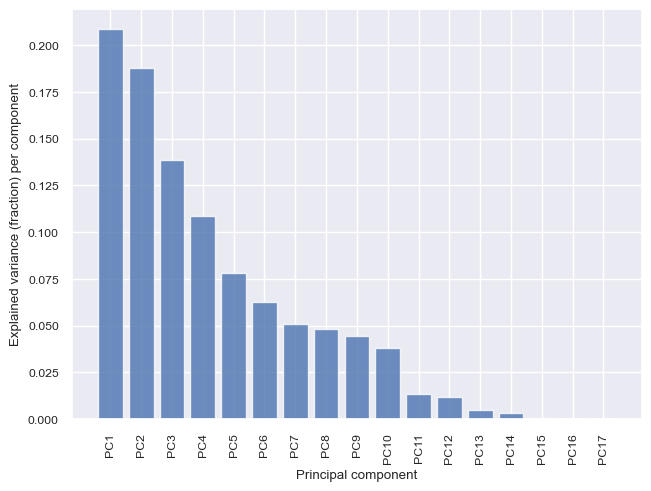

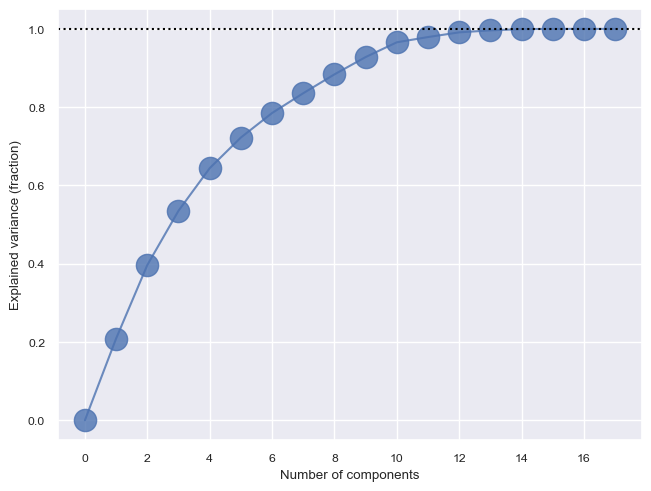

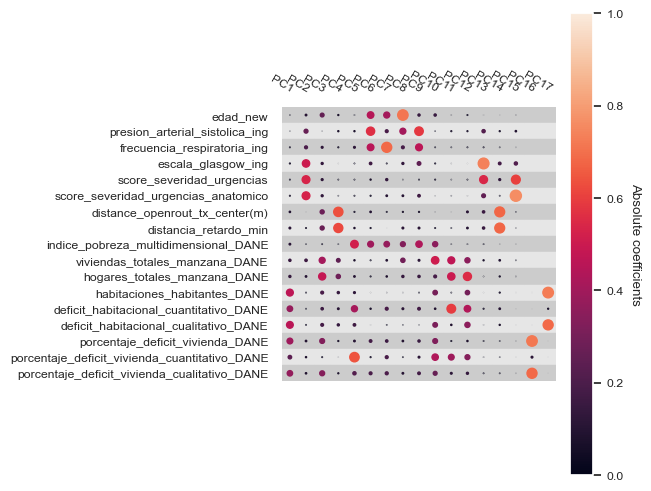

In [96]:
pca = PCA()
df_proyectado = pca.fit_transform(X_transformed_train[numeric])

pca_explained_variance_bar(pca, alpha=0.8)
plt.show()

pca_explained_variance(pca, marker='o', markersize=16, alpha=0.8)
plt.show()

kwargs = {'heatmap': {'vmin': -1,'vmax': 1,}}
kwargs['heatmap']['vmin'] = 0
pca_loadings_map(
    pca,
    X_transformed_train[numeric],
    bubble=True,
    annotate=False,
    plot_style='absolute',
    **kwargs)
plt.show()

Finalmente, se condensan los pasos previamente descritos y se construyen los transformadores de manera separada para las variables numéricas y categóricas, asegurando así un tratamiento específico y adecuado para cada tipo de variable dentro del Pipeline.

In [97]:
type_imputer = 1
strategy = 0.5
knn_k= 5
num_comp = 5
alpha = 0.3

categorical = ['sexo', 
                'mecanismo_lesion_new', 
                'trauma_penetrante_new', 
                 'seg_social_new', 
                 'lesion_cabeza_new',
                 'lesion_cara_new',
                 'lesion_torax_new', 
                 'lesion_abdomen_pelvis_new',
                 'lesion_extremidades_new',
                 'lesion_externo_new',
                 'estrato_evento_trauma',
                 'atencion_centro_mas_lejano',
                 'nivel_vulnerabilidad_DANE',
                'riesgo_embarazo_adolescente_DANE',
                'elegibilidad_jovenes_empleo_DANE',
                'score_severidad_lesiones_new']

gen_transform = Pipeline(steps=[
    ("SingleImputer_Mediana",ImputadorPersonalizado(type_imputer,strategy,knn_k)),
    ])

numeric_transform = Pipeline(steps=[
    ("Estandarización", ScalerTransformer(0)),
    ("PCA", PCA_Num(num_comp)),
    ("LDA", LinearDiscrminantTransformer()),
    ("Regularización L1", Lasso_Selector(alpha))

    ]) 

categorical_transform = Pipeline(steps=[
    ("Label_Encoder", Label_gen()),
    ("Categorical_encoding",TreatmentCategorical())
    ])  

Pre_X = Pipeline(steps=[
    ("General_Edit",gen_transform),
    ("Columns Transform",ColumnTransformer(transformers=[
        ("Numerical Transform", numeric_transform,numeric),
        ("Categorical Transform", categorical_transform,categorical)])),
                        ])

In [98]:
Pre_X.fit(X_train,y_train)

Pipeline(steps=[('General_Edit',
                 Pipeline(steps=[('SingleImputer_Mediana',
                                  <__main__.ImputadorPersonalizado object at 0x32fefbdf0>)])),
                ('Columns Transform',
                 ColumnTransformer(transformers=[('Numerical Transform',
                                                  Pipeline(steps=[('Estandarización',
                                                                   ScalerTransformer(threshold=0)),
                                                                  ('PCA',
                                                                   <__main__.PCA_Num object at 0x32fdac1f0>),
                                                                  ('LDA',
                                                                   <__main__.LinearDiscrminan...
                                                   'trauma_penetrante_new',
                                                   'seg_social_new',
                                                   'lesion_cabeza_new',
                                                   'lesion_cara_new',
                                                   'lesion_torax_new',
                                                   'lesion_abdomen_pelvis_new',
                                                   'lesion_extremidades_new',
                                                   'lesion_externo_new',
                                                   'estrato_evento_trauma',
                                                   'atencion_centro_mas_lejano',
                                                   'nivel_vulnerabilidad_DANE',
                                                   'riesgo_embarazo_adolescente_DANE',
                                                   'elegibilidad_jovenes_empleo_DANE',
                                                   'score_severidad_lesiones_new'])]))])

El Pipeline presentado reúne la preparación de las variables y organiza los pasos necesarios para transformar los datos crudos en un formato listo para su uso en modelos de aprendizaje automático. Los detalles sobre estos modelos se proporcionarán más adelante, y se someterán a evaluación con el fin de desarrollar un modelo predictivo.

<div style="
    background-color: lightskyblue; /* Cambiar el color de fondo a verde */
    color: black; /* Mantener el color del texto en negro */
    display: fill;
    border-radius: 4px;
    font-size: 100%;
    font-family: cursive;
    letter-spacing: 2px;
    font-family: verdana; /* Mantener la fuente del texto en verdana */
">
    <h2 style="text-align: center;">Modelamiento</h2>
</div>

Daremos comienzo al desarrollo de modelos predictivos siguiendo un enfoque estructurado, que se desglosa en las siguientes fases.

Inicialmente, se considerarán diversos modelos de aprendizaje supervisado, entre ellos: Regresión Logística, SVM (con kernels sigmoide, lineal, rbf, y polinómico), Random Forest, XGBoost y redes neuronales tradicionales. 

Para cada modelo seleccionado, procederemos de la siguiente manera:

1. Aplicaremos validación cruzada en el conjunto de entrenamiento, utilizando optimización bayesiana para afinar el proceso.
2. Elegiremos el modelo más efectivo identificado en la etapa anterior, incluyendo su configuración óptima de hiperparámetros.
3. Validaremos el modelo anterior con el subconjunto de validación (test) calculando su F1-score.
4. Reentrenaremos el modelo seleccionado bajo los mejores hiperparametros obtenidos en los pasos anteriores.

En la evaluación de los modelos de clasificación, utilizaremos el F1-score como una métrica clave para cuantificar su rendimiento. El F1-score es particularmente útil en situaciones donde las clases están desbalanceadas, ya que combina la precisión y la sensibilidad (recall) en un solo número, proporcionando una medida más holística de la eficacia del modelo. Este score se calcula como el promedio armónico de la precisión y la sensibilidad, permitiéndonos entender mejor el equilibrio entre estas dos métricas. La fórmula para calcular el F1-score es la siguiente:

$$ F1\text{-}score = 2 \times \frac{\text{Precisión} \times \text{Sensibilidad}}{\text{Precisión} + \text{Sensibilidad}}$$

donde,

- La precisión se define como la proporción de verdaderos positivos entre todos los positivos predichos por el modelo.
- La sensibilidad (o recall) se define como la proporción de verdaderos positivos entre todos los casos positivos reales.

**Nota:** Igual se adjuntan otras métricas correspondientes a cada modelo para los conjuntos de entrenamiento y prueba.

In [99]:
def Progress_graph(Data, figsize=(7,5), title='', win_size: int = 100):

    clear_output(wait=True)
    plt.figure(figsize=figsize)
    for label,data in Data.items():
        if len(data) > win_size:
            data = data[-win_size:]
            iterations = np.arange(len(data))[-win_size:] 
        else:
            iterations = np.arange(len(data))
        plt.plot(iterations, data, label=label)
    plt.title(title)
    plt.grid(True)
    plt.xlabel('Iteration')
    plt.legend(loc='center left') 
    plt.show()

In [100]:
data = collections.defaultdict(list)
def Pipe_Generator(type_imputer,strategy,knn_k,num_comp,alpha):
    
    knn_k = int(round(knn_k))
    num_comp = int(round(num_comp))
    gen_transform = Pipeline(steps=[
        ("SingleImputer_Mediana",ImputadorPersonalizado(type_imputer,strategy,knn_k)),
        ])

    numeric_transform = Pipeline(steps=[
        ("Estandarización", ScalerTransformer(0)),
        ("PCA", PCA_Num(num_comp)),
        ("LDA", LinearDiscrminantTransformer()),
        ("Regularización L1", Lasso_Selector(alpha))

        ]) 

    categorical_transform = Pipeline(steps=[
        ("Label_Encoder", Label_gen()),
        ("Categorical_encoding",TreatmentCategorical())
        ])  

    Pre_X = Pipeline(steps=[
        ("General_Edit",gen_transform),
        ("Columns Transform",ColumnTransformer(transformers=[
            ("Numerical Transform", numeric_transform,numeric),
            ("Categorical Transform", categorical_transform,categorical)])),
                            ])
    
    return Pre_X


def Adding_Model(Pre_X, Model) -> Pipeline:
    Pipeline_complete = Pipeline([
        ("Data Transform", Pre_X),
        
        ("Model", Model)
    ])
    return Pipeline_complete


def Training_protocol(Pipeline_complete,ShowPlot=True):
    ShowPlot = True if ShowPlot == True else False
    Stratkf = StratifiedKFold(n_splits=2, random_state=1, shuffle=True)
    f1Score_train = []
    f1Score_test = []

    sensibilidad_train = []
    sensibilidad_test = []

    especificidad_train = []
    especificidad_test = []
    for i, (train_i, test_i) in enumerate(Stratkf.split(X_train, y_train)):
        SKX_train, SKX_val = X_train.iloc[train_i], X_train.iloc[test_i]
        SKY_train, SKY_val = y_train.iloc[train_i], y_train.iloc[test_i]
        
        Pipeline_complete.fit(SKX_train,SKY_train.values.ravel())

        SKTrain_Predict = Pipeline_complete.predict_proba(SKX_train)[:, 1]
        SKVal_Predict = Pipeline_complete.predict_proba(SKX_val)[:, 1]
        
        ths = np.linspace(0, 1, 1000)
        best_th = ths[np.argmax([f1_score(SKY_val, SKVal_Predict>th) for th in ths])]
        best_th

        F1_train = f1_score(SKY_train,SKTrain_Predict>best_th)
        f1Score_train.append(F1_train)

        Sensibilidad_t = recall_score(SKY_train,SKTrain_Predict>best_th)
        sensibilidad_train.append(Sensibilidad_t)

        Especificidad_t = recall_score(SKY_train,SKTrain_Predict>best_th, pos_label=0)
        especificidad_train.append(Especificidad_t)        

        
        F1_Val = f1_score(SKY_val,SKVal_Predict>best_th)
        f1Score_test.append(F1_Val)

        Sensibilidad_te = recall_score(SKY_val,SKVal_Predict>best_th)
        sensibilidad_test.append(Sensibilidad_te)

        Especificidad_te = recall_score(SKY_val,SKVal_Predict>best_th, pos_label=0)
        especificidad_test.append(Especificidad_te)  

    
    F1_train_arr =  np.array(f1Score_train)
    F1_test_arr =  np.array(f1Score_test)
    
    Adj_Train_f1 = (F1_train_arr.mean() - F1_train_arr.std())
    Adj_Ttest_f1 = (F1_test_arr.mean() - F1_test_arr.std())
    Objective = Adj_Ttest_f1 - abs(Adj_Ttest_f1 - Adj_Train_f1)

    print(f"Validation F1 adjusted score: {Adj_Ttest_f1}")
    print(f"Train F1 adjusted score: {Adj_Train_f1}")

    if ShowPlot:
        data["Train_F1"].append(Adj_Train_f1)
        data["Val_F1"].append(Adj_Ttest_f1)
        data["Objective"].append(Objective)
        Progress_graph(data)
    return Pipeline_complete, Objective


Se establecen los rangos de valores para el proceso de optimización bayesiana, abarcando aspectos como el tipo de imputación, la estrategia de imputación, el número de vecinos más cercanos, la cantidad de componentes principales y el valor de alpha para el método Lasso.

In [101]:
pboundPre_x = dict(
    type_imputer = (0,1), # MISSING 
    strategy= (0,1),     # MISSING
    knn_k= (3,10),       # KNN
    num_comp = (2,30),   # ACP
    alpha = (0.01,0.7)   # LASSO
)

def BayesianOptimizer(Target_Function,pbounds_model, n_iter):
    pbounds_pipe = pboundPre_x
    pbounds = {**pbounds_model, **pbounds_pipe}

    BOptimizer = BayesianOptimization(
        f=Target_Function,
        pbounds=pbounds,
        random_state=1,verbose=2
    )
    BOptimizer.maximize(init_points=5, n_iter=n_iter)
    return BOptimizer

#### Baseline

Para ver cual seria el valor baseline, miraremos cual es la clase modal, esto lo haremos con el dataset de entrenamiento:

In [102]:
y_train["muerte"].value_counts(normalize=True)*100

0   78.55
1   21.45
Name: muerte, dtype: float64

En este caso, se observa que la clase principal es 0, siendo el 78.55% de la muestra, considerando que todos los valores serían 0 como la predicción.

In [103]:
Bs_probs = [0 for _ in range(len(y_evaluation))]
F1_MBase= f1_score(y_evaluation,Bs_probs)
print(f"F1 Score modelo Baseline: {F1_MBase}")

F1 Score modelo Baseline: 0.0


#### Regresión logística

La regresión Logística utiliza la función sigmoide para transformar la combinación lineal de las variables independientes en probabilidades. Nos enfocaremos en ajustar los hiperparámetros del modelo, específicamente los class_weights. Ajustar los class_weights permite aplicar una penalización más significativa a los errores asociados con la clase minoritaria, mejorando así la precisión del modelo en conjuntos de datos desequilibrados y logrando un equilibrio entre la sensibilidad y la especificidad del modelo.

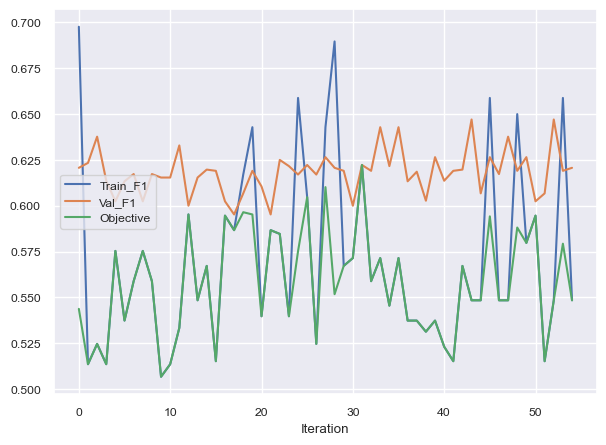

| 55        | 0.5484    | 0.03341   | 5.135     | 3.526     | 0.5974    | 0.7841    | 27.34     |


In [104]:
data = collections.defaultdict(list)
def TrainingLogit(type_imputer, strategy, knn_k, alpha, num_comp, weight):
    Pre_X = Pipe_Generator(type_imputer, strategy, knn_k,num_comp,alpha)
    weight = int(round(weight))
    Model_Logit = LogisticRegression(penalty=None, C=1.0, class_weight={0: 1, 1: weight}, solver='lbfgs', random_state=123)
    Pipe_Complete = Adding_Model(Pre_X, Model_Logit)
    return Training_protocol(Pipe_Complete)

def Target_Function_LogLas(**kwargs):
    Pipeline_complete, Objective = TrainingLogit(**kwargs)
    return Objective

Model_pbounds_reglogistica = { 'weight': (1, 100) }
BOptimizer_Logit = BayesianOptimizer(Target_Function_LogLas, Model_pbounds_reglogistica, 50)

In [105]:
BOptimizer_Logit.max

{'target': 0.6222222222222222,
 'params': {'alpha': 0.017281581596008136,
  'knn_k': 8.182998613590625,
  'num_comp': 21.351741219443532,
  'strategy': 0.6627973142320697,
  'type_imputer': 0.9492602891961105,
  'weight': 16.337371360788172}}

In [106]:
f1_train_regLogistica = BOptimizer_Logit.max['target']; f1_train_regLogistica

0.6222222222222222

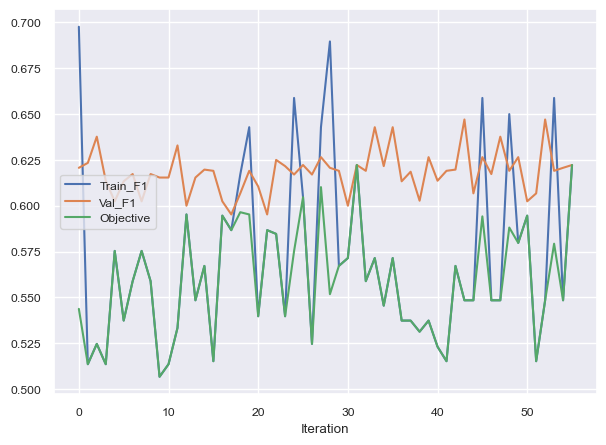

In [107]:
best_model, best_result = TrainingLogit(**BOptimizer_Logit.max["params"])

In [108]:
best_model.fit(X, y)

Pipeline(steps=[('Data Transform',
                 Pipeline(steps=[('General_Edit',
                                  Pipeline(steps=[('SingleImputer_Mediana',
                                                   <__main__.ImputadorPersonalizado object at 0x316b0cc40>)])),
                                 ('Columns Transform',
                                  ColumnTransformer(transformers=[('Numerical '
                                                                   'Transform',
                                                                   Pipeline(steps=[('Estandarización',
                                                                                    ScalerTransformer(threshold=0)),
                                                                                   ('PCA',
                                                                                    <__main__.PCA_Num object at 0x31743e530>...
                                                                    'lesion_abdomen_pelvis_new',
                                                                    'lesion_extremidades_new',
                                                                    'lesion_externo_new',
                                                                    'estrato_evento_trauma',
                                                                    'atencion_centro_mas_lejano',
                                                                    'nivel_vulnerabilidad_DANE',
                                                                    'riesgo_embarazo_adolescente_DANE',
                                                                    'elegibilidad_jovenes_empleo_DANE',
                                                                    'score_severidad_lesiones_new'])]))])),
                ('Model',
                 LogisticRegression(class_weight={0: 1, 1: 16}, penalty=None,
                                    random_state=123))])

Otras métricas basado en los datos de entrenamiento:

AUC de la curva ROC: 0.904
Precision: 0.7051
Sensibilidad (Recall): 0.6627
Especificidad: 0.9243


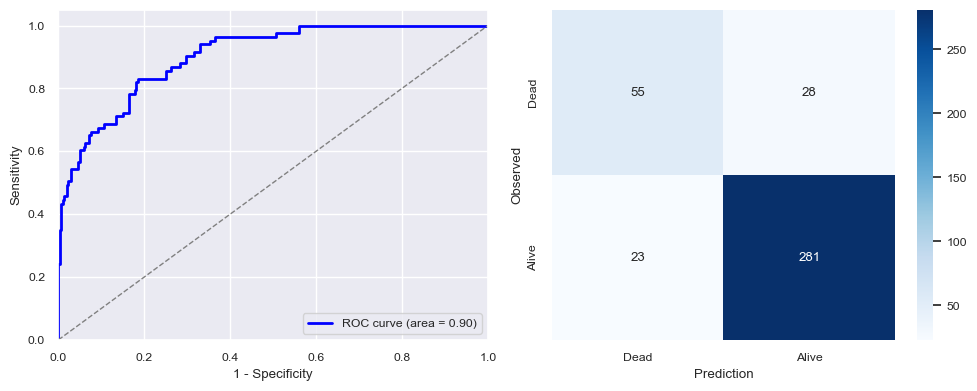

In [109]:
test_preds = best_model.predict_proba(X_train)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_train, test_preds > th) for th in ths])]
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_train_Logit = roc_auc_score(y_train, test_preds)
fpr_Logit, tpr_Logit, _ = roc_curve(y_train, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_train, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_train_regLogistica = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_train_regLogistica = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_train_regLogistica = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"AUC de la curva ROC: {round(auc_roc_train_Logit, 4)}")
print(f"Precision: {round(precision_train_regLogistica, 4)}")
print(f"Sensibilidad (Recall): {round(recall_train_regLogistica, 4)}")
print(f"Especificidad: {round(specificity_train_regLogistica, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_Logit, tpr_Logit, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_train_Logit:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity')
ax[0].set_ylabel('Sensitivity')
ax[0].set_title('')
ax[0].legend(loc="lower right")

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed')
ax[1].set_xlabel('Prediction')
ax[1].set_title('')

plt.tight_layout()
plt.show()

Se aplica el modelo óptimo al conjunto de validación, derivado de la partición del dataset:

F1 Score: 0.6591
AUC de la curva ROC: 0.8833
Precision: 0.5577
Sensibilidad (Recall): 0.8056
Especificidad: 0.8231


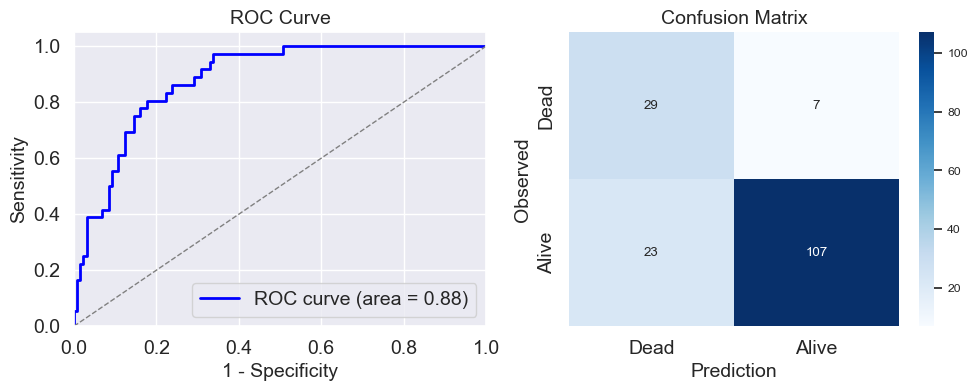

In [110]:
test_preds = best_model.predict_proba(X_evaluation)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_evaluation, test_preds > th) for th in ths])]
f1_regLogistica = f1_score(y_evaluation, test_preds > best_th)
y_pred_bin = test_preds > best_th

# VALIDACION
# Calcular AUC-ROC usando las predicciones binarias
auc_roc_Logit = roc_auc_score(y_evaluation, test_preds)
fpr_Logit, tpr_Logit, _ = roc_curve(y_evaluation, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_evaluation, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_regLogistica = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_regLogistica = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_regLogistica = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"F1 Score: {round(f1_regLogistica, 4)}")
print(f"AUC de la curva ROC: {round(auc_roc_Logit, 4)}")
print(f"Precision: {round(precision_regLogistica, 4)}")
print(f"Sensibilidad (Recall): {round(recall_regLogistica, 4)}")
print(f"Especificidad: {round(specificity_regLogistica, 4)}")


# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_Logit, tpr_Logit, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_Logit:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()
plt.show()


Finalmente, se presenta un histograma que ilustra la distribución de las probabilidades predichas bajo los datos de test:

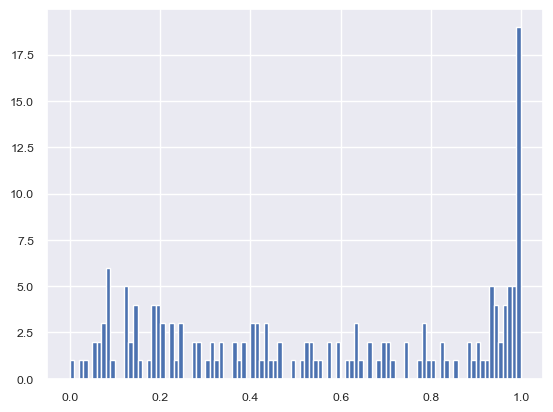

In [111]:
plt.hist(test_preds, bins=100)
plt.show()

#### Regresión logística - Lasso

Con la regresión logística, se implementa Lasso en su estructura interna. Nuestra atención se centrará en ajustar los hiperparámetros, específicamente el coeficiente de regularización C y los class_weights. El propósito de ajustar class_weights es aplicar una penalización más significativa a los errores asociados con la clase minoritaria, buscando así un equilibrio y mejorando la precisión del modelo en conjuntos de datos desequilibrados.

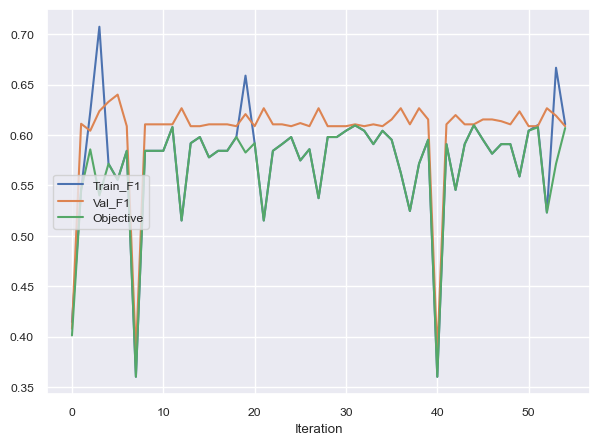

| 55        | 0.6069    | 0.02208   | 8.989     | 9.744     | 10.95     | 0.1052    | 0.1835    | 52.03     |


In [112]:
data = collections.defaultdict(list)
def TrainingLogit_lasso(type_imputer,strategy,knn_k,alpha,num_comp,model_C,weight):
    Pre_X = Pipe_Generator(type_imputer,strategy,knn_k,num_comp,alpha)
    weight = int(round(weight))
    Model_Logit_lasso =  LogisticRegression(penalty="l1", C=model_C, class_weight={0: 1, 1: weight}, solver='liblinear', random_state=123)
    Pipe_Complete = Adding_Model(Pre_X,Model_Logit_lasso)
    return Training_protocol(Pipe_Complete)

def Target_Function_LogLas(**kwargs):
    Pipeline_complete, Objective = TrainingLogit_lasso(**kwargs)
    return Objective

Model_pbounds_lasso = { 'model_C':(0.001, 10), 'weight':(1, 100) }
BOptimizer_Logit_lasso = BayesianOptimizer(Target_Function_LogLas,Model_pbounds_lasso,50)

In [113]:
BOptimizer_Logit_lasso.max

{'target': 0.6097560975609756,
 'params': {'alpha': 0.01,
  'knn_k': 10.0,
  'model_C': 5.382376706608767,
  'num_comp': 7.391778763015033,
  'strategy': 0.0,
  'type_imputer': 0.9599904905428179,
  'weight': 56.732271155151096}}

A continuación, se detalla el valor del F1-score, una medida que combina la precisión y la sensibilidad del modelo:

In [114]:
f1_train_regLogistica_lasso= BOptimizer_Logit_lasso.max['target']; f1_train_regLogistica_lasso

0.6097560975609756

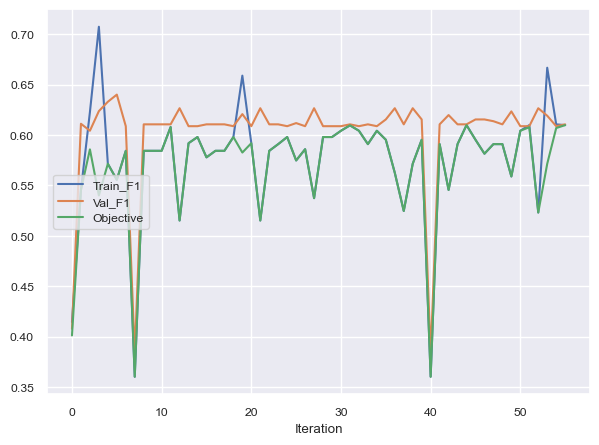

In [115]:
best_model, best_result = TrainingLogit_lasso(**BOptimizer_Logit_lasso.max["params"])

In [116]:
best_model.fit(X, y)

Pipeline(steps=[('Data Transform',
                 Pipeline(steps=[('General_Edit',
                                  Pipeline(steps=[('SingleImputer_Mediana',
                                                   <__main__.ImputadorPersonalizado object at 0x316cd6aa0>)])),
                                 ('Columns Transform',
                                  ColumnTransformer(transformers=[('Numerical '
                                                                   'Transform',
                                                                   Pipeline(steps=[('Estandarización',
                                                                                    ScalerTransformer(threshold=0)),
                                                                                   ('PCA',
                                                                                    <__main__.PCA_Num object at 0x316cd4bb0>...
                                                                    'lesion_extremidades_new',
                                                                    'lesion_externo_new',
                                                                    'estrato_evento_trauma',
                                                                    'atencion_centro_mas_lejano',
                                                                    'nivel_vulnerabilidad_DANE',
                                                                    'riesgo_embarazo_adolescente_DANE',
                                                                    'elegibilidad_jovenes_empleo_DANE',
                                                                    'score_severidad_lesiones_new'])]))])),
                ('Model',
                 LogisticRegression(C=5.382376706608767,
                                    class_weight={0: 1, 1: 57}, penalty='l1',
                                    random_state=123, solver='liblinear'))])

Otras métricas basado en los datos de entrenamiento:

AUC de la curva ROC: 0.8793
Precision: 0.5037
Sensibilidad (Recall): 0.8193
Especificidad: 0.7796


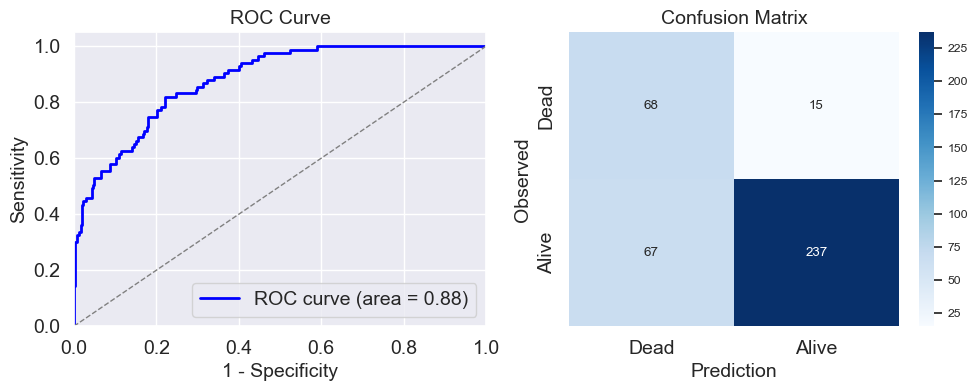

In [117]:
test_preds = best_model.predict_proba(X_train)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_train, test_preds > th) for th in ths])]
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_train_Logit_lasso = roc_auc_score(y_train, test_preds)
fpr_Logit_lasso , tpr_Logit_lasso , _ = roc_curve(y_train, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_train, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_train_regLogistica_lasso  = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_train_regLogistica_lasso  = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_train_regLogistica_lasso  = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"AUC de la curva ROC: {round(auc_roc_train_Logit_lasso, 4)}")
print(f"Precision: {round(precision_train_regLogistica_lasso, 4)}")
print(f"Sensibilidad (Recall): {round(recall_train_regLogistica_lasso, 4)}")
print(f"Especificidad: {round(specificity_train_regLogistica_lasso, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_Logit_lasso, tpr_Logit_lasso, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_train_Logit_lasso:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()
plt.show()

Se aplica el modelo óptimo al conjunto de validación, derivado de la partición del dataset:

F1 Score: 0.6667
AUC de la curva ROC: 0.8697
Precision: 0.5556
Sensibilidad (Recall): 0.8333
Especificidad: 0.8154


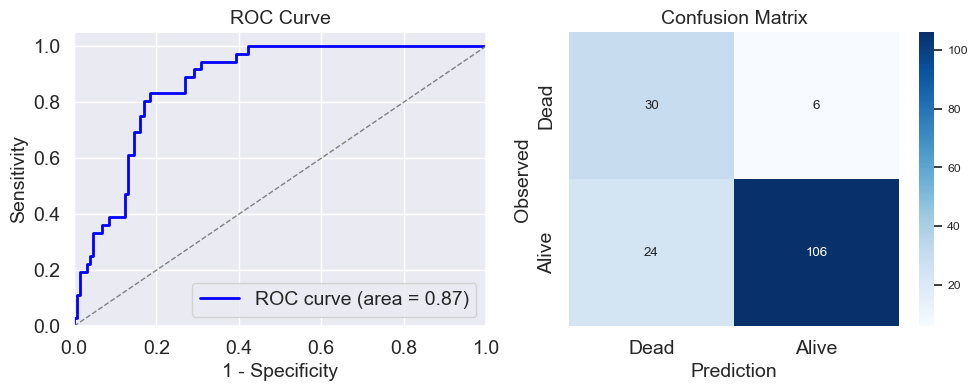

In [118]:
test_preds = best_model.predict_proba(X_evaluation)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_evaluation, test_preds > th) for th in ths])]
f1_lasso = f1_score(y_evaluation, test_preds > best_th)
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_Logit_lasso = roc_auc_score(y_evaluation, test_preds)
fpr_Logit_lasso, tpr_Logit_lasso, _ = roc_curve(y_evaluation, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_evaluation, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_lasso = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_lasso = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_lasso = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"F1 Score: {round(f1_lasso, 4)}")
print(f"AUC de la curva ROC: {round(auc_roc_Logit_lasso, 4)}")
print(f"Precision: {round(precision_lasso, 4)}")
print(f"Sensibilidad (Recall): {round(recall_lasso, 4)}")
print(f"Especificidad: {round(specificity_lasso, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_Logit_lasso, tpr_Logit_lasso, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_Logit_lasso:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()
plt.show()

Finalmente, se presenta un histograma que ilustra la distribución de las probabilidades predichas bajo los datos de test:

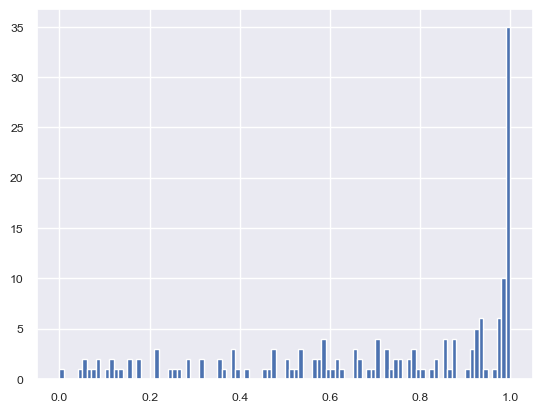

In [119]:
plt.hist(test_preds, bins=100)
plt.show()

#### Regresión logística - Ridge

Al igual que hemos investigado modelos utilizando la regresión de Lasso, procederemos a explorar y evaluar modelos mediante la aplicación de la regresión de Ridge.

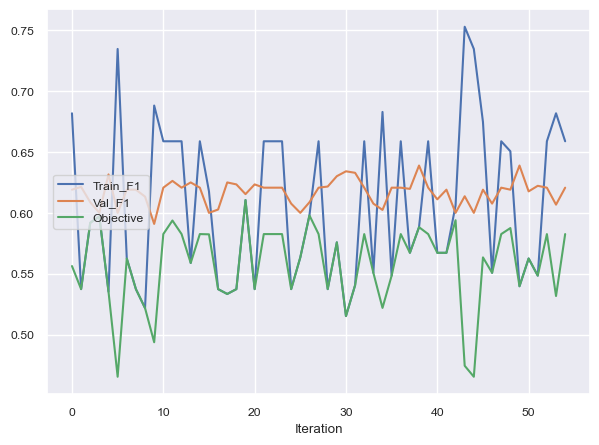

| 55        | 0.5826    | 0.4336    | 4.775     | 1.773     | 6.551     | 0.5671    | 0.6069    | 48.0      |


In [120]:
data = collections.defaultdict(list)
def TrainingLogit_ridge(type_imputer,strategy,knn_k,num_comp,alpha,model_C,weight):
    Pre_X = Pipe_Generator(type_imputer,strategy,knn_k,num_comp,alpha)
    weight = int(round(weight))
    Model_Logit_ridge =  LogisticRegression(penalty="l2", C=10**model_C, class_weight={0: 1, 1: weight}, solver='liblinear', random_state=123)
    Pipe_Complete = Adding_Model(Pre_X,Model_Logit_ridge)
    return Training_protocol(Pipe_Complete)

def Target_Function_LogRig(**kwargs):
    Pipeline_complete, Objective = TrainingLogit_ridge(**kwargs)
    return Objective

Model_pbounds_ridge = { 'model_C':(0.001, 10), 'weight':(1, 100) }
BOptimizer_Logit_ridge = BayesianOptimizer(Target_Function_LogRig,Model_pbounds_ridge,50)

In [121]:
BOptimizer_Logit_ridge.max

{'target': 0.6105263157894738,
 'params': {'alpha': 0.023100088270324656,
  'knn_k': 9.038930476054203,
  'model_C': 4.273263906160276,
  'num_comp': 7.476692412517303,
  'strategy': 0.6811884268301436,
  'type_imputer': 0.4139326139467423,
  'weight': 38.63618238683079}}

A continuación, se detalla el valor del F1-score, una medida que combina la precisión y la sensibilidad del modelo:

In [122]:
f1_train_regLogistica_ridge= BOptimizer_Logit_ridge.max['target']; f1_train_regLogistica_ridge

0.6105263157894738

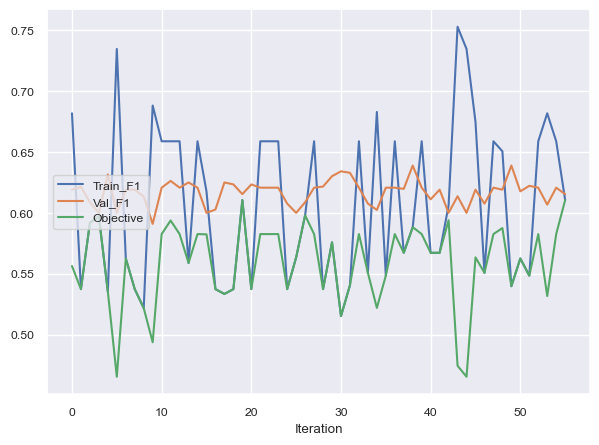

In [123]:
best_model, best_result = TrainingLogit_ridge(**BOptimizer_Logit_ridge.max["params"])

In [124]:
best_model.fit(X, y)

Pipeline(steps=[('Data Transform',
                 Pipeline(steps=[('General_Edit',
                                  Pipeline(steps=[('SingleImputer_Mediana',
                                                   <__main__.ImputadorPersonalizado object at 0x316b0f880>)])),
                                 ('Columns Transform',
                                  ColumnTransformer(transformers=[('Numerical '
                                                                   'Transform',
                                                                   Pipeline(steps=[('Estandarización',
                                                                                    ScalerTransformer(threshold=0)),
                                                                                   ('PCA',
                                                                                    <__main__.PCA_Num object at 0x316b0d9f0>...
                                                                    'lesion_abdomen_pelvis_new',
                                                                    'lesion_extremidades_new',
                                                                    'lesion_externo_new',
                                                                    'estrato_evento_trauma',
                                                                    'atencion_centro_mas_lejano',
                                                                    'nivel_vulnerabilidad_DANE',
                                                                    'riesgo_embarazo_adolescente_DANE',
                                                                    'elegibilidad_jovenes_empleo_DANE',
                                                                    'score_severidad_lesiones_new'])]))])),
                ('Model',
                 LogisticRegression(C=18761.342254614377,
                                    class_weight={0: 1, 1: 39},
                                    random_state=123, solver='liblinear'))])

Otras métricas basado en los datos de entrenamiento:

AUC de la curva ROC: 0.8998
Precision: 0.7576
Sensibilidad (Recall): 0.6024
Especificidad: 0.9474


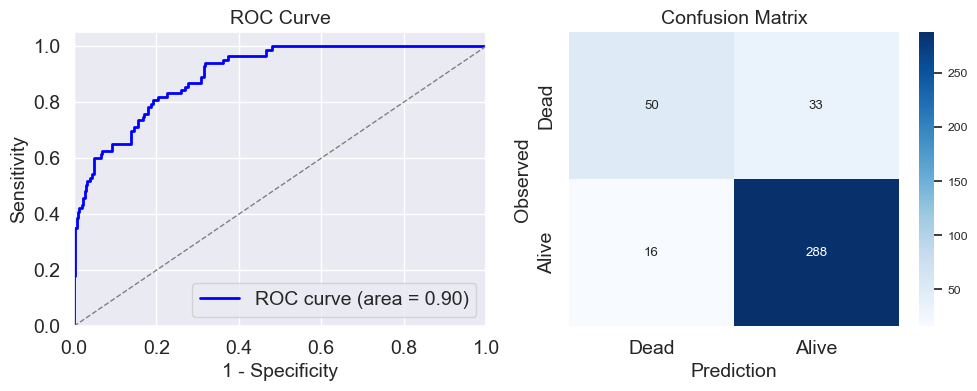

In [125]:
test_preds = best_model.predict_proba(X_train)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_train, test_preds > th) for th in ths])]
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_train_Logit_ridge = roc_auc_score(y_train, test_preds)
fpr_Logit_ridge , tpr_Logit_ridge , _ = roc_curve(y_train, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_train, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_train_regLogistica_ridge  = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_train_regLogistica_ridge  = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_train_regLogistica_ridge  = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"AUC de la curva ROC: {round(auc_roc_train_Logit_ridge, 4)}")
print(f"Precision: {round(precision_train_regLogistica_ridge, 4)}")
print(f"Sensibilidad (Recall): {round(recall_train_regLogistica_ridge, 4)}")
print(f"Especificidad: {round(specificity_train_regLogistica_ridge, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_Logit_ridge, tpr_Logit_ridge, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_train_Logit_ridge:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()
plt.show()

Se aplica el modelo óptimo al conjunto de validación, derivado de la partición del dataset:

F1 Score: 0.6591
AUC de la curva ROC: 0.8752
Precision: 0.5577
Sensibilidad (Recall): 0.8056
Especificidad: 0.8231


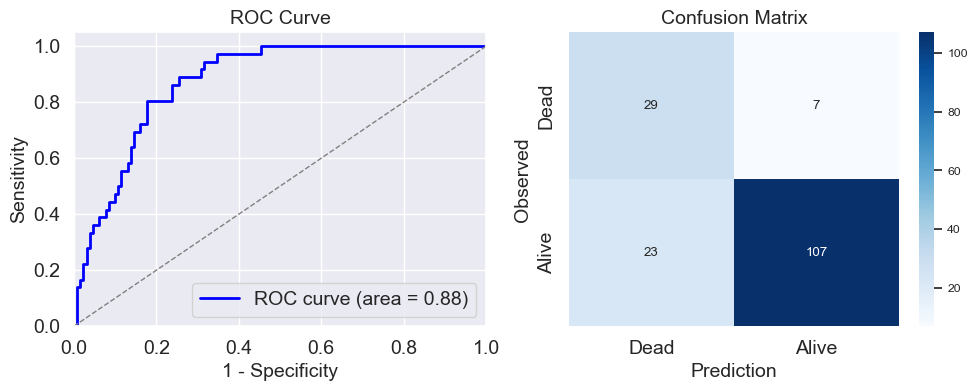

In [126]:
test_preds = best_model.predict_proba(X_evaluation)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_evaluation, test_preds > th) for th in ths])]
f1_ridge = f1_score(y_evaluation, test_preds > best_th)
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_Logit_ridge = roc_auc_score(y_evaluation, test_preds)
fpr_Logit_ridge, tpr_Logit_ridge, _ = roc_curve(y_evaluation, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_evaluation, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_ridge = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_ridge = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_ridge = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"F1 Score: {round(f1_ridge,4)}")
print(f"AUC de la curva ROC: {round(auc_roc_Logit_ridge,4)}")
print(f"Precision: {round(precision_ridge, 4)}")
print(f"Sensibilidad (Recall): {round(recall_ridge, 4)}")
print(f"Especificidad: {round(specificity_ridge, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_Logit_ridge, tpr_Logit_ridge, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_Logit_ridge:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()
plt.show()

Finalmente, se presenta un histograma que ilustra la distribución de las probabilidades predichas bajo los datos de test:

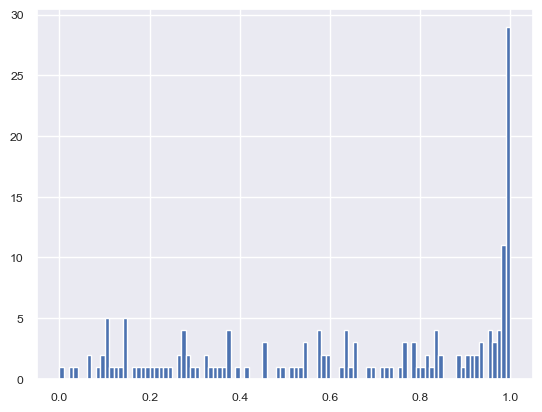

In [127]:
plt.hist(test_preds, bins=100)
plt.show()

#### Regresión logística - Elastic net

Vamos a explorar ElasticNet, una técnica que integra las fortalezas de Ridge y Lasso, incorporando un hiperparámetro adicional. Este hiperparámetro ajusta el equilibrio en la ponderación entre la regresión de Ridge y la de Lasso, permitiendo una afinación más precisa en la construcción del modelo.

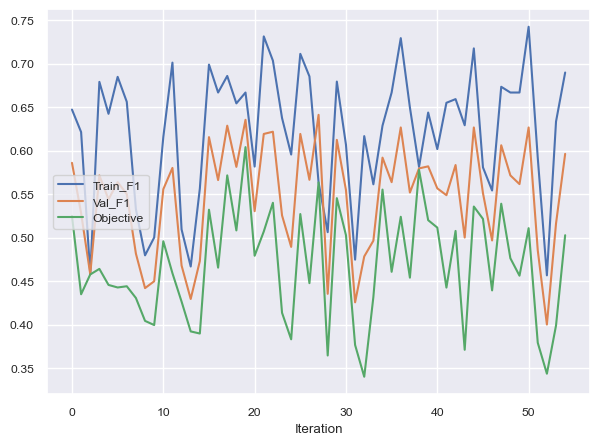

| 55        | 0.5027    | 0.1827    | 4.326     | 2.449     | 8.629     | 0.4845    | 0.1933    | 0.3883    | 35.99     |


In [128]:
data = collections.defaultdict(list)
def TrainingLogit_elastic(type_imputer,strategy,knn_k,num_comp,alpha,model_C,weight,ratio_l1):
    Pre_X = Pipe_Generator(type_imputer,strategy,knn_k,num_comp,alpha)
    weight = int(round(weight))
    Model_Logit_elastic =  LogisticRegression(penalty="elasticnet",C=10**model_C,class_weight={0: 1, 1: weight},l1_ratio=ratio_l1,solver='saga', random_state=123)
    Pipe_Complete = Adding_Model(Pre_X,Model_Logit_elastic)
    return Training_protocol(Pipe_Complete)

def Target_Function_LogEla(**kwargs):
    Pipeline_complete, Objective = TrainingLogit_elastic(**kwargs)
    return Objective

Model_pbounds_elastic = { 'model_C':(0.001, 10), 'weight':(1, 100), 'ratio_l1':(0,1) }
BOptimizer_Logit_elastic = BayesianOptimizer(Target_Function_LogEla,Model_pbounds_elastic,50)

In [129]:
BOptimizer_Logit_elastic.max

{'target': 0.6039215686274509,
 'params': {'alpha': 0.29729554896162647,
  'knn_k': 3.679578951359458,
  'model_C': 0.8722790553865264,
  'num_comp': 13.701709059628518,
  'ratio_l1': 0.30476018133252725,
  'strategy': 0.7092006259569803,
  'type_imputer': 0.0593423843530807,
  'weight': 15.634422519092288}}

A continuación, se detalla el valor del F1-score, una medida que combina la precisión y la sensibilidad del modelo:

In [130]:
f1_train_regLogistica_elastic= BOptimizer_Logit_ridge.max['target']; f1_train_regLogistica_elastic

0.6105263157894738

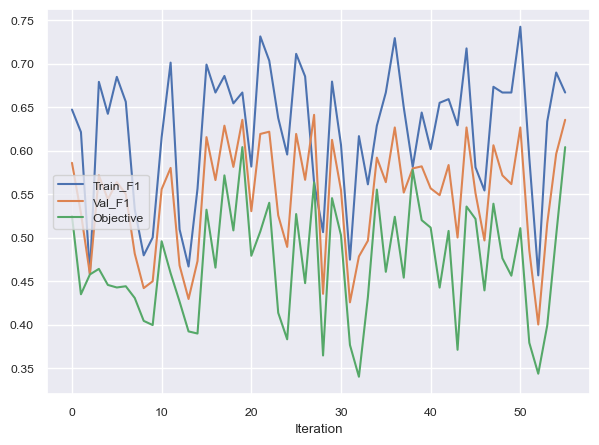

In [131]:
best_model, best_result = TrainingLogit_elastic(**BOptimizer_Logit_elastic.max["params"])

In [132]:
best_model.fit(X, y)

Pipeline(steps=[('Data Transform',
                 Pipeline(steps=[('General_Edit',
                                  Pipeline(steps=[('SingleImputer_Mediana',
                                                   <__main__.ImputadorPersonalizado object at 0x317342f50>)])),
                                 ('Columns Transform',
                                  ColumnTransformer(transformers=[('Numerical '
                                                                   'Transform',
                                                                   Pipeline(steps=[('Estandarización',
                                                                                    ScalerTransformer(threshold=0)),
                                                                                   ('PCA',
                                                                                    <__main__.PCA_Num object at 0x32f8f3550>...
                                                                    'lesion_externo_new',
                                                                    'estrato_evento_trauma',
                                                                    'atencion_centro_mas_lejano',
                                                                    'nivel_vulnerabilidad_DANE',
                                                                    'riesgo_embarazo_adolescente_DANE',
                                                                    'elegibilidad_jovenes_empleo_DANE',
                                                                    'score_severidad_lesiones_new'])]))])),
                ('Model',
                 LogisticRegression(C=7.452106542934155,
                                    class_weight={0: 1, 1: 16},
                                    l1_ratio=0.30476018133252725,
                                    penalty='elasticnet', random_state=123,
                                    solver='saga'))])

Otras métricas basado en los datos de entrenamiento:

AUC de la curva ROC: 0.906
Precision: 0.7179
Sensibilidad (Recall): 0.6747
Especificidad: 0.9276


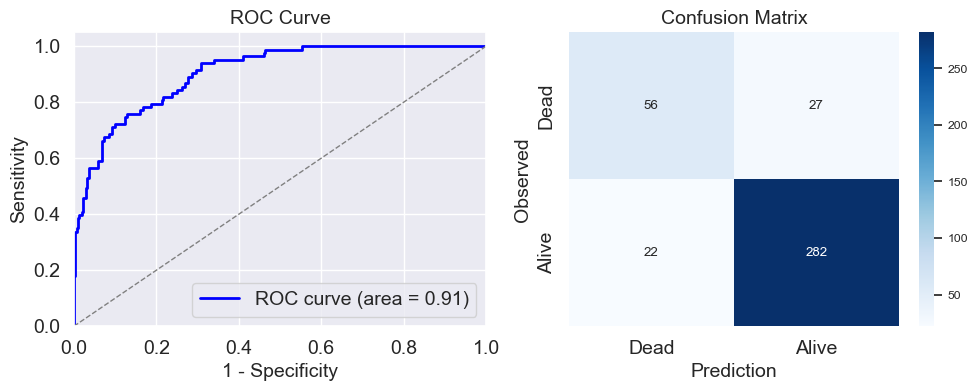

In [133]:
test_preds = best_model.predict_proba(X_train)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_train, test_preds > th) for th in ths])]
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_train_Logit_elastic = roc_auc_score(y_train, test_preds)
fpr_Logit_elastic , tpr_Logit_elastic , _ = roc_curve(y_train, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_train, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_train_regLogistica_elastic  = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_train_regLogistica_elastic  = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_train_regLogistica_elastic  = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"AUC de la curva ROC: {round(auc_roc_train_Logit_elastic, 4)}")
print(f"Precision: {round(precision_train_regLogistica_elastic, 4)}")
print(f"Sensibilidad (Recall): {round(recall_train_regLogistica_elastic, 4)}")
print(f"Especificidad: {round(specificity_train_regLogistica_elastic, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_Logit_elastic, tpr_Logit_elastic, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_train_Logit_elastic:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()
plt.show()

Se aplica el modelo óptimo al conjunto de validación, derivado de la partición del dataset:

F1 Score: 0.6512
AUC de la curva ROC: 0.8688
Precision: 0.56
Sensibilidad (Recall): 0.7778
Especificidad: 0.8308


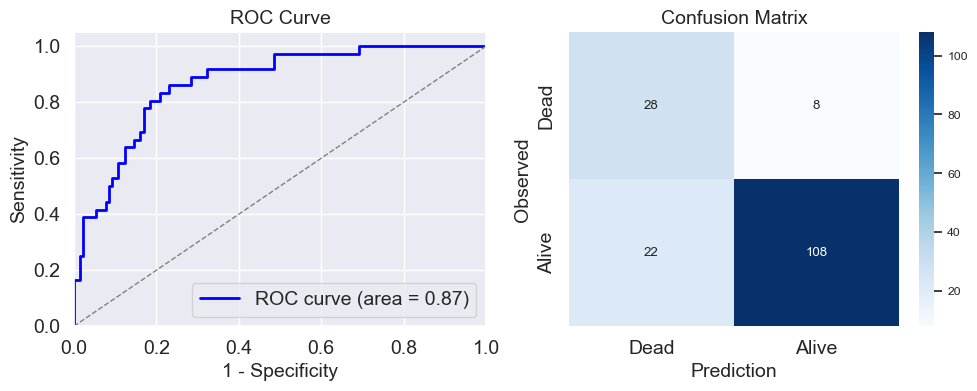

In [134]:
test_preds = best_model.predict_proba(X_evaluation)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_evaluation, test_preds > th) for th in ths])]
f1_elastic_net = f1_score(y_evaluation, test_preds > best_th)
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_Logit_elastic = roc_auc_score(y_evaluation, test_preds)
fpr_Logit_elastic, tpr_Logit_elastic, _ = roc_curve(y_evaluation, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_evaluation, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_elastic = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_elastic = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_elastic = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"F1 Score: {round(f1_elastic_net,4)}")
print(f"AUC de la curva ROC: {round(auc_roc_Logit_elastic,4)}")
print(f"Precision: {round(precision_elastic, 4)}")
print(f"Sensibilidad (Recall): {round(recall_elastic, 4)}")
print(f"Especificidad: {round(specificity_elastic, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_Logit_elastic, tpr_Logit_elastic, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_Logit_elastic:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()
plt.show()

Finalmente, se presenta un histograma que ilustra la distribución de las probabilidades predichas bajo los datos de test:

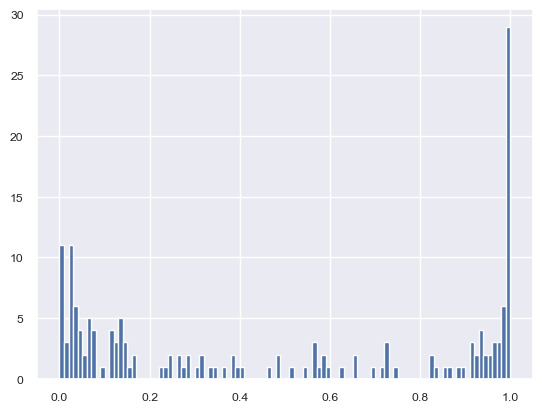

In [135]:
plt.hist(test_preds, bins=100)
plt.show()

#### Support Vector Classification (SVC)

A continuación se presenta el modelo optimizado utilizando SVC, aplicando distintos tipos de kernel para la comparación de su rendimiento.

##### Kernel sigmoid

Vamos a utilizar la máquina de vectores de soporte (SVM) con un kernel sigmoid para clasificar nuestros datos. El kernel sigmoid, caracterizado por su función $\tanh(\alpha x \cdot x' + c)$, transforma el espacio de características de una manera no lineal, facilitando la separación de clases que no son linealmente separables en el espacio original.

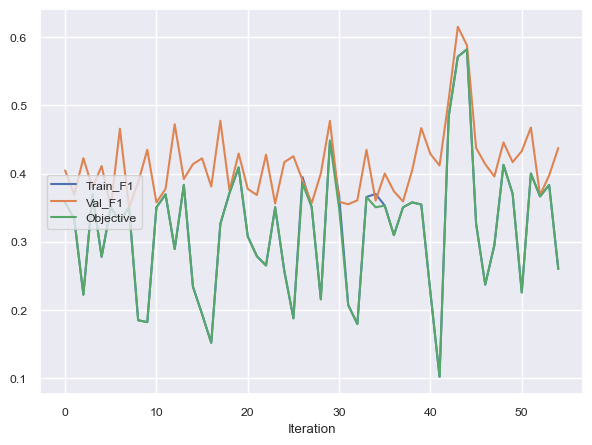

| 55        | 0.2597    | 2.503     | 0.9473    | 0.1789    | 4.657     | 15.57     | 0.1933    | 0.3883    | 6.594     |


In [136]:
data = collections.defaultdict(list)
def TrainingSVM_Sigmoide(type_imputer,strategy,knn_k,num_comp,alpha,SVM_C,SVM_Sigm_Gamma,weight):
    Pre_X = Pipe_Generator(type_imputer,strategy,knn_k,num_comp,alpha)
    weight = int(round(weight))
    Model_SVM = SVC(kernel='sigmoid',probability=True,C=SVM_C, gamma=SVM_Sigm_Gamma, class_weight={0:1, 1: weight}, random_state=123)
    Pipe_Complete = Adding_Model(Pre_X,Model_SVM)
    return Training_protocol(Pipe_Complete)

def Target_Function_SVMSig(**kwargs):
    Pipeline_complete, Objective = TrainingSVM_Sigmoide(**kwargs)
    return Objective

Model_pbounds_scv_sig = {'SVM_C': (0.001, 10), 'SVM_Sigm_Gamma':(0,5),'weight':(2,15)}
BOptimizer_SVMSg = BayesianOptimizer(Target_Function_SVMSig,Model_pbounds_scv_sig,50)

In [137]:
BOptimizer_SVMSg.max["params"]

{'SVM_C': 4.910846859904765,
 'SVM_Sigm_Gamma': 0.5398905719400554,
 'alpha': 0.08041913373101743,
 'knn_k': 6.825522649759467,
 'num_comp': 15.190772182223206,
 'strategy': 0.4734252435072519,
 'type_imputer': 0.7892925397728028,
 'weight': 3.215028256886863}

A continuación, se detalla el valor del F1-score, una medida que combina la precisión y la sensibilidad del modelo:

In [138]:
f1_train_SVM_sigmoide= BOptimizer_SVMSg.max['target']; f1_train_SVM_sigmoide

0.5822784810126582

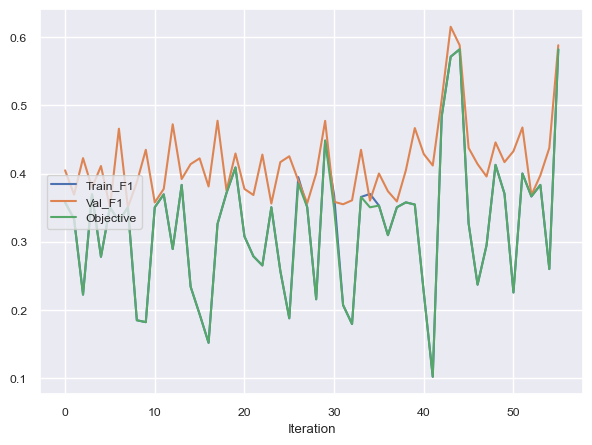

In [139]:
best_model, best_result = TrainingSVM_Sigmoide(**BOptimizer_SVMSg.max["params"])

In [140]:
best_model.fit(X, y)

Pipeline(steps=[('Data Transform',
                 Pipeline(steps=[('General_Edit',
                                  Pipeline(steps=[('SingleImputer_Mediana',
                                                   <__main__.ImputadorPersonalizado object at 0x316dfe980>)])),
                                 ('Columns Transform',
                                  ColumnTransformer(transformers=[('Numerical '
                                                                   'Transform',
                                                                   Pipeline(steps=[('Estandarización',
                                                                                    ScalerTransformer(threshold=0)),
                                                                                   ('PCA',
                                                                                    <__main__.PCA_Num object at 0x3175c8160>...
                                                                    'lesion_extremidades_new',
                                                                    'lesion_externo_new',
                                                                    'estrato_evento_trauma',
                                                                    'atencion_centro_mas_lejano',
                                                                    'nivel_vulnerabilidad_DANE',
                                                                    'riesgo_embarazo_adolescente_DANE',
                                                                    'elegibilidad_jovenes_empleo_DANE',
                                                                    'score_severidad_lesiones_new'])]))])),
                ('Model',
                 SVC(C=4.910846859904765, class_weight={0: 1, 1: 3},
                     gamma=0.5398905719400554, kernel='sigmoid',
                     probability=True, random_state=123))])

Otras métricas basado en los datos de entrenamiento:

AUC de la curva ROC: 0.7596
Precision: 0.5682
Sensibilidad (Recall): 0.6024
Especificidad: 0.875


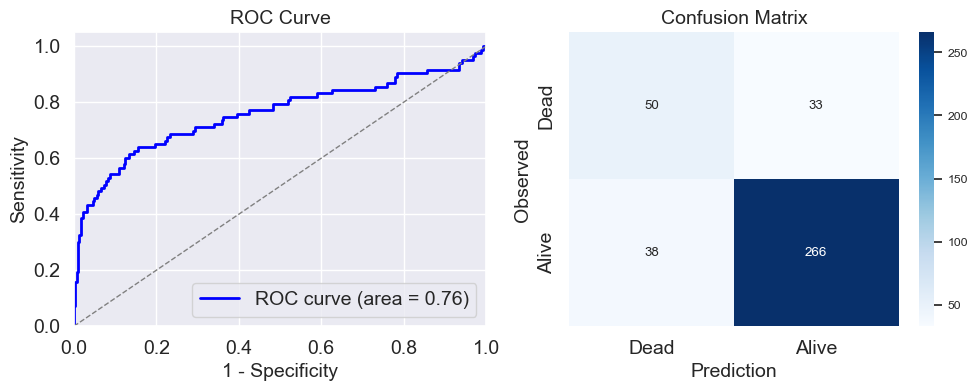

In [141]:
test_preds = best_model.predict_proba(X_train)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_train, test_preds > th) for th in ths])]
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_train_SVM_sigmoide = roc_auc_score(y_train, test_preds)
fpr_SVM_sigmoide , tpr_SVM_sigmoide , _ = roc_curve(y_train, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_train, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_train_SVM_sigmoide  = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_train_SVM_sigmoide  = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_train_SVM_sigmoide  = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"AUC de la curva ROC: {round(auc_roc_train_SVM_sigmoide, 4)}")
print(f"Precision: {round(precision_train_SVM_sigmoide, 4)}")
print(f"Sensibilidad (Recall): {round(recall_train_SVM_sigmoide, 4)}")
print(f"Especificidad: {round(specificity_train_SVM_sigmoide, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_SVM_sigmoide, tpr_SVM_sigmoide, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_train_SVM_sigmoide:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()
plt.show()

Se aplica el modelo óptimo al conjunto de validación, derivado de la partición del dataset:

F1 Score: 0.6071
AUC de la curva ROC: 0.7329
Precision: 0.85
Sensibilidad (Recall): 0.4722
Especificidad: 0.9769


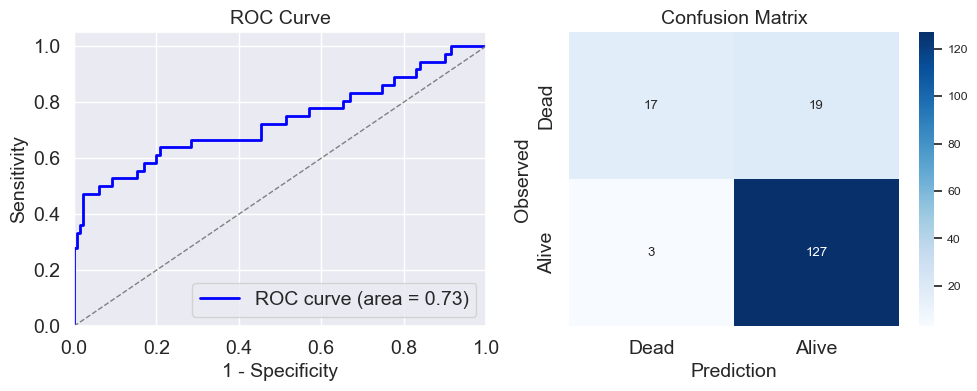

In [142]:
test_preds = best_model.predict_proba(X_evaluation)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_evaluation, test_preds > th) for th in ths])]
f1_svc_sig = f1_score(y_evaluation, test_preds > best_th)
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_SVM_Sigmoide = roc_auc_score(y_evaluation, test_preds)
fpr_SVM_Sigmoide, tpr_SVM_Sigmoide, _  = roc_curve(y_evaluation, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_evaluation, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precisio_SVM_Sigmoide = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_SVM_Sigmoide = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_SVM_Sigmoide = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"F1 Score: {round(f1_svc_sig,4)}")
print(f"AUC de la curva ROC: {round(auc_roc_SVM_Sigmoide,4)}")
print(f"Precision: {round(precisio_SVM_Sigmoide, 4)}")
print(f"Sensibilidad (Recall): {round(recall_SVM_Sigmoide, 4)}")
print(f"Especificidad: {round(specificity_SVM_Sigmoide, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_SVM_Sigmoide, tpr_SVM_Sigmoide, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_SVM_Sigmoide:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()
plt.show()

Finalmente, se presenta un histograma que ilustra la distribución de las probabilidades predichas bajo los datos de test:

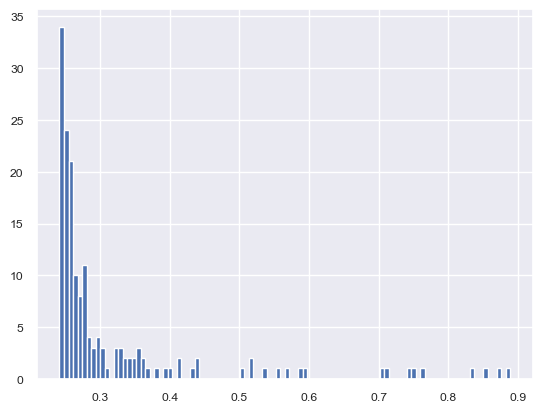

In [143]:
plt.hist(test_preds, bins=100)
plt.show()

##### RBF Kernel 

Vamos a utilizar la máquina de vectores de soporte (SVM) con un kernel Radial Basis Function (RBF) para clasificar nuestros datos. El kernel RBF, expresado como $K(x, x') = \exp(-\gamma \|x - x'\|^2)$, donde $\gamma$ es un parámetro que debe ser seleccionado cuidadosamente, transforma el espacio de características aplicando una medida de similitud que decrece con la distancia entre los puntos de muestra. Esta propiedad hace que el kernel RBF sea excepcionalmente adecuado para manejar casos en los que la relación entre las clases no es lineal, permitiendo una clasificación eficaz incluso en espacios de alta dimensión y en situaciones donde la distribución de los datos es compleja.

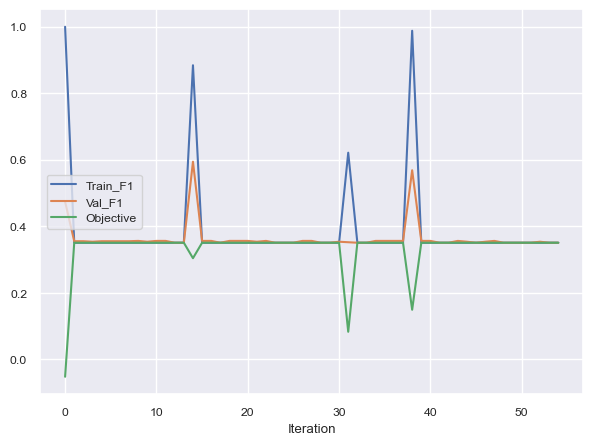

| 55        | 0.3504    | 0.001     | 0.7       | 7.062     | 30.0      | 0.0       | 0.0       | 0.0       | 15.0      |


In [144]:
data = collections.defaultdict(list)
def TrainingSVM_RBF(type_imputer,strategy,knn_k,num_comp,alpha,SVM_C,svm_rbf_gamma,weight):
    Pre_X = Pipe_Generator(type_imputer,strategy,knn_k,num_comp,alpha)
    weight = int(round(weight))
    Model_SVM = SVC(kernel='rbf',probability=True,C=SVM_C, gamma=svm_rbf_gamma, class_weight={0:1, 1: weight}, random_state=123)
    Pipe_Complete = Adding_Model(Pre_X,Model_SVM)
    return Training_protocol(Pipe_Complete)

def Target_Function_SVMRBF(**kwargs):
    Pipeline_complete, Objective = TrainingSVM_RBF(**kwargs)
    return Objective

Model_pbounds_svc_rbf = {'SVM_C': (0.001, 10), 'svm_rbf_gamma':(0,5),'weight':(2,15)}
BOptimizer_SVMRbf = BayesianOptimizer(Target_Function_SVMRBF,Model_pbounds_svc_rbf,50)

In [145]:
BOptimizer_SVMRbf.max["params"]

{'SVM_C': 3.968277974832469,
 'alpha': 0.38178354646231627,
 'knn_k': 5.934361600823063,
 'num_comp': 21.186146011109265,
 'strategy': 0.20445224973151743,
 'svm_rbf_gamma': 4.390587181954727,
 'type_imputer': 0.027387593197926163,
 'weight': 10.716077632319228}

A continuación, se detalla el valor del F1-score, una medida que combina la precisión y la sensibilidad del modelo:

In [146]:
f1_train_SVM_rbf= BOptimizer_SVMRbf.max['target']; f1_train_SVM_rbf

0.35042735042735046

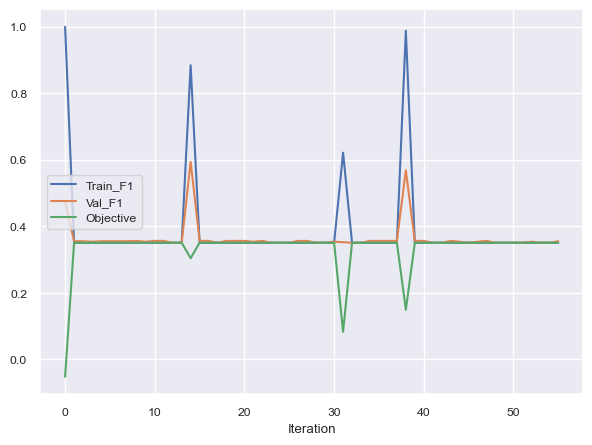

In [147]:
best_model, best_result = TrainingSVM_RBF(**BOptimizer_SVMRbf.max["params"])

In [148]:
best_model.fit(X, y)

Pipeline(steps=[('Data Transform',
                 Pipeline(steps=[('General_Edit',
                                  Pipeline(steps=[('SingleImputer_Mediana',
                                                   <__main__.ImputadorPersonalizado object at 0x32fdf0ca0>)])),
                                 ('Columns Transform',
                                  ColumnTransformer(transformers=[('Numerical '
                                                                   'Transform',
                                                                   Pipeline(steps=[('Estandarización',
                                                                                    ScalerTransformer(threshold=0)),
                                                                                   ('PCA',
                                                                                    <__main__.PCA_Num object at 0x32f82b6d0>...
                                                                    'lesion_extremidades_new',
                                                                    'lesion_externo_new',
                                                                    'estrato_evento_trauma',
                                                                    'atencion_centro_mas_lejano',
                                                                    'nivel_vulnerabilidad_DANE',
                                                                    'riesgo_embarazo_adolescente_DANE',
                                                                    'elegibilidad_jovenes_empleo_DANE',
                                                                    'score_severidad_lesiones_new'])]))])),
                ('Model',
                 SVC(C=3.968277974832469, class_weight={0: 1, 1: 11},
                     gamma=4.390587181954727, probability=True,
                     random_state=123))])

Otras métricas basado en los datos de entrenamiento:

AUC de la curva ROC: 1.0
Precision: 1.0
Sensibilidad (Recall): 1.0
Especificidad: 1.0


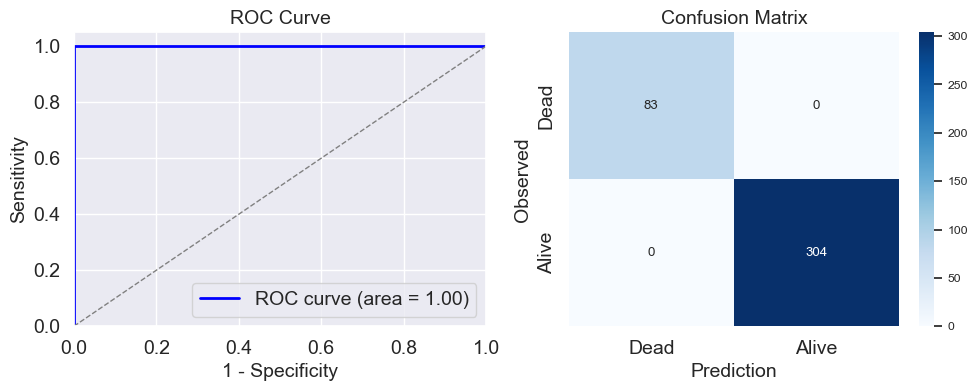

In [149]:
test_preds = best_model.predict_proba(X_train)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_train, test_preds > th) for th in ths])]
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_train_SVM_rbf = roc_auc_score(y_train, test_preds)
fpr_SVM_rbf , tpr_SVM_rbf , _ = roc_curve(y_train, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_train, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_train_SVM_rbf  = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_train_SVM_rbf  = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_train_SVM_rbf  = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"AUC de la curva ROC: {round(auc_roc_train_SVM_rbf, 4)}")
print(f"Precision: {round(precision_train_SVM_rbf, 4)}")
print(f"Sensibilidad (Recall): {round(recall_train_SVM_rbf, 4)}")
print(f"Especificidad: {round(specificity_train_SVM_rbf, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_SVM_rbf, tpr_SVM_rbf, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_train_SVM_rbf:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()
plt.show()

Se aplica el modelo óptimo al conjunto de validación, derivado de la partición del dataset:

F1 Score: 0.9714
AUC de la curva ROC: 0.9996
Precision: 1.0
Sensibilidad (Recall): 0.9444
Especificidad: 1.0


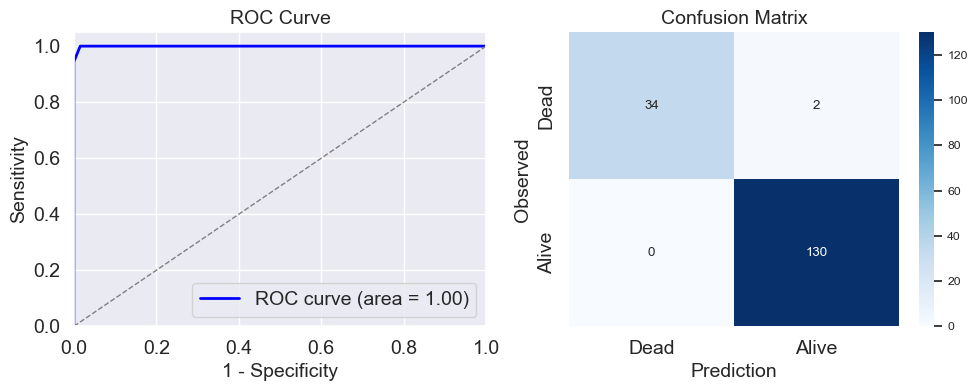

In [150]:
test_preds = best_model.predict_proba(X_evaluation)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_evaluation, test_preds > th) for th in ths])]
f1_svc_rbf = f1_score(y_evaluation, test_preds > best_th)
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_SVM_RBF = roc_auc_score(y_evaluation, test_preds)
fpr_SVM_RBF, tpr_SVM_RBF, _ = roc_curve(y_evaluation, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_evaluation, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_SVM_rbf = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_SVM_rbf = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_SVM_rbf = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"F1 Score: {round(f1_svc_rbf,4)}")
print(f"AUC de la curva ROC: {round(auc_roc_SVM_RBF,4)}")
print(f"Precision: {round(precision_SVM_rbf, 4)}")
print(f"Sensibilidad (Recall): {round(recall_SVM_rbf, 4)}")
print(f"Especificidad: {round(specificity_SVM_rbf, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_SVM_RBF, tpr_SVM_RBF, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_SVM_RBF:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()

# Guardar la figura en alta resolución
plt.savefig('RBF_curveROC.png', dpi=300)

plt.show()

Finalmente, se presenta un histograma que ilustra la distribución de las probabilidades predichas bajo los datos de test:

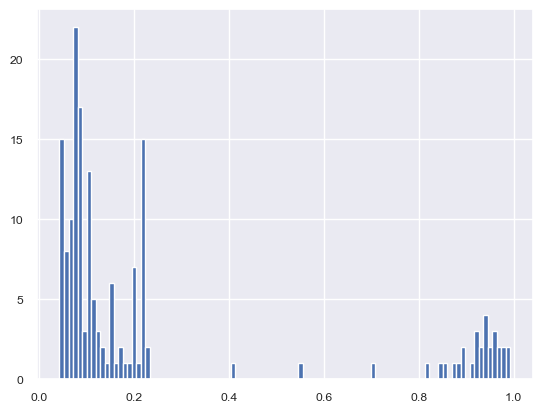

In [151]:
plt.hist(test_preds, bins=100)
plt.show()

##### Linear Kernel

Vamos a utilizar la máquina de vectores de soporte (SVM) con un kernel lineal para clasificar nuestros datos. El kernel lineal se define simplemente como $K(x, x') = x \cdot x'$, donde $x$ y $x'$ son vectores en el espacio de características. Este kernel no transforma el espacio de características; en su lugar, permite a la SVM operar en el espacio original, asumiendo que las clases son linealmente separables o casi linealmente separables. El uso del kernel lineal es particularmente efectivo en situaciones donde la relación entre las variables de entrada y la salida es aproximadamente lineal o cuando el número de características es muy alto en comparación con el número de muestras, proporcionando una solución más simple y computacionalmente eficiente.

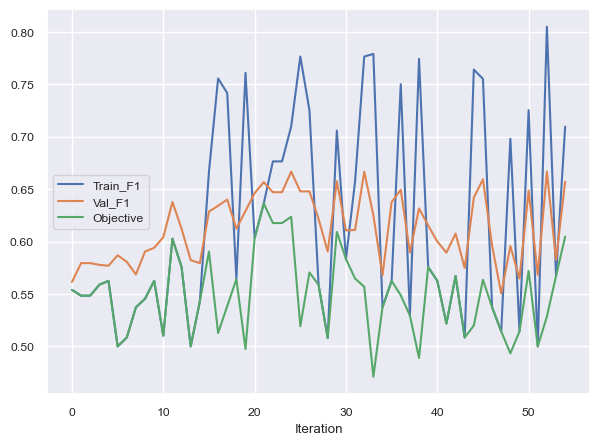

| 55        | 0.6046    | 0.5773    | 0.294     | 3.306     | 22.08     | 0.4125    | 2.561     | 0.2416    | 4.433     |


In [152]:
data = collections.defaultdict(list)
def TrainingSVM_linear(type_imputer,strategy,knn_k,num_comp,alpha,SVM_C,svm_linear_gamma,weight):
    Pre_X = Pipe_Generator(type_imputer,strategy,knn_k,num_comp,alpha)
    weight = int(round(weight))
    Model_SVM = SVC(kernel='linear',probability=True,C=SVM_C, gamma=svm_linear_gamma, class_weight={0:1, 1: weight}, random_state=123)
    Pipe_Complete = Adding_Model(Pre_X,Model_SVM)
    return Training_protocol(Pipe_Complete)

def Target_Function_SVMLin(**kwargs):
    Pipeline_complete, Objective = TrainingSVM_linear(**kwargs)
    return Objective

Model_pbounds_svmlin = {'SVM_C': (0.001, 10), 'svm_linear_gamma':(0,5),'weight':(2,15)}
BOptimizer_SVMLin = BayesianOptimizer(Target_Function_SVMLin,Model_pbounds_svmlin,50)

In [153]:
BOptimizer_SVMLin.max["params"]

{'SVM_C': 0.08456049159767319,
 'alpha': 0.6914689197217517,
 'knn_k': 3.630963744222319,
 'num_comp': 21.85517957437792,
 'strategy': 0.3326346494430573,
 'svm_linear_gamma': 3.3351034433144857,
 'type_imputer': 0.2524718192575969,
 'weight': 4.750880094778661}

A continuación, se detalla el valor del F1-score, una medida que combina la precisión y la sensibilidad del modelo:

In [154]:
f1_train_SVM_lin= BOptimizer_SVMLin.max['target']; f1_train_SVM_lin

0.6363636363636365

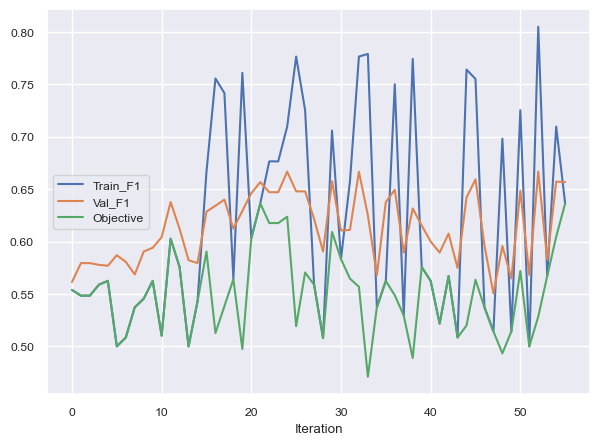

In [155]:
best_model, best_result = TrainingSVM_linear(**BOptimizer_SVMLin.max["params"])

In [156]:
best_model.fit(X, y)

Pipeline(steps=[('Data Transform',
                 Pipeline(steps=[('General_Edit',
                                  Pipeline(steps=[('SingleImputer_Mediana',
                                                   <__main__.ImputadorPersonalizado object at 0x3178064a0>)])),
                                 ('Columns Transform',
                                  ColumnTransformer(transformers=[('Numerical '
                                                                   'Transform',
                                                                   Pipeline(steps=[('Estandarización',
                                                                                    ScalerTransformer(threshold=0)),
                                                                                   ('PCA',
                                                                                    <__main__.PCA_Num object at 0x317b9d4e0>...
                                                                    'lesion_extremidades_new',
                                                                    'lesion_externo_new',
                                                                    'estrato_evento_trauma',
                                                                    'atencion_centro_mas_lejano',
                                                                    'nivel_vulnerabilidad_DANE',
                                                                    'riesgo_embarazo_adolescente_DANE',
                                                                    'elegibilidad_jovenes_empleo_DANE',
                                                                    'score_severidad_lesiones_new'])]))])),
                ('Model',
                 SVC(C=0.08456049159767319, class_weight={0: 1, 1: 5},
                     gamma=3.3351034433144857, kernel='linear',
                     probability=True, random_state=123))])

Otras métricas basado en los datos de entrenamiento:

AUC de la curva ROC: 0.9019
Precision: 0.8154
Sensibilidad (Recall): 0.6386
Especificidad: 0.9605


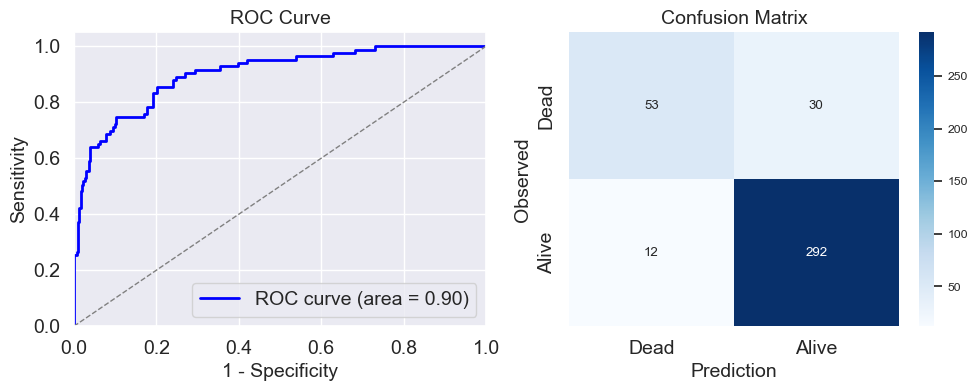

In [157]:
test_preds = best_model.predict_proba(X_train)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_train, test_preds > th) for th in ths])]
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_train_SVM_lin = roc_auc_score(y_train, test_preds)
fpr_SVM_lin , tpr_SVM_lin , _ = roc_curve(y_train, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_train, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_train_SVM_lin  = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_train_SVM_lin  = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_train_SVM_lin  = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"AUC de la curva ROC: {round(auc_roc_train_SVM_lin, 4)}")
print(f"Precision: {round(precision_train_SVM_lin, 4)}")
print(f"Sensibilidad (Recall): {round(recall_train_SVM_lin, 4)}")
print(f"Especificidad: {round(specificity_train_SVM_lin, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_SVM_lin, tpr_SVM_lin, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_train_SVM_lin:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()
plt.show()

Se aplica el modelo óptimo al conjunto de validación, derivado de la partición del dataset:

F1 Score: 0.7013
AUC de la curva ROC: 0.8902
Precision: 0.6585
Sensibilidad (Recall): 0.75
Especificidad: 0.8923


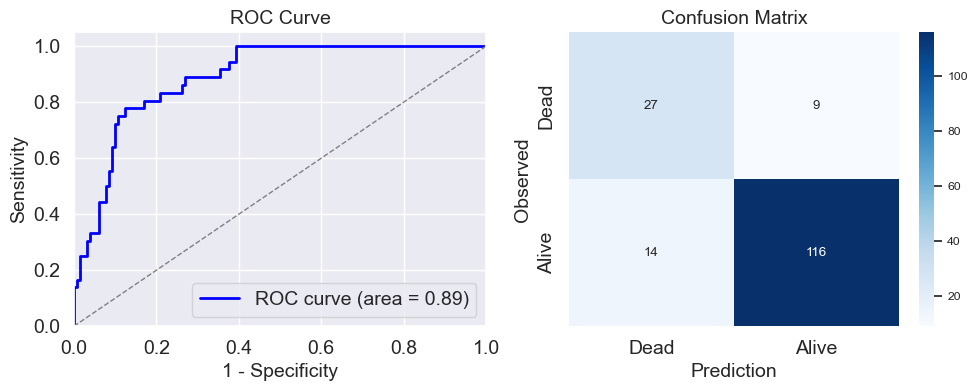

In [158]:
test_preds = best_model.predict_proba(X_evaluation)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_evaluation, test_preds > th) for th in ths])]
f1_svc_lin = f1_score(y_evaluation, test_preds > best_th)
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_SVM_linear = roc_auc_score(y_evaluation, test_preds)
fpr_SVM_linear, tpr_SVM_linear, _  = roc_curve(y_evaluation, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_evaluation, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_SVM_lin = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_SVM_lin = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_SVM_lin = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"F1 Score: {round(f1_svc_lin,4)}")
print(f"AUC de la curva ROC: {round(auc_roc_SVM_linear,4)}")
print(f"Precision: {round(precision_SVM_lin, 4)}")
print(f"Sensibilidad (Recall): {round(recall_SVM_lin, 4)}")
print(f"Especificidad: {round(specificity_SVM_lin, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_SVM_linear, tpr_SVM_linear, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_SVM_linear:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()
plt.show()

Finalmente, se presenta un histograma que ilustra la distribución de las probabilidades predichas bajo los datos de test:

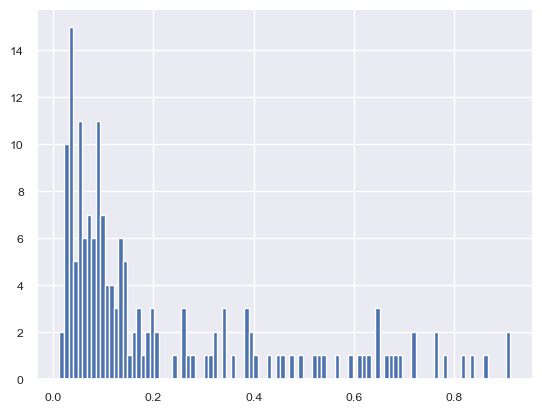

In [159]:
plt.hist(test_preds, bins=100)
plt.show()

##### Polynomial Kernel

Vamos a utilizar la máquina de vectores de soporte (SVM) con un kernel polinomial para clasificar nuestros datos. El kernel polinomial se define como $K(x, x') = ( \gamma x \cdot x' + r)^d$, donde $\gamma$ es el coeficiente de escala, $r$ es el término independiente y $d$ representa el grado del polinomio. Este kernel introduce una transformación no lineal en el espacio de características, permitiendo que la SVM maneje casos donde las relaciones entre las clases no son linealmente separables en el espacio original. La capacidad de ajustar el grado del polinomio y otros parámetros permite una gran flexibilidad, haciendo que el kernel polinomial sea adecuado para una variedad de tareas de clasificación, especialmente cuando se desconoce la naturaleza exacta de la relación entre las características y las etiquetas de clase.

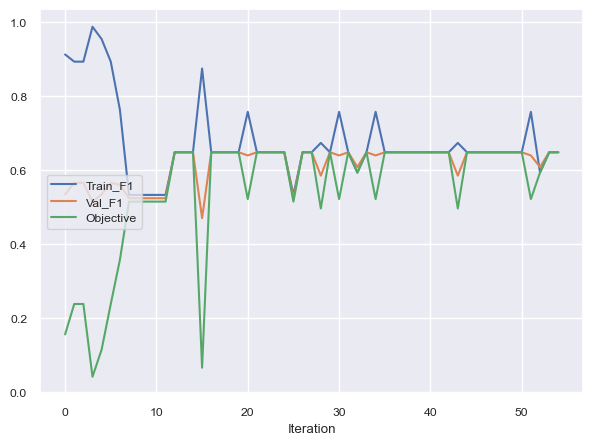

| 55        | 0.6486    | 0.001     | 0.01      | 10.0      | 5.072     | 1.0       | 5.0       | 0.0       | 5.0       |


In [160]:
data = collections.defaultdict(list)
def TrainingSVM_poly(type_imputer,strategy,knn_k,num_comp,alpha,SVM_C,svm_poly_gamma,weight):
    Pre_X = Pipe_Generator(type_imputer,strategy,knn_k,num_comp,alpha)
    weight = int(round(weight))
    Model_SVM = SVC(kernel='poly',probability=True,C=SVM_C, class_weight={0:1, 1: weight}, random_state=123)
    Pipe_Complete = Adding_Model(Pre_X,Model_SVM)
    return Training_protocol(Pipe_Complete)

def Target_Function_SVMPoly(**kwargs):
    Pipeline_complete, Objective = TrainingSVM_poly(**kwargs)
    return Objective

Model_pbounds_svmpoly = {'SVM_C': (0.001, 10), 'svm_poly_gamma':(0,5),'weight':(5,15)}
BOptimizer_SVMPoly = BayesianOptimizer(Target_Function_SVMPoly,Model_pbounds_svmpoly,50)

In [161]:
BOptimizer_SVMPoly.max["params"]

{'SVM_C': 0.001,
 'alpha': 0.01,
 'knn_k': 10.0,
 'num_comp': 30.0,
 'strategy': 1.0,
 'svm_poly_gamma': 0.0,
 'type_imputer': 1.0,
 'weight': 5.0}

A continuación, se detalla el valor del F1-score, una medida que combina la precisión y la sensibilidad del modelo:

In [162]:
f1_train_SVM_Poly= BOptimizer_SVMPoly.max['target']; f1_train_SVM_Poly

0.6486486486486487

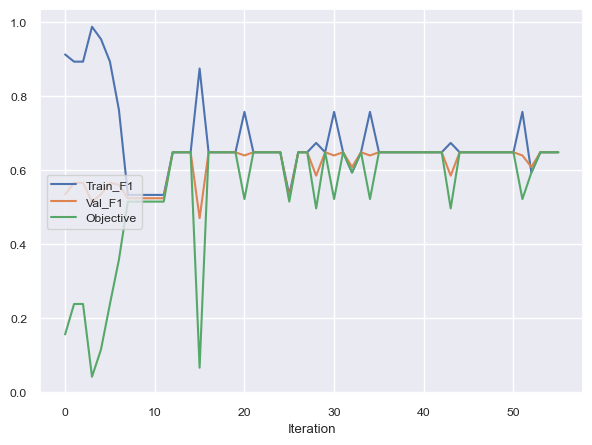

In [163]:
best_model, best_result = TrainingSVM_poly(**BOptimizer_SVMPoly.max["params"])

In [164]:
best_model.fit(X, y)

Pipeline(steps=[('Data Transform',
                 Pipeline(steps=[('General_Edit',
                                  Pipeline(steps=[('SingleImputer_Mediana',
                                                   <__main__.ImputadorPersonalizado object at 0x32f989cf0>)])),
                                 ('Columns Transform',
                                  ColumnTransformer(transformers=[('Numerical '
                                                                   'Transform',
                                                                   Pipeline(steps=[('Estandarización',
                                                                                    ScalerTransformer(threshold=0)),
                                                                                   ('PCA',
                                                                                    <__main__.PCA_Num object at 0x3126083d0>...
                                                                    'lesion_abdomen_pelvis_new',
                                                                    'lesion_extremidades_new',
                                                                    'lesion_externo_new',
                                                                    'estrato_evento_trauma',
                                                                    'atencion_centro_mas_lejano',
                                                                    'nivel_vulnerabilidad_DANE',
                                                                    'riesgo_embarazo_adolescente_DANE',
                                                                    'elegibilidad_jovenes_empleo_DANE',
                                                                    'score_severidad_lesiones_new'])]))])),
                ('Model',
                 SVC(C=0.001, class_weight={0: 1, 1: 5}, kernel='poly',
                     probability=True, random_state=123))])

Otras métricas basado en los datos de entrenamiento:

AUC de la curva ROC: 0.8431
Precision: 0.8103
Sensibilidad (Recall): 0.5663
Especificidad: 0.9638


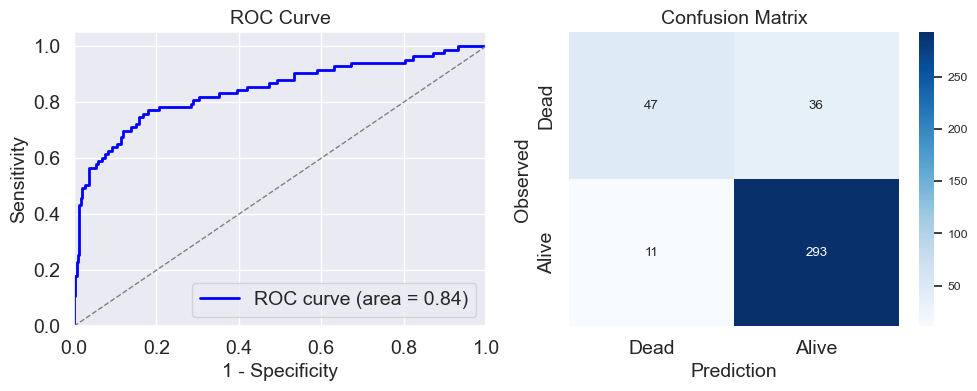

In [165]:
test_preds = best_model.predict_proba(X_train)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_train, test_preds > th) for th in ths])]
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_train_SVM_poly = roc_auc_score(y_train, test_preds)
fpr_SVM_poly , tpr_SVM_poly , _ = roc_curve(y_train, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_train, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_train_SVM_poly  = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_train_SVM_poly  = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_train_SVM_poly  = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"AUC de la curva ROC: {round(auc_roc_train_SVM_poly, 4)}")
print(f"Precision: {round(precision_train_SVM_poly, 4)}")
print(f"Sensibilidad (Recall): {round(recall_train_SVM_poly, 4)}")
print(f"Especificidad: {round(specificity_train_SVM_poly, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_SVM_poly, tpr_SVM_poly, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_train_SVM_poly:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()
plt.show()

Se aplica el modelo óptimo al conjunto de validación, derivado de la partición del dataset:

F1 Score: 0.6857
AUC de la curva ROC: 0.8645
Precision: 0.7059
Sensibilidad (Recall): 0.6667
Especificidad: 0.9231


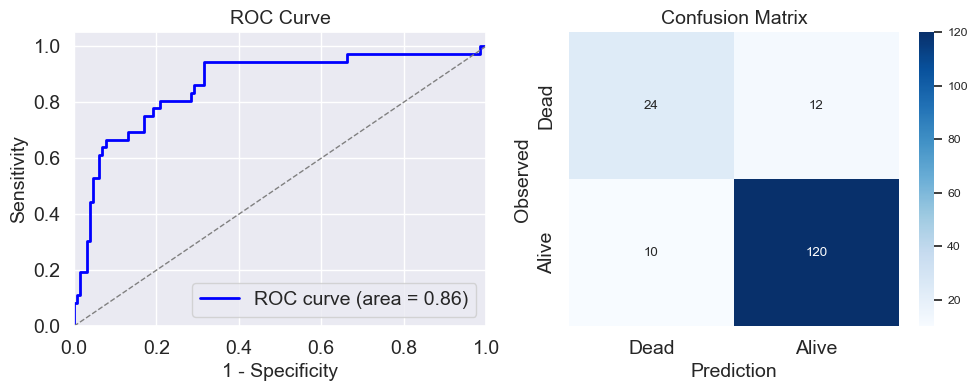

In [166]:
test_preds = best_model.predict_proba(X_evaluation)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_evaluation, test_preds > th) for th in ths])]
f1_svc_poli = f1_score(y_evaluation, test_preds > best_th)
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_SVM_poly = roc_auc_score(y_evaluation, test_preds)
fpr_SVM_poly, tpr_SVM_poly, _ = roc_curve(y_evaluation, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_evaluation, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_poly = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_poly = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_poly = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"F1 Score: {round(f1_svc_poli,4)}")
print(f"AUC de la curva ROC: {round(auc_roc_SVM_poly,4)}")
print(f"Precision: {round(precision_poly, 4)}")
print(f"Sensibilidad (Recall): {round(recall_poly, 4)}")
print(f"Especificidad: {round(specificity_poly, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_SVM_poly, tpr_SVM_poly, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_SVM_poly:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()
plt.show()

Finalmente, se presenta un histograma que ilustra la distribución de las probabilidades predichas bajo los datos de test:

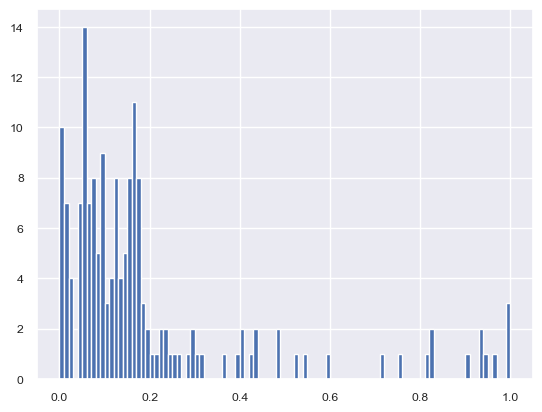

In [167]:
plt.hist(test_preds, bins=100)
plt.show()

#### Random forest

A continuación se detalla el modelo afinado utilizando el método de Random Forest, donde se han explorado diversas configuraciones de hiperparámetros para evaluar y mejorar su eficacia predictiva.

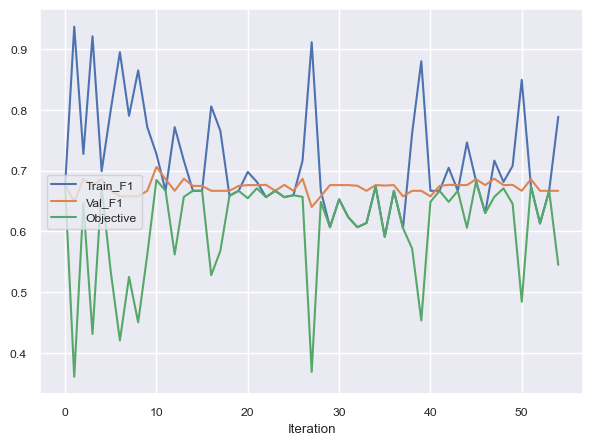

| 55        | 0.5446    | 0.2376    | 9.89      | 4.46      | 1.954     | 4.261     | 120.2     | 2.852     | 0.838     | 0.4283    |


In [168]:
data = collections.defaultdict(list)
from sklearn.ensemble import RandomForestClassifier
def TrainingRandom_Forest(type_imputer,strategy,knn_k,num_comp,alpha,min_samples_leaf,min_samples_split,max_depth,n_estimators):
    Pre_X = Pipe_Generator(type_imputer,strategy,knn_k,num_comp,alpha)
    max_depth = int(round(max_depth))
    min_samples_leaf = int(round(min_samples_leaf))
    min_samples_split = int(round(min_samples_split))
    n_estimators= int(round(n_estimators))
    Model_SVM = RandomForestClassifier(max_depth=max_depth,
                                       min_samples_leaf=min_samples_leaf,
                                       min_samples_split=min_samples_split,
                                       n_estimators=n_estimators, 
                                       random_state=123
                                       )
    Pipe_Complete = Adding_Model(Pre_X,Model_SVM)
    return Training_protocol(Pipe_Complete)

def Target_Function_RF(**kwargs):
    Pipeline_complete, Objective = TrainingRandom_Forest(**kwargs)
    return Objective

Model_pbounds_rf = {'max_depth': (1,20), 'min_samples_leaf':(1,3),'min_samples_split':(2,5), 'n_estimators':(100,400)}
BOptimizer_Random_Forest= BayesianOptimizer(Target_Function_RF,Model_pbounds_rf,50)

In [169]:
BOptimizer_Random_Forest.max["params"]

{'alpha': 0.2433968083321761,
 'knn_k': 7.486003971091739,
 'max_depth': 1.8383286989834844,
 'min_samples_leaf': 1.7423000890358622,
 'min_samples_split': 2.5216850489524094,
 'n_estimators': 128.73108977084684,
 'num_comp': 7.236005560485336,
 'strategy': 0.2857078727288883,
 'type_imputer': 0.3322628963048947}

A continuación, se detalla el valor del F1-score, una medida que combina la precisión y la sensibilidad del modelo:

In [170]:
f1_train_RF= BOptimizer_Random_Forest.max['target']; f1_train_RF

0.6844919786096257

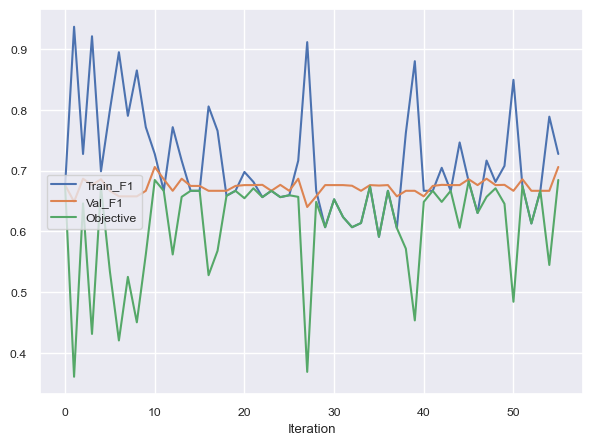

In [171]:
best_model, best_result = TrainingRandom_Forest(**BOptimizer_Random_Forest.max["params"])

In [172]:
best_model.fit(X, y)

Pipeline(steps=[('Data Transform',
                 Pipeline(steps=[('General_Edit',
                                  Pipeline(steps=[('SingleImputer_Mediana',
                                                   <__main__.ImputadorPersonalizado object at 0x32f842470>)])),
                                 ('Columns Transform',
                                  ColumnTransformer(transformers=[('Numerical '
                                                                   'Transform',
                                                                   Pipeline(steps=[('Estandarización',
                                                                                    ScalerTransformer(threshold=0)),
                                                                                   ('PCA',
                                                                                    <__main__.PCA_Num object at 0x32f840eb0>...
                                                                    'lesion_extremidades_new',
                                                                    'lesion_externo_new',
                                                                    'estrato_evento_trauma',
                                                                    'atencion_centro_mas_lejano',
                                                                    'nivel_vulnerabilidad_DANE',
                                                                    'riesgo_embarazo_adolescente_DANE',
                                                                    'elegibilidad_jovenes_empleo_DANE',
                                                                    'score_severidad_lesiones_new'])]))])),
                ('Model',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        min_samples_split=3, n_estimators=129,
                                        random_state=123))])

Otras métricas basado en los datos de entrenamiento:

AUC de la curva ROC: 0.8949
Precision: 0.875
Sensibilidad (Recall): 0.5904
Especificidad: 0.977


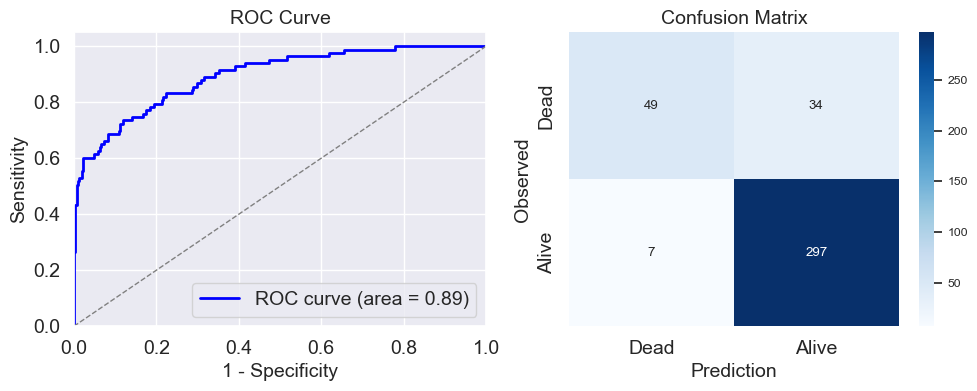

In [173]:
test_preds = best_model.predict_proba(X_train)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_train, test_preds > th) for th in ths])]
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_train_RF = roc_auc_score(y_train, test_preds)
fpr_RF , tpr_RF , _ = roc_curve(y_train, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_train, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_train_RF  = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_train_RF  = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_train_RF  = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"AUC de la curva ROC: {round(auc_roc_train_RF, 4)}")
print(f"Precision: {round(precision_train_RF, 4)}")
print(f"Sensibilidad (Recall): {round(recall_train_RF, 4)}")
print(f"Especificidad: {round(specificity_train_RF, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_RF, tpr_RF, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_train_RF:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()
plt.show()

Se aplica el modelo óptimo al conjunto de validación, derivado de la partición del dataset:

F1 Score: 0.7027
AUC de la curva ROC: 0.8951
Precision: 0.6842
Sensibilidad (Recall): 0.7222
Especificidad: 0.9077


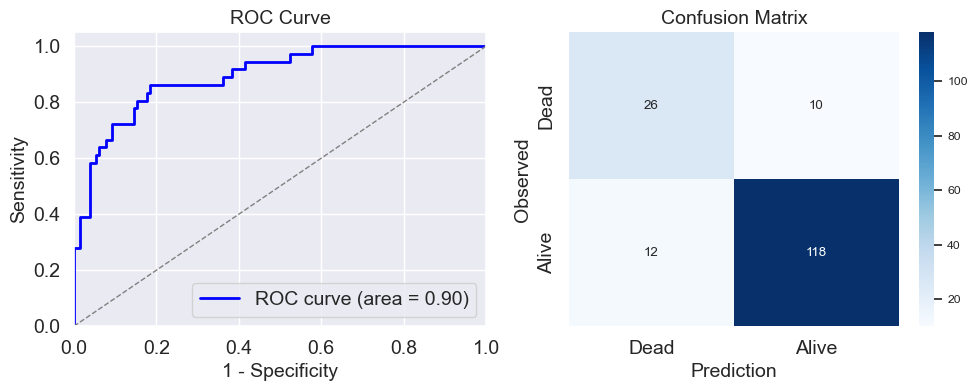

In [174]:
test_preds = best_model.predict_proba(X_evaluation)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_evaluation, test_preds > th) for th in ths])]
f1_rand_forst = f1_score(y_evaluation, test_preds > best_th)
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_Random_Forest = roc_auc_score(y_evaluation, test_preds)
fpr_Random_Forest, tpr_Random_Forest, _  = roc_curve(y_evaluation, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_evaluation, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_RF= tp / (tp + fp) if (tp + fp) != 0 else 0
recall_RF = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_RF = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"F1 Score: {round(f1_rand_forst,4)}")
print(f"AUC de la curva ROC: {round(auc_roc_Random_Forest,4)}")
print(f"Precision: {round(precision_RF, 4)}")
print(f"Sensibilidad (Recall): {round(recall_RF, 4)}")
print(f"Especificidad: {round(specificity_RF, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_Random_Forest, tpr_Random_Forest, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_Random_Forest:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()

# Guardar la figura en alta resolución
plt.savefig('RF_curveROC.png', dpi=300)

plt.show()


Finalmente, se presenta un histograma que ilustra la distribución de las probabilidades predichas bajo los datos de test:

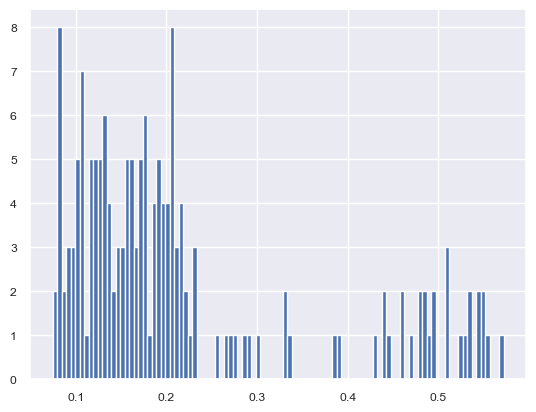

In [175]:
plt.hist(test_preds, bins=100)
plt.show()

#### XGBoost

A continuación se expone el modelo empleando XGBoost, donde se han ajustado y comparado diferentes conjuntos de hiperparámetros para optimizar su precisión y rendimiento predictivo.

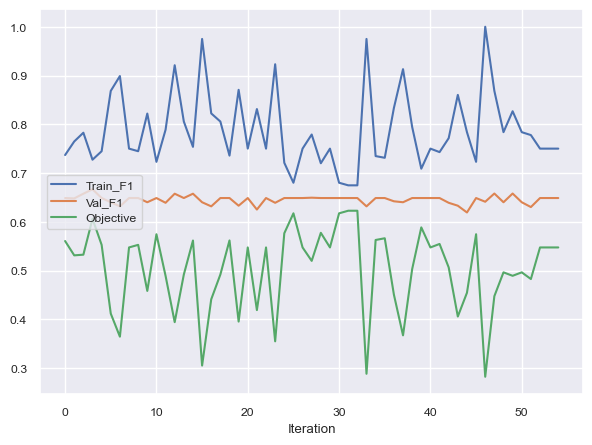

| 55        | 0.5473    | 0.6183    | 3.231     | 4.453     | 0.2617    | 3.127     | 133.0     | 22.15     | 0.8263    | 0.3289    |


In [176]:
data = collections.defaultdict(list)
def TrainingXGBoost(type_imputer,strategy,knn_k,num_comp,alpha, learning_rate,n_estimators,max_depth,gamma):
    max_depth = int(round(max_depth))
    n_estimators = int(round(n_estimators))
    Pre_X = Pipe_Generator(type_imputer,strategy,knn_k,num_comp,alpha)
    Model_SVM = XGBClassifier(max_depth=max_depth,
        learning_rate=learning_rate,
        n_estimators=n_estimators,
        gamma=gamma,
        random_state=123)
    Pipe_Complete = Adding_Model(Pre_X,Model_SVM)
    return Training_protocol(Pipe_Complete)

def Target_Function_XGB(**kwargs):
    Pipeline_complete, Objective = TrainingXGBoost(**kwargs)
    return Objective

Model_pbounds_xg = {'learning_rate': (0.01, 1.0),
    'n_estimators': (100, 1000),
    'max_depth': (3,10),
    'gamma': (0, 5)}

BOptimizer_XG_Boost = BayesianOptimizer(Target_Function_XGB,Model_pbounds_xg,50)

In [177]:
BOptimizer_XG_Boost.max["params"]

{'alpha': 0.11774321288381494,
 'gamma': 3.7596621814411986,
 'knn_k': 8.048116969376334,
 'learning_rate': 0.12913140306590823,
 'max_depth': 6.229437266463972,
 'n_estimators': 642.3701731715681,
 'num_comp': 13.505866910747033,
 'strategy': 0.8933175601597346,
 'type_imputer': 0.24988436102278289}

A continuación, se detalla el valor del F1-score, una medida que combina la precisión y la sensibilidad del modelo:

In [178]:
f1_train_XG= BOptimizer_XG_Boost.max['target']; f1_train_XG

0.6225985021165745

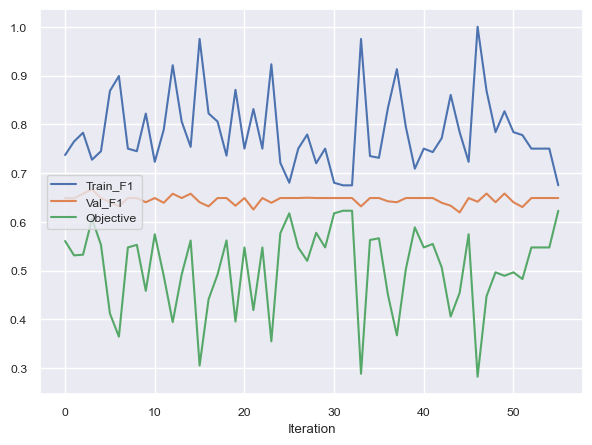

In [179]:
best_model, best_result = TrainingXGBoost(**BOptimizer_XG_Boost.max["params"])

In [180]:
best_model.fit(X, y)

Pipeline(steps=[('Data Transform',
                 Pipeline(steps=[('General_Edit',
                                  Pipeline(steps=[('SingleImputer_Mediana',
                                                   <__main__.ImputadorPersonalizado object at 0x32fec9180>)])),
                                 ('Columns Transform',
                                  ColumnTransformer(transformers=[('Numerical '
                                                                   'Transform',
                                                                   Pipeline(steps=[('Estandarización',
                                                                                    ScalerTransformer(threshold=0)),
                                                                                   ('PCA',
                                                                                    <__main__.PCA_Num object at 0x31701f7f0>...
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None,
                               learning_rate=0.12913140306590823, max_bin=None,
                               max_cat_threshold=None, max_cat_to_onehot=None,
                               max_delta_step=None, max_depth=6,
                               max_leaves=None, min_child_weight=None,
                               missing=nan, monotone_constraints=None,
                               multi_strategy=None, n_estimators=642,
                               n_jobs=None, num_parallel_tree=None,
                               random_state=123, ...))])

Otras métricas basado en los datos de entrenamiento:

AUC de la curva ROC: 0.9438
Precision: 0.8354
Sensibilidad (Recall): 0.7952
Especificidad: 0.9572


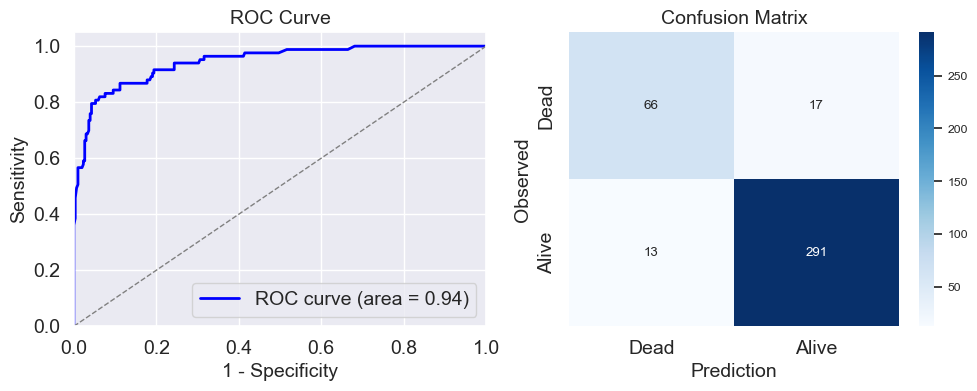

In [181]:
test_preds = best_model.predict_proba(X_train)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_train, test_preds > th) for th in ths])]
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_train_XB = roc_auc_score(y_train, test_preds)
fpr_XB , tpr_XB , _ = roc_curve(y_train, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_train, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_train_XB  = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_train_XB  = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_train_XB  = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"AUC de la curva ROC: {round(auc_roc_train_XB, 4)}")
print(f"Precision: {round(precision_train_XB, 4)}")
print(f"Sensibilidad (Recall): {round(recall_train_XB, 4)}")
print(f"Especificidad: {round(specificity_train_XB, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_XB, tpr_XB, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_train_XB:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()
plt.show()

Se aplica el modelo óptimo al conjunto de validación, derivado de la partición del dataset:

F1 Score: 0.7123
AUC de la curva ROC: 0.9175
Precision: 0.7027
Sensibilidad (Recall): 0.7222
Especificidad: 0.9154


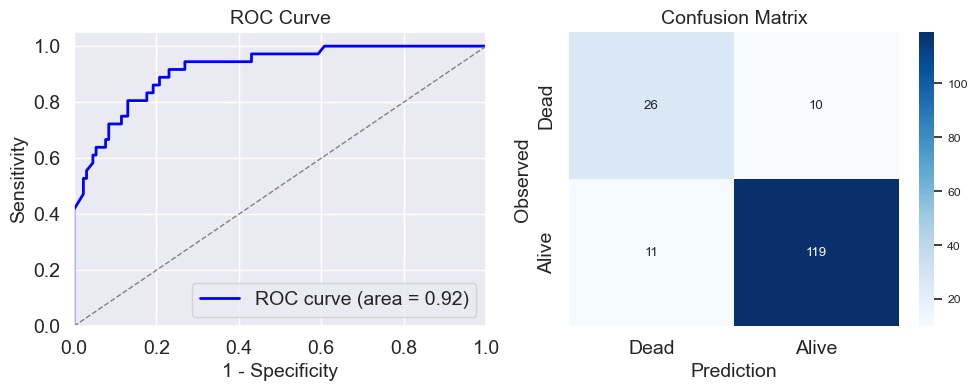

In [182]:
test_preds = best_model.predict_proba(X_evaluation)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_evaluation, test_preds > th) for th in ths])]
f1_xgboost = f1_score(y_evaluation, test_preds > best_th)
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_xgboost = roc_auc_score(y_evaluation, test_preds)
fpr_xgboost, tpr_xgboost, _ = roc_curve(y_evaluation, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_evaluation, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_XB = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_XB = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_XB = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"F1 Score: {round(f1_xgboost,4)}")
print(f"AUC de la curva ROC: {round(auc_roc_xgboost,4)}")
print(f"Precision: {round(precision_XB, 4)}")
print(f"Sensibilidad (Recall): {round(recall_XB, 4)}")
print(f"Especificidad: {round(specificity_XB, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_xgboost, tpr_xgboost, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_xgboost:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()


# Guardar la figura en alta resolución
plt.savefig('XGB_curveROC.png', dpi=300)


plt.show()

Finalmente, se presenta un histograma que ilustra la distribución de las probabilidades predichas bajo los datos de test:

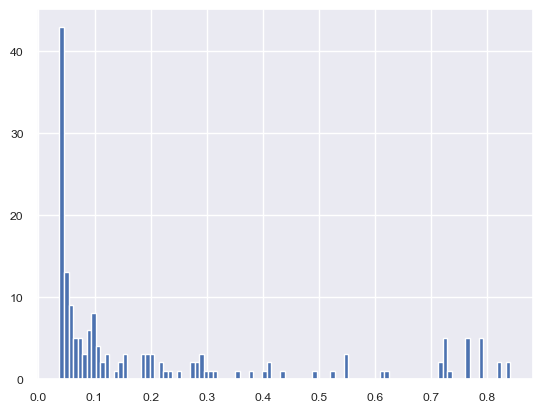

In [183]:
plt.hist(test_preds, bins=100)
plt.show()

#### Red neuronal tradicional

Nos adentraremos en el ámbito de las redes neuronales, un campo donde interactuamos con una amplia variedad de hiperparámetros. Estos incluyen el número de capas ocultas y la cantidad de neuronas por capa, la tasa de aprendizaje inicial, el factor alpha para mitigar el sobreajuste, el tamaño del lote de datos y el límite máximo de iteraciones. En cuanto a la estructura de la red, se ha establecido una configuración que crea una arquitectura de red neuronal "piramidal", donde cada capa subsiguiente tiene la mitad del número de neuronas de la capa anterior, comenzando con un número de neuronas que es una potencia de 2.

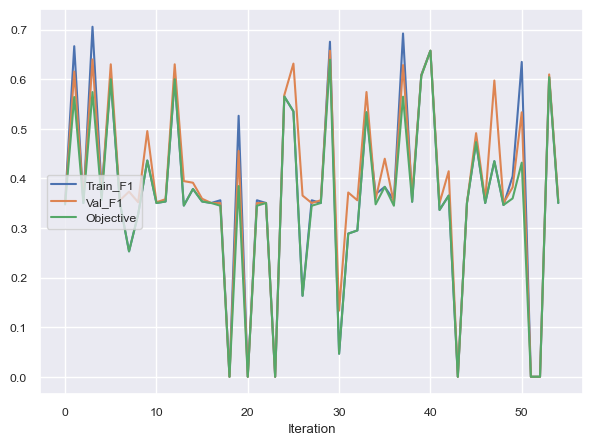

| 55        | 0.3504    | 0.1476    | 10.03     | -0.8969   | 6.673     | 8.078     | -1.356    | 451.4     | 5.489     | 0.8201    | 0.9811    | 0.9846    |


In [184]:
data = collections.defaultdict(list)
def TrainingNNT(type_imputer,strategy,knn_k,num_comp,alpha,solver, hidden_layer_size_exp, lr_init, 
                         beta, batch_size, max_iter ):

    Pre_X = Pipe_Generator(type_imputer,strategy,knn_k,num_comp,alpha)
    
    max_exponent = int(hidden_layer_size_exp)
    if max_exponent<2:
        max_exponent=2
        

    Model_args = dict(
        hidden_layer_sizes = [2**(n) for n in reversed(range(2, max_exponent+1))],
        solver="adam" if solver > 0.5 else "sgd",
        batch_size=2**int(batch_size),
        learning_rate_init=10**lr_init,
        alpha=10**beta,
        max_iter=int(max_iter),
        early_stopping=True,
        random_state=42
    )
    
    Model_RN = MLPClassifier(**Model_args)
    Pipe_Complete = Adding_Model(Pre_X,Model_RN)
    return Training_protocol(Pipe_Complete)

def Target_Function_NNT(**kwargs):
    Pipeline_complete, Objective = TrainingNNT(**kwargs)
    return Objective

Model_pbounds_nnt = {'solver': (0, 1), 
    'hidden_layer_size_exp': (2, 12), 
    'lr_init': (-2, 0), 
    'beta': (-1, 0), 
    'batch_size': (6, 12), 
    'max_iter': (200, 600)
   }

BOptimizer_NNT = BayesianOptimizer(Target_Function_NNT,Model_pbounds_nnt,50)

In [185]:
BOptimizer_NNT.max["params"]

{'alpha': 0.08752578559856267,
 'batch_size': 6.49455170558776,
 'beta': -0.0844379205990704,
 'hidden_layer_size_exp': 7.974734746092953,
 'knn_k': 5.420276709712419,
 'lr_init': -0.6758844978167464,
 'max_iter': 295.71912702177883,
 'num_comp': 16.58273872957414,
 'solver': 0.22976557408536602,
 'strategy': 0.9830086980623106,
 'type_imputer': 0.5590428472290561}

A continuación, se detalla el valor del F1-score, una medida que combina la precisión y la sensibilidad del modelo

In [186]:
f1_train_NNT= BOptimizer_NNT.max['target']; f1_train_NNT

0.6575342465753424

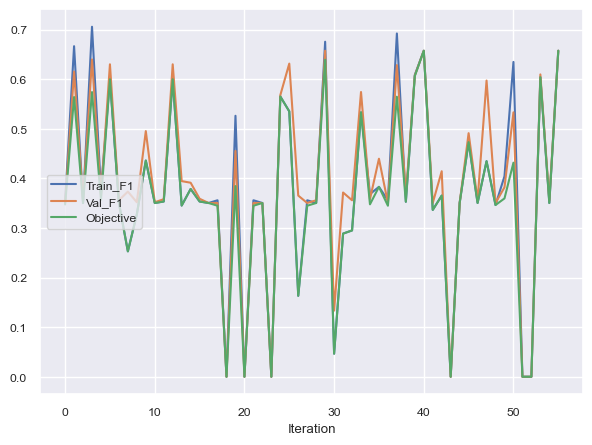

In [187]:
best_model, best_result = TrainingNNT(**BOptimizer_NNT.max["params"])

In [188]:
best_model.fit(X, y)

Pipeline(steps=[('Data Transform',
                 Pipeline(steps=[('General_Edit',
                                  Pipeline(steps=[('SingleImputer_Mediana',
                                                   <__main__.ImputadorPersonalizado object at 0x30d550a30>)])),
                                 ('Columns Transform',
                                  ColumnTransformer(transformers=[('Numerical '
                                                                   'Transform',
                                                                   Pipeline(steps=[('Estandarización',
                                                                                    ScalerTransformer(threshold=0)),
                                                                                   ('PCA',
                                                                                    <__main__.PCA_Num object at 0x30d552c50>...
                                                                    'atencion_centro_mas_lejano',
                                                                    'nivel_vulnerabilidad_DANE',
                                                                    'riesgo_embarazo_adolescente_DANE',
                                                                    'elegibilidad_jovenes_empleo_DANE',
                                                                    'score_severidad_lesiones_new'])]))])),
                ('Model',
                 MLPClassifier(alpha=0.8233075146415866, batch_size=64,
                               early_stopping=True,
                               hidden_layer_sizes=[128, 64, 32, 16, 8, 4],
                               learning_rate_init=0.21091890217717824,
                               max_iter=295, random_state=42, solver='sgd'))])

Otras métricas basado en los datos de entrenamiento:

AUC de la curva ROC: 0.8942
Precision: 0.7971
Sensibilidad (Recall): 0.6627
Especificidad: 0.9539


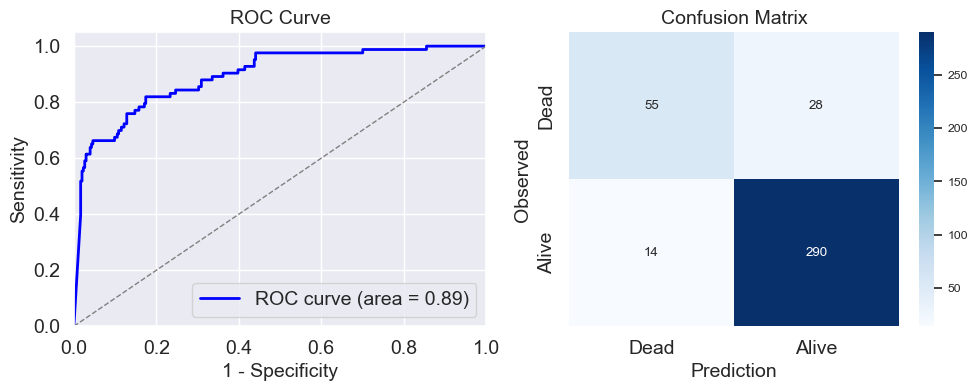

In [189]:
test_preds = best_model.predict_proba(X_train)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_train, test_preds > th) for th in ths])]
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_train_NNT = roc_auc_score(y_train, test_preds)
fpr_NNT , tpr_NNT , _ = roc_curve(y_train, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_train, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_train_NNT = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_train_NNT  = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_train_NNT  = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"AUC de la curva ROC: {round(auc_roc_train_NNT, 4)}")
print(f"Precision: {round(precision_train_NNT, 4)}")
print(f"Sensibilidad (Recall): {round(recall_train_NNT, 4)}")
print(f"Especificidad: {round(specificity_train_NNT, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_NNT, tpr_NNT, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_train_NNT:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()
plt.show()

Se aplica el modelo óptimo al conjunto de validación, derivado de la partición del dataset:

F1 Score: 0.7317
AUC de la curva ROC: 0.9002
Precision: 0.6522
Sensibilidad (Recall): 0.8333
Especificidad: 0.8769


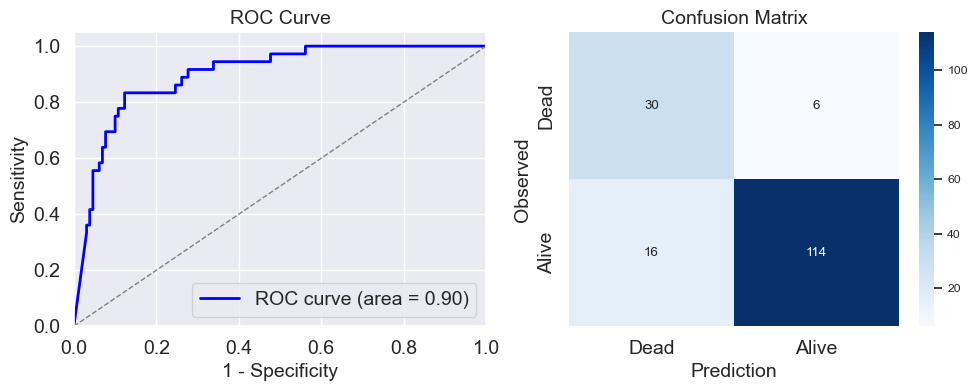

In [190]:
test_preds = best_model.predict_proba(X_evaluation)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_evaluation, test_preds > th) for th in ths])]
f1_nnt = f1_score(y_evaluation, test_preds > best_th)
y_pred_bin = test_preds > best_th

# Calcular AUC-ROC usando las predicciones binarias
auc_roc_nnt = roc_auc_score(y_evaluation, test_preds)
fpr_nnt, tpr_nnt, _ = roc_curve(y_evaluation, test_preds)

# Calcular la matriz de confusión
cm = confusion_matrix(y_evaluation, y_pred_bin)
tn, fp, fn, tp = cm.ravel()

# Reordenar la matriz de confusión para poner los "muertos" (1) primero
cm_reordered = np.array([[tp, fn], [fp, tn]])

# Calcular Precision, Sensibilidad (Recall), Especificidad y F1 Score
precision_NNT = tp / (tp + fp) if (tp + fp) != 0 else 0
recall_NNT = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensibilidad
specificity_NNT = tn / (tn + fp) if (tn + fp) != 0 else 0  # Especificidad

print(f"F1 Score: {round(f1_nnt,4)}")
print(f"AUC de la curva ROC: {round(auc_roc_nnt,4)}")
print(f"Precision: {round(precision_NNT, 4)}")
print(f"Sensibilidad (Recall): {round(recall_NNT, 4)}")
print(f"Especificidad: {round(specificity_NNT, 4)}")

# Crear un panel 1x2 para mostrar las dos gráficas juntas
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Graficar la curva ROC
ax[0].plot(fpr_nnt, tpr_nnt, color='blue', lw=2, label=f'ROC curve (area = {auc_roc_nnt:.2f})')
ax[0].plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
ax[0].set_xlim([0.0, 1.0])
ax[0].set_ylim([0.0, 1.05])
ax[0].set_xlabel('1 - Specificity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje X
ax[0].set_ylabel('Sensitivity', fontsize=14)  # Ajuste del tamaño de la fuente para la etiqueta del eje Y
ax[0].set_title('ROC Curve', fontsize=14)  # Ajuste del tamaño de la fuente para el título
ax[0].legend(loc="lower right", fontsize=14)  # Ajuste del tamaño de la fuente para la leyenda
ax[0].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

# Graficar la matriz de confusión
sns.heatmap(cm_reordered, annot=True, fmt='d', cmap='Blues', xticklabels=['Dead', 'Alive'], yticklabels=['Dead', 'Alive'], ax=ax[1])
ax[1].set_ylabel('Observed', fontsize=14)
ax[1].set_xlabel('Prediction', fontsize=14)
ax[1].set_title('Confusion Matrix', fontsize=14)
ax[1].tick_params(axis='both', labelsize=14)  # Ajuste del tamaño de la fuente para las etiquetas de los ticks

plt.tight_layout()


# Guardar la figura en alta resolución
plt.savefig('RedN_curveROC.png', dpi=300)

plt.show()



Finalmente, se presenta un histograma que ilustra la distribución de las probabilidades predichas bajo los datos de test:

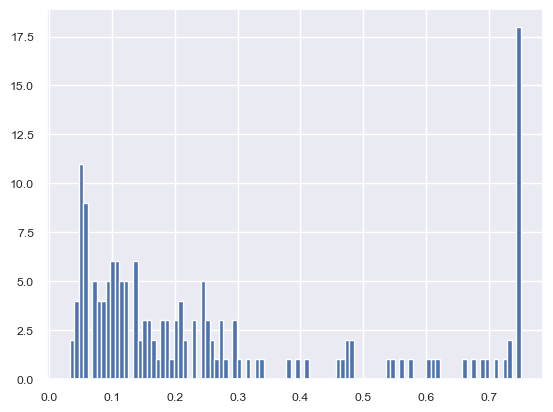

In [191]:
plt.hist(test_preds, bins=100)
plt.show()

#### Resumen métricas de desempeño

In [192]:
# TEST
metricas = {
    'Baseline': F1_MBase,
    'Reg Logística' : round(f1_regLogistica,4),
    'Reg Logística Lasso': round(f1_lasso,4),
    'Reg Logística Ridge': round(f1_ridge,4),
    'Reg Logística ElasticNet': round(f1_elastic_net,4),
    'SVC kernel sigmoide': round(f1_svc_sig,4),
    'SVC kernel rbf': round(f1_svc_rbf,4),
    'SVC kernel linear': round(f1_svc_lin,4),
    'SVC kernel polinómico': round(f1_svc_poli,4),
    'Random forest': round(f1_rand_forst,4),
    'XGBoost': round(f1_xgboost,4),
    'Red neuronal tradicional': round(f1_nnt,4),
}
print("Modelos candidatos junto a su F1-score (validación):")
for modelo, f1score in metricas.items():
    print(f"{modelo}: {f1score}")

# TRAIN
metricas2 = {
    'Baseline': F1_MBase,
    'Reg Logística': round(BOptimizer_Logit.max['target'], 4),
    'Reg Logística Lasso': round(BOptimizer_Logit_lasso.max['target'], 4),
    'Reg Logística Ridge': round(BOptimizer_Logit_ridge.max['target'], 4),
    'Reg Logística ElasticNet': round(BOptimizer_Logit_elastic.max['target'], 4),
    'SVC kernel sigmoide': round(BOptimizer_SVMSg.max['target'], 4),
    'SVC kernel rbf': round(BOptimizer_SVMRbf.max['target'], 4),
    'SVC kernel linear': round(BOptimizer_SVMLin.max['target'], 4),
    'SVC kernel polinómico': round(BOptimizer_SVMPoly.max['target'], 4),
    'Random forest': round(BOptimizer_Random_Forest.max['target'], 4),
    'XGBoost': round(BOptimizer_XG_Boost.max['target'], 4),
    'Red neuronal tradicional': round(BOptimizer_NNT.max['target'], 4)
}
print("Modelos candidatos junto a su F1-score (entrenamiento):")
print(metricas2)

def best_model_select(metricas,X_df, y_df):
    df_metricas = pd.DataFrame.from_dict(metricas, orient='index', columns=['F1-score'])
    valor_maximo = df_metricas['F1-score'].max()
    indice_maximo = df_metricas['F1-score'].idxmax()

    print("\nAnálisis de resultados:")

    if indice_maximo == 'Reg. Logística':
        bestmodel, best_result= TrainingLogit(**BOptimizer_Logit.max['params'])
    elif indice_maximo == 'Reg. Logística - Lasso':
        bestmodel, best_result= TrainingLogit_lasso(**BOptimizer_Logit_lasso.max['params'])
    elif indice_maximo == 'Reg. Logística - Ridge':
        bestmodel, best_result= TrainingLogit_ridge(**BOptimizer_Logit_ridge.max['params'])
    elif indice_maximo== 'Reg. Logística - ElasticNet':
        bestmodel, best_result= TrainingLogit_elastic(**BOptimizer_Logit_elastic.max['params'])
    elif indice_maximo == 'SVC - kernel: sigmoide':
        bestmodel, best_result= TrainingSVM_Sigmoide(**BOptimizer_SVMSg.max['params'])
    elif indice_maximo == 'SVC - kernel: rbf':
        bestmodel, best_result= TrainingSVM_RBF(**BOptimizer_SVMRbf.max['params'])
    elif indice_maximo == 'SVC - kernel: linear':
        bestmodel, best_result= TrainingSVM_linear(**BOptimizer_SVMLin.max['params']) 
    elif indice_maximo == 'SVC - kernel: polinomico':
        bestmodel, best_result= TrainingSVM_poly(**BOptimizer_SVMPoly.max['params'])     
    elif indice_maximo == 'Random forest':
        bestmodel, best_result= TrainingRandom_Forest(**BOptimizer_Random_Forest.max['params'])  
    elif indice_maximo == 'XGBoost':
        bestmodel, best_result= TrainingXGBoost(**BOptimizer_XG_Boost.max['params'])  
    else:
        bestmodel, best_result= TrainingNNT(**BOptimizer_NNT.max['params'])

    return bestmodel.fit(X_df,y_df), indice_maximo, print(f"Modelo de clasificación seleccionado: {indice_maximo} con un F1-score de {valor_maximo}")


Modelos candidatos junto a su F1-score (validación):
Baseline: 0.0
Reg Logística: 0.6591
Reg Logística Lasso: 0.6667
Reg Logística Ridge: 0.6591
Reg Logística ElasticNet: 0.6512
SVC kernel sigmoide: 0.6071
SVC kernel rbf: 0.9714
SVC kernel linear: 0.7013
SVC kernel polinómico: 0.6857
Random forest: 0.7027
XGBoost: 0.7123
Red neuronal tradicional: 0.7317
Modelos candidatos junto a su F1-score (entrenamiento):
{'Baseline': 0.0, 'Reg Logística': 0.6222, 'Reg Logística Lasso': 0.6098, 'Reg Logística Ridge': 0.6105, 'Reg Logística ElasticNet': 0.6039, 'SVC kernel sigmoide': 0.5823, 'SVC kernel rbf': 0.3504, 'SVC kernel linear': 0.6364, 'SVC kernel polinómico': 0.6486, 'Random forest': 0.6845, 'XGBoost': 0.6226, 'Red neuronal tradicional': 0.6575}


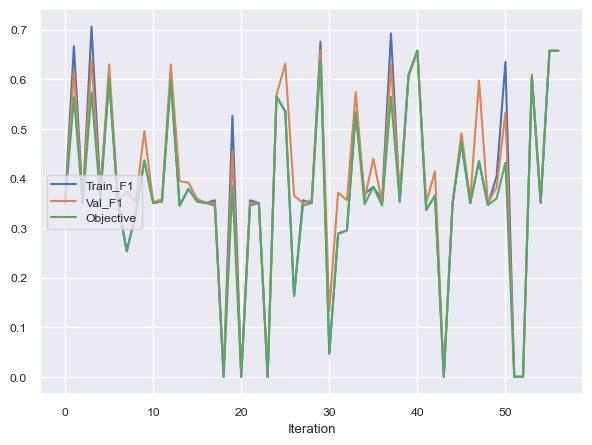

Modelo de clasificación seleccionado: SVC kernel rbf con un F1-score de 0.9714


In [193]:
best_model, nombre_model, _ = best_model_select(metricas,X,y)

test_preds = best_model.predict_proba(X_evaluation)[:, 1]
train_preds = best_model.predict_proba(X_train)[:, 1]
ths = np.linspace(0, 1, 1000)
best_th = ths[np.argmax([f1_score(y_evaluation, test_preds>th) for th in ths])]

#### Curva ROC y AUC

Para comparar múltiples modelos, se opta por graficar todas las curvas ROC en un mismo gráfico, lo que permite una comparación visual directa de sus desempeños. Un AUC más alto indica un mejor rendimiento del modelo en la discriminación entre las clases “muerto” y “vivo”.

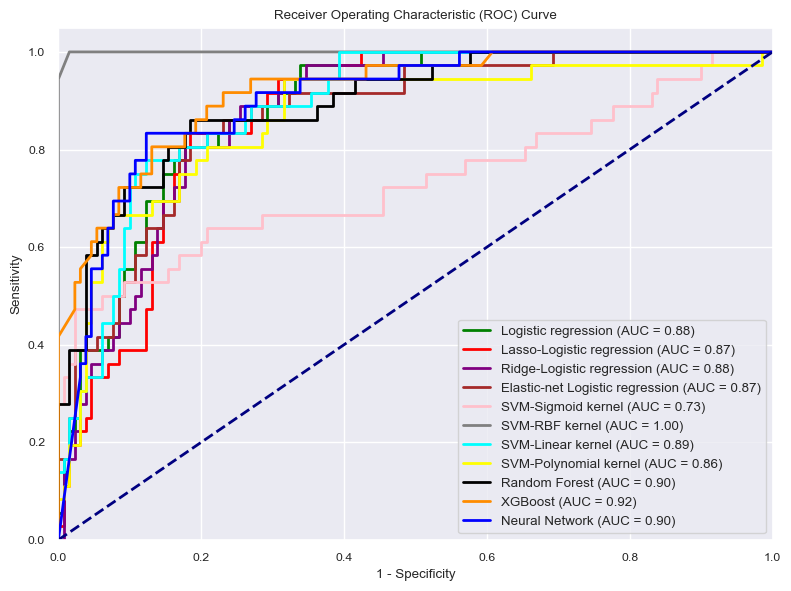

In [194]:
plt.figure(figsize=(8, 6))
plt.plot(fpr_Logit, tpr_Logit, color='green', lw=2, label=f'Logistic regression (AUC = {auc_roc_Logit:.2f})')
plt.plot(fpr_Logit_lasso, tpr_Logit_lasso, color='red', lw=2, label=f'Lasso-Logistic regression (AUC = {auc_roc_Logit_lasso:.2f})')
plt.plot(fpr_Logit_ridge, tpr_Logit_ridge, color='purple', lw=2, label=f'Ridge-Logistic regression (AUC = {auc_roc_Logit_ridge:.2f})')
plt.plot(fpr_Logit_elastic, tpr_Logit_elastic, color='brown', lw=2, label=f'Elastic-net Logistic regression (AUC = {auc_roc_Logit_elastic:.2f})')
plt.plot(fpr_SVM_Sigmoide, tpr_SVM_Sigmoide, color='pink', lw=2, label=f'SVM-Sigmoid kernel (AUC = {auc_roc_SVM_Sigmoide:.2f})')
plt.plot(fpr_SVM_RBF, tpr_SVM_RBF, color='grey', lw=2, label=f'SVM-RBF kernel (AUC = {auc_roc_SVM_RBF:.2f})')
plt.plot(fpr_SVM_linear, tpr_SVM_linear, color='cyan', lw=2, label=f'SVM-Linear kernel (AUC = {auc_roc_SVM_linear:.2f})')
plt.plot(fpr_SVM_poly, tpr_SVM_poly, color='yellow', lw=2, label=f'SVM-Polynomial kernel (AUC = {auc_roc_SVM_poly:.2f})')
plt.plot(fpr_Random_Forest, tpr_Random_Forest, color='black', lw=2, label=f'Random Forest (AUC = {auc_roc_Random_Forest:.2f})')
plt.plot(fpr_xgboost, tpr_xgboost, color='darkorange', lw=2, label=f'XGBoost (AUC = {auc_roc_xgboost:.2f})')
plt.plot(fpr_nnt, tpr_nnt, color='blue', lw=2, label=f'Neural Network (AUC = {auc_roc_nnt:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('1 - Specificity')
plt.ylabel('Sensitivity')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='best', fontsize='medium', title='')

plt.tight_layout()

# Guardar la figura en alta resolución
plt.savefig('roc_curve.png', dpi=300)

plt.show()

#### Resumen métricas de desempeño

In [195]:
# Definición de las columnas con MultiIndex
columns = pd.MultiIndex.from_tuples([
    ('', 'Models'),
    ('F1', 'Train'),
    ('F1', 'Test'),
    ('Sensitivity', 'Train'),
    ('Sensitivity', 'Test'),
    ('Specificity', 'Train'),
    ('Specificity', 'Test'),
    ('AUC', 'Train'),
    ('AUC', 'Test')
])

tabla_metricas = pd.DataFrame(columns=columns)

def agregar_modelo(tabla_metricas, modelo, f1_train, f1_test, sensibilidad_train, sensibilidad_test, especificidad_train, especificidad_test, auc_train, auc_test):
    nueva_fila = {
        ('', 'Models'): modelo,
        ('F1', 'Train'): f1_train,
        ('F1', 'Test'): f1_test,
        ('Sensitivity', 'Train'): sensibilidad_train,
        ('Sensitivity', 'Test'): sensibilidad_test,
        ('Specificity', 'Train'): especificidad_train,
        ('Specificity', 'Test'): especificidad_test,
        ('AUC', 'Train'): auc_train,
        ('AUC', 'Test'): auc_test
    }
    return tabla_metricas.append(nueva_fila, ignore_index=True)

# Modelos
modelo1 = "Logistic regression"
f1_train1 = f1_train_regLogistica
f1_test1 = f1_regLogistica
sensibilidad_train1 = recall_train_regLogistica
sensibilidad_test1 = recall_regLogistica
especificidad_train1 = specificity_train_regLogistica
especificidad_test1 = specificity_regLogistica
auc_train1 = auc_roc_train_Logit
auc_test1 = auc_roc_Logit

modelo2 = "Lasso-Logistic regression"
f1_train2 = f1_train_regLogistica_lasso
f1_test2 = f1_lasso
sensibilidad_train2 = recall_train_regLogistica_lasso
sensibilidad_test2 = recall_lasso
especificidad_train2 = specificity_train_regLogistica_lasso
especificidad_test2 = specificity_lasso
auc_train2 = auc_roc_train_Logit_lasso
auc_test2 = auc_roc_Logit_lasso


modelo3 =  "Ridge-Logistic regression"
f1_train3 = f1_train_regLogistica_ridge
f1_test3 = f1_ridge
sensibilidad_train3 = recall_train_regLogistica_ridge
sensibilidad_test3 = recall_ridge
especificidad_train3 = specificity_train_regLogistica_ridge
especificidad_test3 = specificity_ridge
auc_train3 = auc_roc_train_Logit_ridge
auc_test3 = auc_roc_Logit_ridge

modelo4 =  "Elastic-net Logistic regression"
f1_train4 = f1_train_regLogistica_elastic
f1_test4 = f1_elastic_net
sensibilidad_train4 = recall_train_regLogistica_elastic
sensibilidad_test4 =  recall_elastic 
especificidad_train4 = specificity_train_regLogistica_elastic
especificidad_test4 = specificity_elastic
auc_train4 = auc_roc_train_Logit_elastic 
auc_test4 = auc_roc_Logit_elastic


modelo5 =  "SVM-Sigmoid kernel"
f1_train5 = f1_train_SVM_sigmoide
f1_test5 = f1_svc_sig
sensibilidad_train5 = recall_train_SVM_sigmoide
sensibilidad_test5 =  recall_SVM_Sigmoide 
especificidad_train5 = specificity_train_SVM_sigmoide
especificidad_test5 = specificity_SVM_Sigmoide
auc_train5 = auc_roc_train_SVM_sigmoide 
auc_test5 = auc_roc_SVM_Sigmoide


modelo6 =  "SVM-RBF kernel"
f1_train6 = f1_train_SVM_rbf
f1_test6 = f1_svc_rbf
sensibilidad_train6 = recall_train_SVM_rbf
sensibilidad_test6 =  recall_SVM_rbf 
especificidad_train6 = specificity_train_SVM_rbf
especificidad_test6 = specificity_SVM_rbf
auc_train6 = auc_roc_train_SVM_rbf 
auc_test6 = auc_roc_SVM_RBF


modelo7 =  "SVM-Linear kernel"
f1_train7 = f1_train_SVM_lin
f1_test7 = f1_svc_lin
sensibilidad_train7 = recall_train_SVM_lin
sensibilidad_test7 =  recall_SVM_lin 
especificidad_train7 = specificity_train_SVM_lin
especificidad_test7 = specificity_SVM_lin
auc_train7 = auc_roc_train_SVM_lin
auc_test7 = auc_roc_SVM_linear


modelo8 =  "SVM-Polynomial kernel"
f1_train8 = f1_train_SVM_Poly
f1_test8 = f1_svc_poli
sensibilidad_train8 = recall_train_SVM_poly
sensibilidad_test8 =  recall_poly 
especificidad_train8 = specificity_train_SVM_poly
especificidad_test8 = specificity_poly
auc_train8 = auc_roc_train_SVM_poly 
auc_test8 = auc_roc_SVM_poly


modelo9 =  "Random Forest"
f1_train9 = f1_train_RF
f1_test9 = f1_rand_forst
sensibilidad_train9 = recall_train_RF
sensibilidad_test9 =  recall_RF 
especificidad_train9 = specificity_train_RF
especificidad_test9 = specificity_RF
auc_train9 = auc_roc_train_RF 
auc_test9 = auc_roc_Random_Forest


modelo10 =  "XGBoost"
f1_train10 = f1_train_XG
f1_test10 = f1_xgboost
sensibilidad_train10 = recall_train_XB
sensibilidad_test10 =  recall_XB 
especificidad_train10 = specificity_train_XB
especificidad_test10 = specificity_XB
auc_train10 = auc_roc_train_XB 
auc_test10 = auc_roc_xgboost


modelo11 =  "Neural Network"
f1_train11 = f1_train_NNT
f1_test11 = f1_nnt
sensibilidad_train11 = recall_train_NNT
sensibilidad_test11 =  recall_NNT 
especificidad_train11 = specificity_train_NNT
especificidad_test11 = specificity_NNT
auc_train11 = auc_roc_train_NNT 
auc_test11 = auc_roc_nnt


# Agregar modelos al DataFrame utilizando las variables predefinidas
tabla_metricas = agregar_modelo(tabla_metricas, modelo1, f1_train1, f1_test1, sensibilidad_train1, sensibilidad_test1, especificidad_train1, especificidad_test1, auc_train1, auc_test1)
tabla_metricas = agregar_modelo(tabla_metricas, modelo2, f1_train2, f1_test2, sensibilidad_train2, sensibilidad_test2, especificidad_train2, especificidad_test2, auc_train2, auc_test2)
tabla_metricas = agregar_modelo(tabla_metricas, modelo3, f1_train3, f1_test3, sensibilidad_train3, sensibilidad_test3, especificidad_train3, especificidad_test3, auc_train3, auc_test3)
tabla_metricas = agregar_modelo(tabla_metricas, modelo4, f1_train4, f1_test4, sensibilidad_train4, sensibilidad_test4, especificidad_train4, especificidad_test4, auc_train4, auc_test4)
tabla_metricas = agregar_modelo(tabla_metricas, modelo5, f1_train5, f1_test5, sensibilidad_train5, sensibilidad_test5, especificidad_train5, especificidad_test5, auc_train5, auc_test5)
tabla_metricas = agregar_modelo(tabla_metricas, modelo6, f1_train6, f1_test6, sensibilidad_train6, sensibilidad_test6, especificidad_train6, especificidad_test6, auc_train6, auc_test6)
tabla_metricas = agregar_modelo(tabla_metricas, modelo7, f1_train7, f1_test7, sensibilidad_train7, sensibilidad_test7, especificidad_train7, especificidad_test7, auc_train7, auc_test7)
tabla_metricas = agregar_modelo(tabla_metricas, modelo8, f1_train8, f1_test8, sensibilidad_train8, sensibilidad_test8, especificidad_train8, especificidad_test8, auc_train8, auc_test8)
tabla_metricas = agregar_modelo(tabla_metricas, modelo9, f1_train9, f1_test9, sensibilidad_train9, sensibilidad_test9, especificidad_train9, especificidad_test9, auc_train9, auc_test9)
tabla_metricas = agregar_modelo(tabla_metricas, modelo10, f1_train10, f1_test10, sensibilidad_train10, sensibilidad_test10, especificidad_train10, especificidad_test10, auc_train10, auc_test10)
tabla_metricas = agregar_modelo(tabla_metricas, modelo11, f1_train11, f1_test11, sensibilidad_train11, sensibilidad_test11, especificidad_train11, especificidad_test11, auc_train11, auc_test11)

tabla_metricas

F1      Sensitivity      Specificity  \
                             Models Train Test       Train Test       Train   
0               Logistic regression  0.62 0.66        0.66 0.81        0.92   
1         Lasso-Logistic regression  0.61 0.67        0.82 0.83        0.78   
2         Ridge-Logistic regression  0.61 0.66        0.60 0.81        0.95   
3   Elastic-net Logistic regression  0.61 0.65        0.67 0.78        0.93   
4                SVM-Sigmoid kernel  0.58 0.61        0.60 0.47        0.88   
5                    SVM-RBF kernel  0.35 0.97        1.00 0.94        1.00   
6                 SVM-Linear kernel  0.64 0.70        0.64 0.75        0.96   
7             SVM-Polynomial kernel  0.65 0.69        0.57 0.67        0.96   
8                     Random Forest  0.68 0.70        0.59 0.72        0.98   
9                           XGBoost  0.62 0.71        0.80 0.72        0.96   
10                   Neural Network  0.66 0.73        0.66 0.83        0.95   

          AUC       
   Test Train Test  
0  0.82  0.90 0.88  
1  0.82  0.88 0.87  
2  0.82  0.90 0.88  
3  0.83  0.91 0.87  
4  0.98  0.76 0.73  
5  1.00  1.00 1.00  
6  0.89  0.90 0.89  
7  0.92  0.84 0.86  
8  0.91  0.89 0.90  
9  0.92  0.94 0.92  
10 0.88  0.89 0.90